In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [25]:
path = '/kaggle/input/av-healthcare-analytics-ii/healthcare/train_data.csv'
data = pd.read_csv(path)
data.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [26]:

data.info()
data.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
count,318438.000000,318438.000000,318438,318438.000000,318438,318438.000000,318438,318438,318438,318325.000000,318438.000000,313906.000000,318438,318438,318438.000000,318438,318438.000000,318438
unique,NaN,NaN,7,NaN,3,NaN,5,6,6,NaN,NaN,NaN,3,3,NaN,10,NaN,11
top,NaN,NaN,a,NaN,X,NaN,gynecology,R,F,NaN,NaN,NaN,Trauma,Moderate,NaN,41-50,NaN,21-30
freq,NaN,NaN,143425,NaN,133336,NaN,249486,127947,112753,NaN,NaN,NaN,152261,175843,NaN,63749,NaN,87491
mean,159219.500000,18.318841,NaN,4.771717,NaN,3.197627,NaN,NaN,NaN,2.625807,65747.579472,7.251859,NaN,NaN,3.284099,NaN,4880.749392,NaN
std,91925.276848,8.633755,NaN,3.102535,NaN,1.168171,NaN,NaN,NaN,0.873146,37979.936440,4.745266,NaN,NaN,1.764061,NaN,1086.776254,NaN
min,1.000000,1.000000,NaN,1.000000,NaN,0.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,NaN,NaN,0.000000,NaN,1800.000000,NaN
25%,79610.250000,11.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,2.000000,32847.000000,4.000000,NaN,NaN,2.000000,NaN,4186.000000,NaN
50%,159219.500000,19.000000,NaN,5.000000,NaN,3.000000,NaN,NaN,NaN,3.000000,65724.500000,8.000000,NaN,NaN,3.000000,NaN,4741.000000,NaN
75%,238828.750000,26.000000,NaN,7.000000,NaN,4.000000,NaN,NaN,NaN,3.000000,98470.000000,8.000000,NaN,NaN,4.000000,NaN,5409.000000,NaN


In [27]:
data.describe()

,case_id,Hospital_code,City_Code_Hospital,Available Extra Rooms in Hospital,Bed Grade,patientid,City_Code_Patient,Visitors with Patient,Admission_Deposit
count,318438.000000,318438.000000,318438.000000,318438.000000,318325.000000,318438.000000,313906.000000,318438.000000,318438.000000
mean,159219.500000,18.318841,4.771717,3.197627,2.625807,65747.579472,7.251859,3.284099,4880.749392
std,91925.276848,8.633755,3.102535,1.168171,0.873146,37979.936440,4.745266,1.764061,1086.776254
min,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1800.000000
25%,79610.250000,11.000000,2.000000,2.000000,2.000000,32847.000000,4.000000,2.000000,4186.000000
50%,159219.500000,19.000000,5.000000,3.000000,3.000000,65724.500000,8.000000,3.000000,4741.000000
75%,238828.750000,26.000000,7.000000,4.000000,3.000000,98470.000000,8.000000,4.000000,5409.000000
max,318438.000000,32.000000,13.000000,24.000000,4.000000,131624.000000,38.000000,32.000000,11008.000000


In [28]:
missing_values = data.isnull().sum()

# Missing values
print(missing_values)

# # Total number of missing values
total_missing = missing_values.sum()
print(f"# Total number of missing values: {total_missing}")

case_id                                 0
Hospital_code                           0
Hospital_type_code                      0
City_Code_Hospital                      0
Hospital_region_code                    0
Available Extra Rooms in Hospital       0
Department                              0
Ward_Type                               0
Ward_Facility_Code                      0
Bed Grade                             113
patientid                               0
City_Code_Patient                    4532
Type of Admission                       0
Severity of Illness                     0
Visitors with Patient                   0
Age                                     0
Admission_Deposit                       0
Stay                                    0
dtype: int64
# Total number of missing values: 4645


In [29]:
data['Bed Grade'] = data['Bed Grade'].fillna(data['Bed Grade'].median())
data['City_Code_Patient'] = data['City_Code_Patient'].fillna(-1)


In [30]:
data = data.drop(columns=['case_id']) 
data

,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20
318434,24,a,1,X,2,anesthesia,Q,E,4.0,325,8.0,Urgent,Moderate,4,81-90,6699.0,31-40
318435,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20
318436,11,b,2,Y,3,anesthesia,Q,D,3.0,91081,8.0,Trauma,Minor,5,11-20,3761.0,11-20


In [31]:
# Select numerical columns and categorical columns
numerical_cols = data.select_dtypes(include=[np.number]).columns
categorical_cols = data.select_dtypes(exclude=[np.number]).columns

print("numerical columns:", numerical_cols)
print("categorical columns:", categorical_cols)

numerical columns: Index(['Hospital_code', 'City_Code_Hospital',
       'Available Extra Rooms in Hospital', 'Bed Grade', 'patientid',
       'City_Code_Patient', 'Visitors with Patient', 'Admission_Deposit'],
      dtype='object')
categorical columns: Index(['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type',
       'Ward_Facility_Code', 'Type of Admission', 'Severity of Illness', 'Age',
       'Stay'],
      dtype='object')


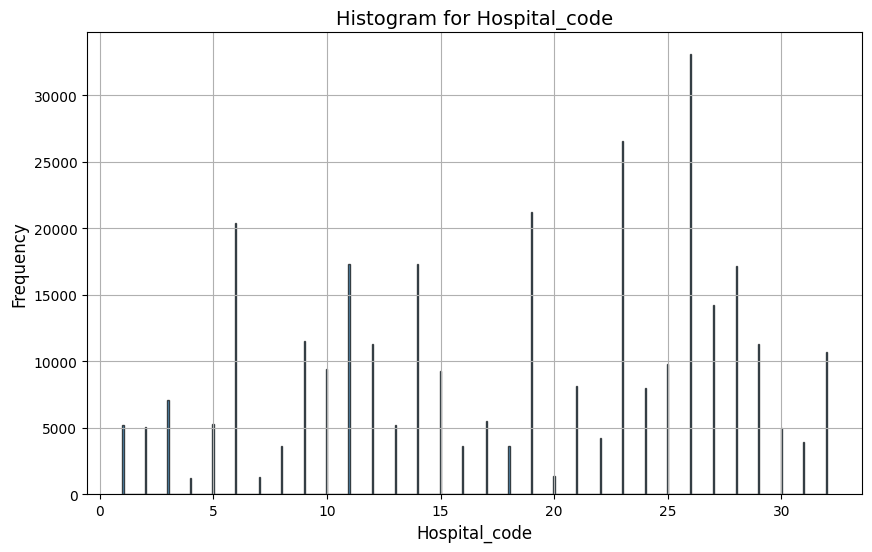

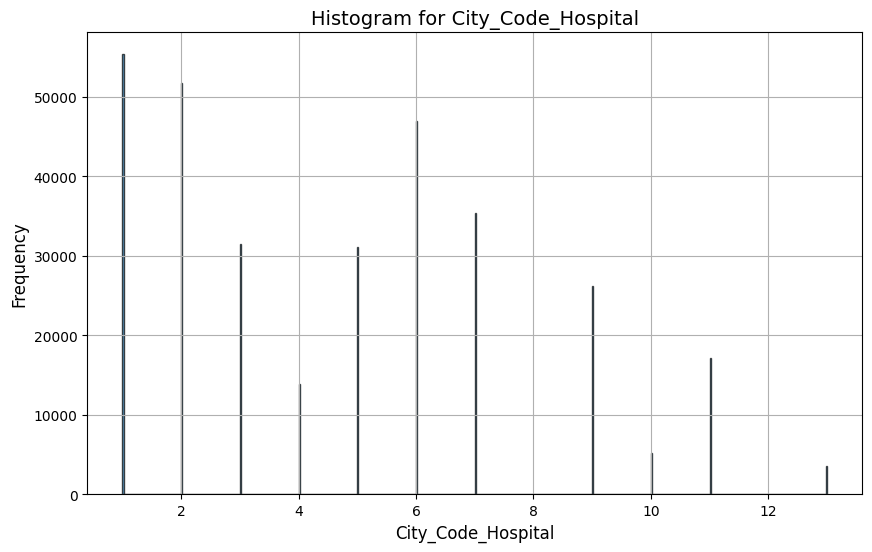

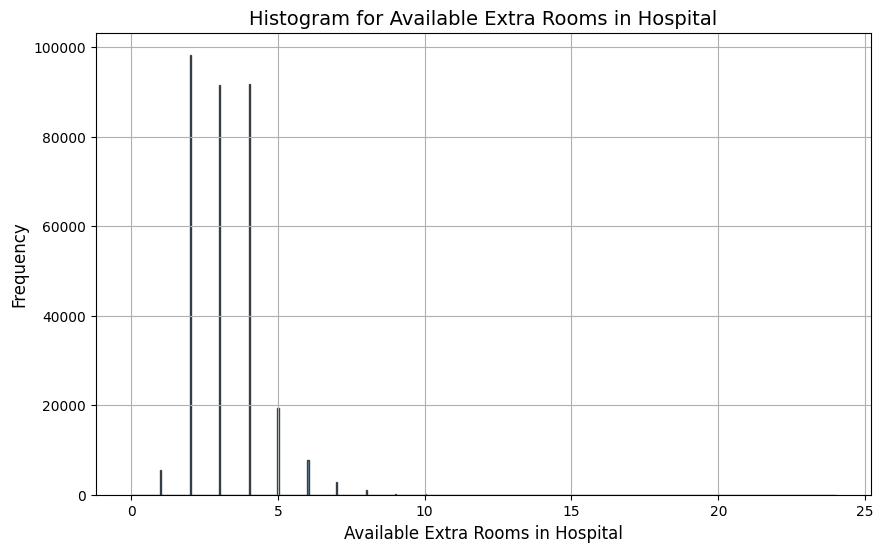

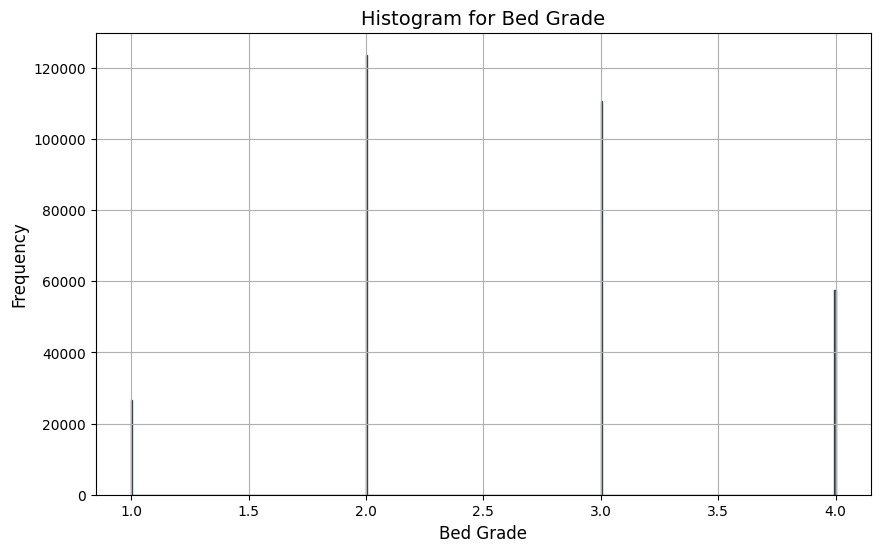

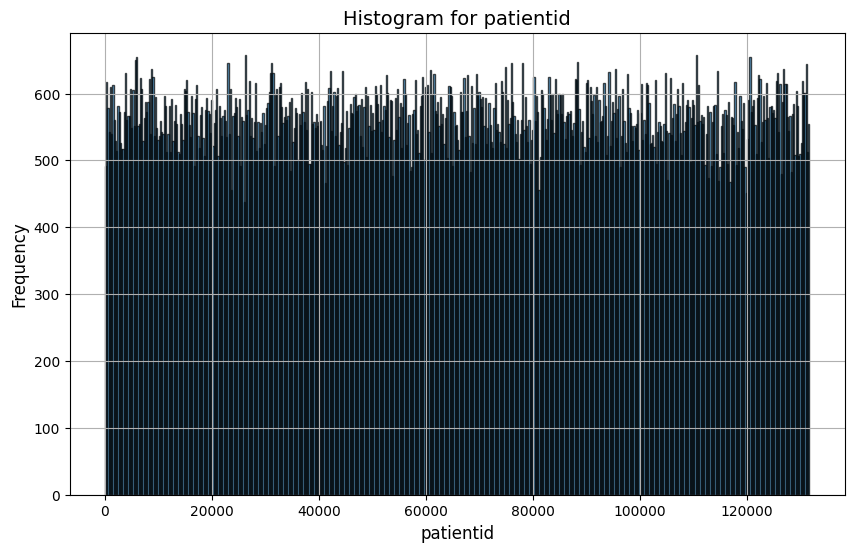

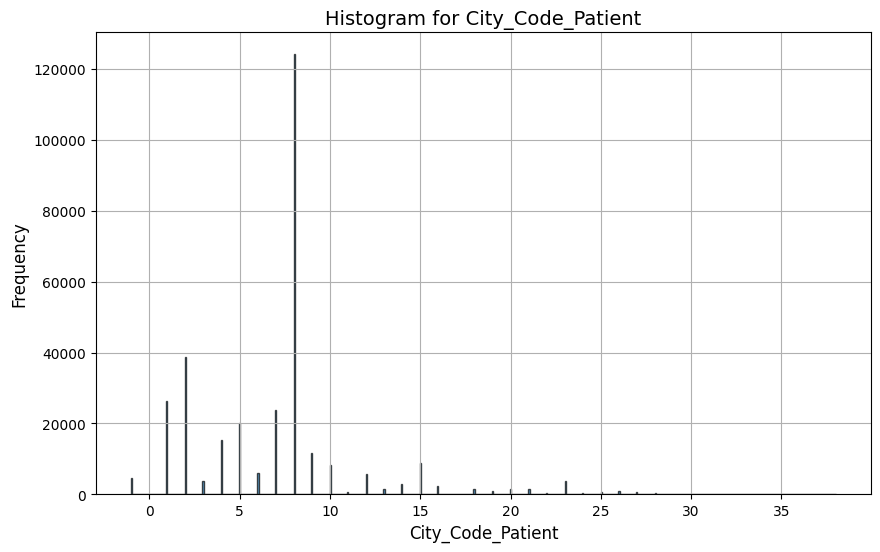

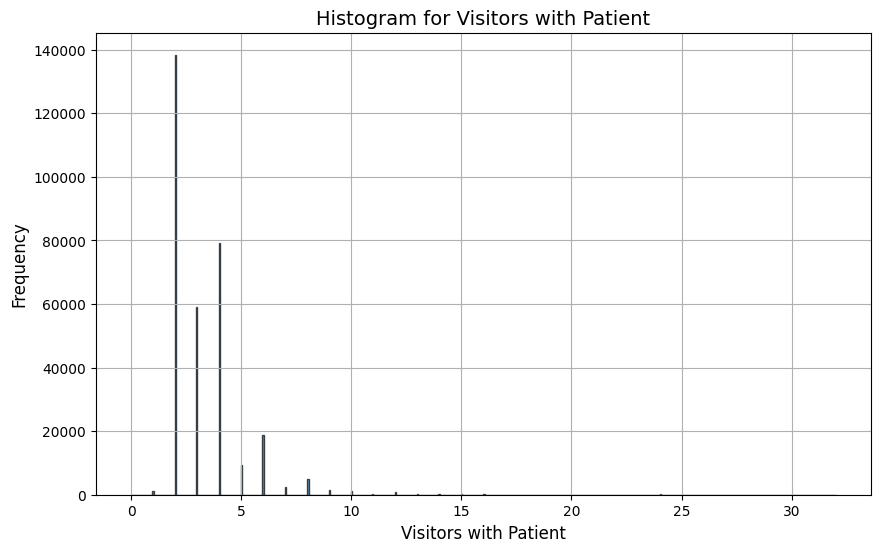

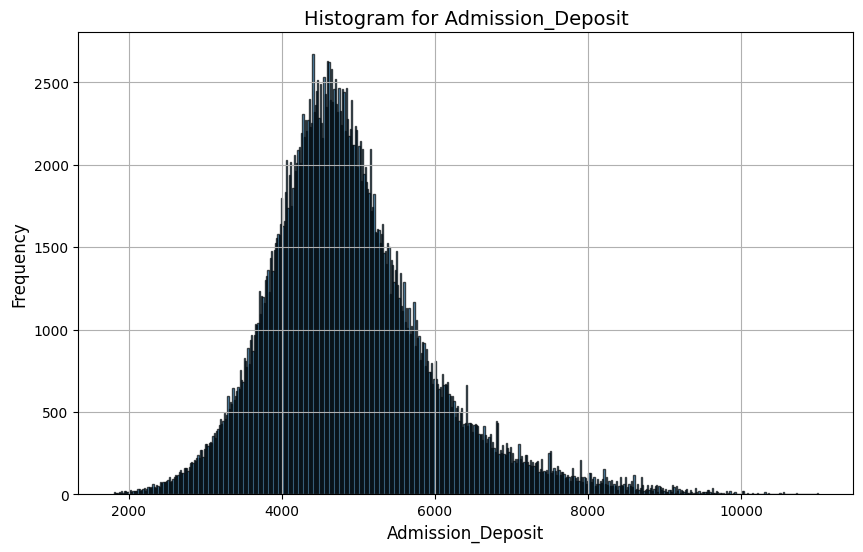


Description of histogram for Hospital_code:
- The number of emissions: 0
- Number of peaks: 30
- Offset: To the left

Description of histogram for City_Code_Hospital:
- The number of emissions: 0
- Number of peaks: 9
- Offset: To the right

Description of histogram for Available Extra Rooms in Hospital:
- The number of emissions: 1351
- Number of peaks: 16
- Offset: To the right

Description of histogram for Bed Grade:
- The number of emissions: 0
- Number of peaks: 2
- Offset: To the right

Description of histogram for patientid:
- The number of emissions: 0
- Number of peaks: 185
- Offset: To the right

Description of histogram for City_Code_Patient:
- The number of emissions: 24780
- Number of peaks: 36
- Offset: To the right

Description of histogram for Visitors with Patient:
- The number of emissions: 9804
- Number of peaks: 26
- Offset: To the right

Description of histogram for Admission_Deposit:
- The number of emissions: 12316
- Number of peaks: 180
- Offset: To the right


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Number of bars for histograms
num_bins = int(np.sqrt(len(data)))

hist_descriptions = {}

# Construction of histograms for numerical features
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    
    # Selection of non-empty values
    col_data = data[col].dropna()
    
    # Creating a histogram
    counts, bin_edges = np.histogram(col_data, bins=num_bins)
    plt.hist(col_data, bins=num_bins, edgecolor='k', alpha=0.7)
    plt.title(f'Histogram for {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(True)
    plt.show()
    
    # Histogram analysis
    # Determination of emissions
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = col_data[(col_data < lower_bound) | (col_data > upper_bound)]
    
    # Determination of the number of peaks
    peaks, _ = find_peaks(counts)
    num_peaks = len(peaks)
    
   # Offset
    skewness = col_data.skew()
    
    hist_descriptions[col] = {
        "The number of emissions": len(outliers),
        "Number of peaks": num_peaks,
        "Offset": "To the left" if skewness < 0 else ("To the right" if skewness > 0 else "Symmetrical")
    }

# Display the description of histograms
for col, desc in hist_descriptions.items():
    print(f"\nDescription of histogram for {col}:")
    for key, value in desc.items():
        print(f"- {key}: {value}")


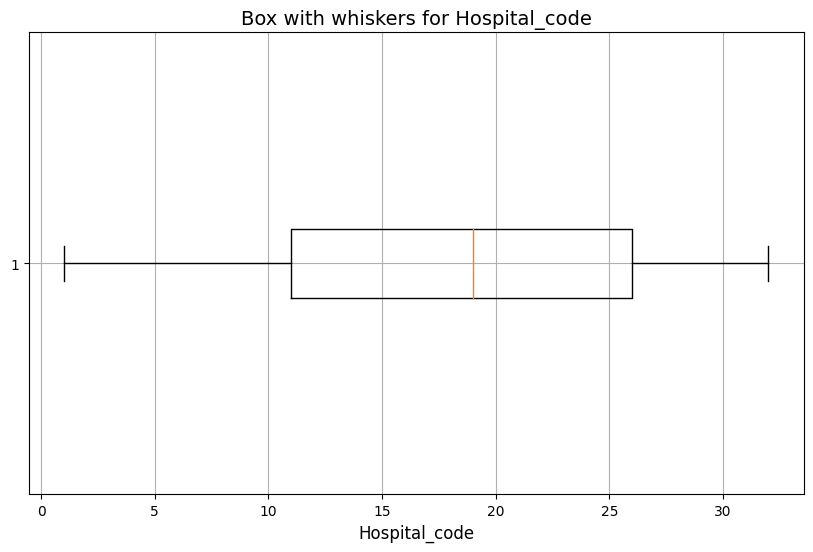

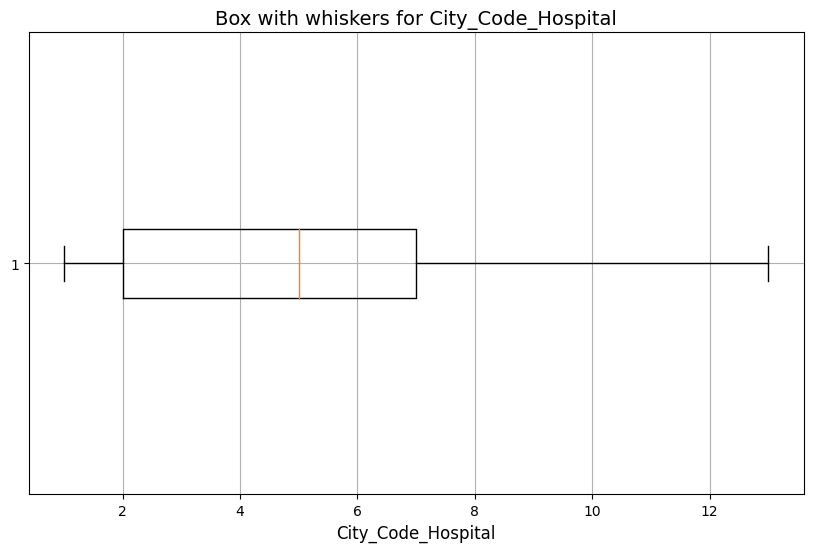

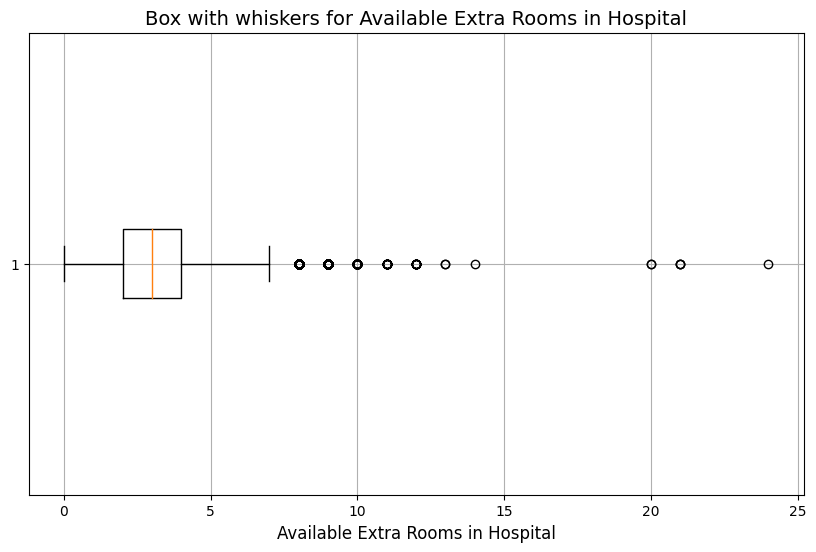

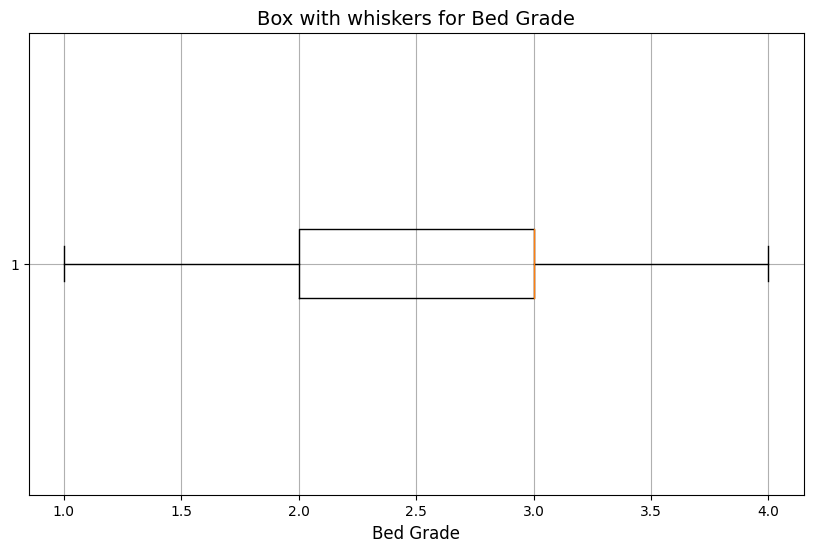

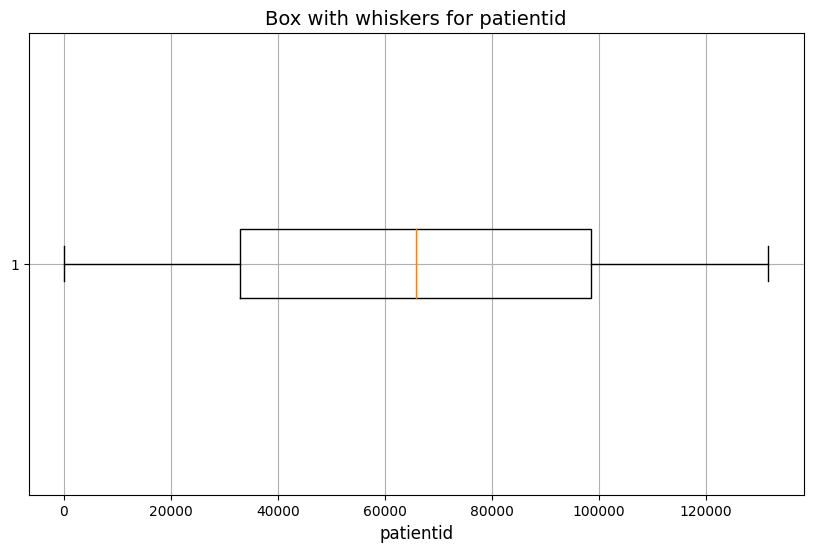

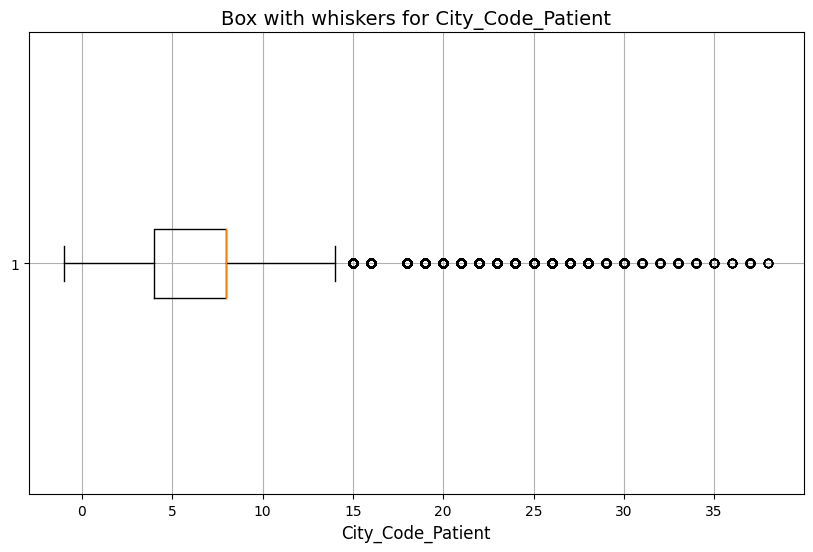

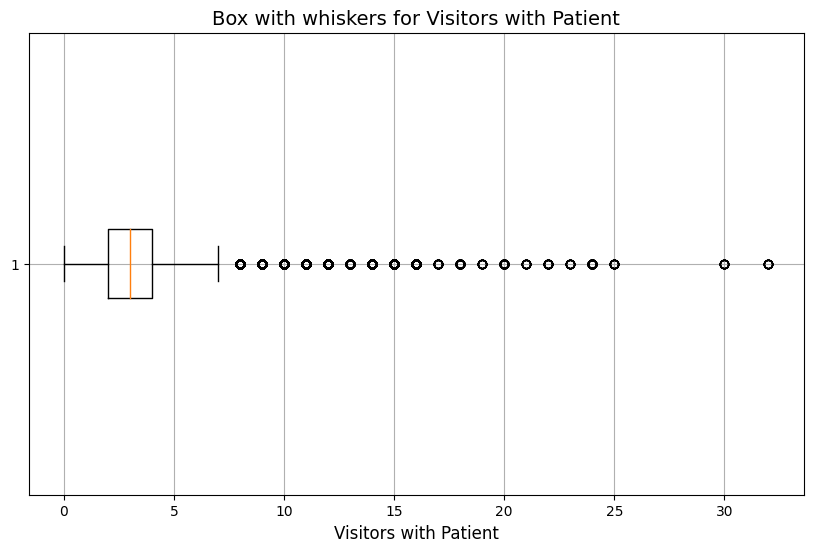

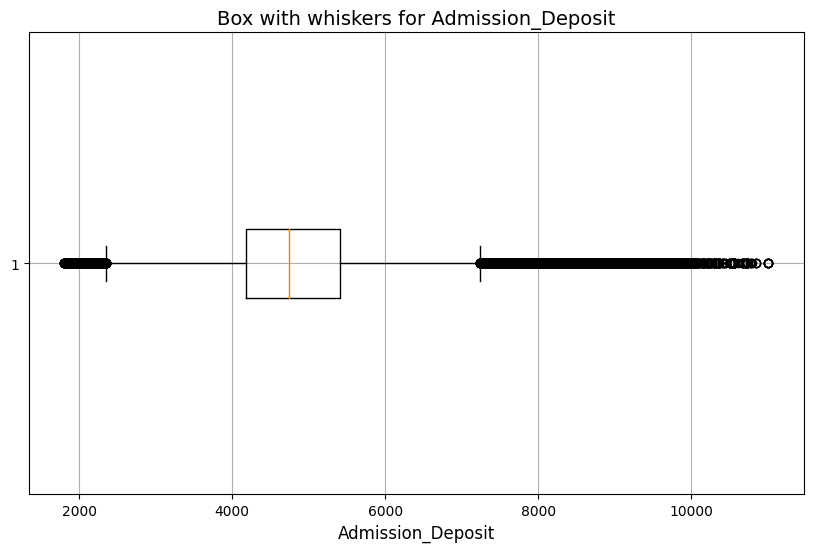


Description box with whisker for Hospital_code:
- 25% - 50% - 75% ranges: 11.00 - 19.00 - 26.00
- 100% range: 1.00 - 32.00
- The number of emissions: 0
- Offset: Symmetrical

Description box with whisker for City_Code_Hospital:
- 25% - 50% - 75% ranges: 2.00 - 5.00 - 7.00
- 100% range: 1.00 - 13.00
- The number of emissions: 0
- Offset: Symmetrical

Description box with whisker for Available Extra Rooms in Hospital:
- 25% - 50% - 75% ranges: 2.00 - 3.00 - 4.00
- 100% range: 0.00 - 24.00
- The number of emissions: 1351
- Offset: Symmetrical

Description box with whisker for Bed Grade:
- 25% - 50% - 75% ranges: 2.00 - 3.00 - 3.00
- 100% range: 1.00 - 4.00
- The number of emissions: 0
- Offset: Symmetrical

Description box with whisker for patientid:
- 25% - 50% - 75% ranges: 32847.00 - 65724.50 - 98470.00
- 100% range: 1.00 - 131624.00
- The number of emissions: 0
- Offset: Symmetrical

Description box with whisker for City_Code_Patient:
- 25% - 50% - 75% ranges: 4.00 - 8.00 - 8.00
- 10

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# Dictionary for describing boxes with whiskers
boxplot_descriptions = {}

# Building boxes with whiskers for numerical features
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    
    # Selection of non-empty values
    col_data = data[col].dropna()
    
    # Building a box with whiskers
    plt.boxplot(col_data, vert=False)
    plt.title(f'Box with whiskers for {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.grid(True)
    plt.show()
    
    # Box description
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    median = col_data.median()
    IQR = Q3 - Q1
    
    # Determining the boundaries of the whiskers
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR
    
    # Determination of emissions
    outliers = col_data[(col_data < lower_whisker) | (col_data > upper_whisker)]
    
    # Offset box
    box_skew = "Indeterminate"
    if median < Q1:
        box_skew = "To the left"
    elif median > Q3:
        box_skew = "To the right"
    else:
        box_skew = "Symmetrical"
    
    boxplot_descriptions[col] = {
        "25% - 50% - 75% ranges": f"{Q1:.2f} - {median:.2f} - {Q3:.2f}",
        "100% range": f"{col_data.min():.2f} - {col_data.max():.2f}",
        "The number of emissions": len(outliers),
        "Offset": box_skew
    }

# Output a description for each whisker box
for col, desc in boxplot_descriptions.items():
    print(f"\nDescription box with whisker for {col}:")
    for key, value in desc.items():
        print(f"- {key}: {value}")


<Axes: >

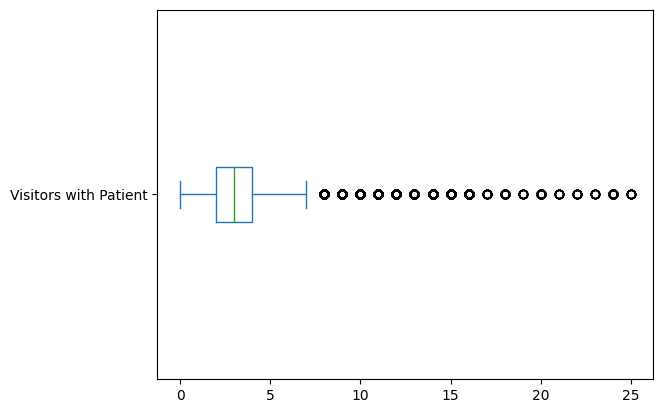

In [34]:
# Remove emissions
data = data[data['Visitors with Patient'] < 26]
data['Visitors with Patient'].plot(kind='box', vert=False)

<Axes: >

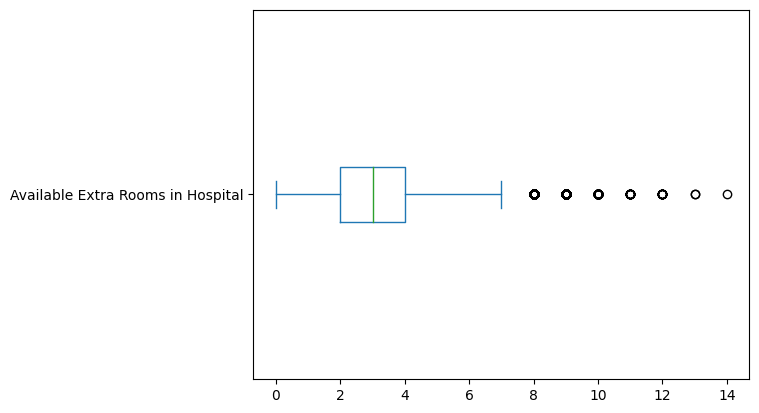

In [35]:
data = data[data['Available Extra Rooms in Hospital'] < 15]
data['Available Extra Rooms in Hospital'].plot(kind='box', vert=False)

<Axes: >

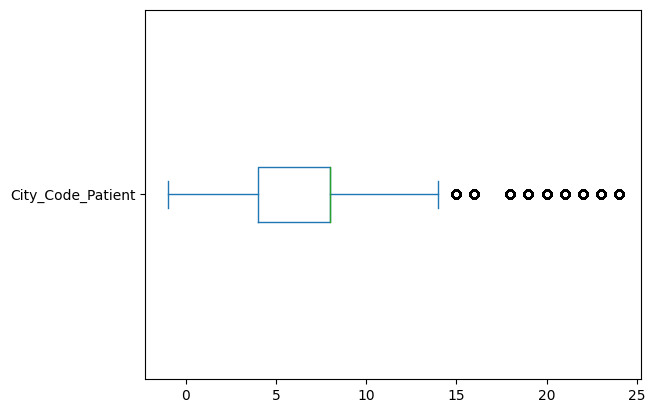

In [36]:
data = data[data['City_Code_Patient'] < 25]
data['City_Code_Patient'].plot(kind='box', vert=False)

<Axes: >

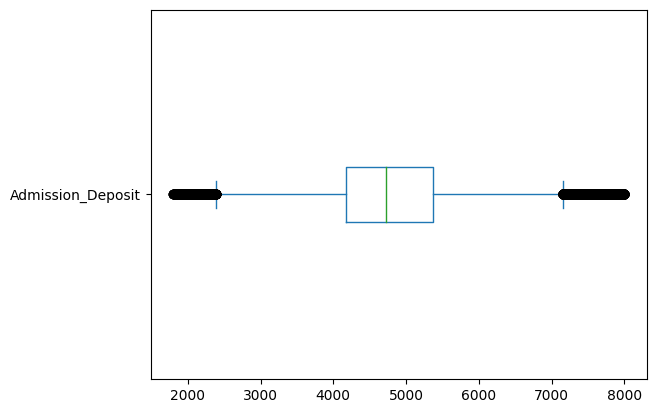

In [37]:
data = data[data['Admission_Deposit'] < 8000]
data['Admission_Deposit'].plot(kind='box', vert=False)

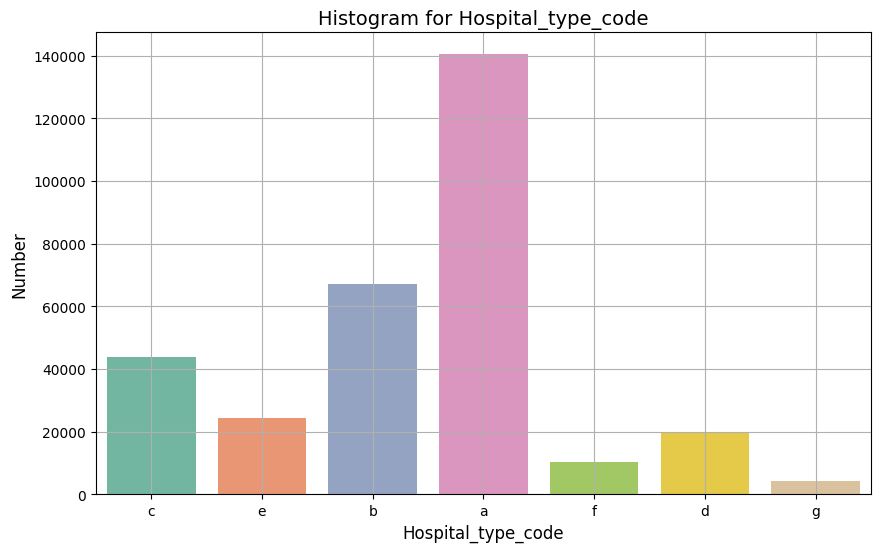

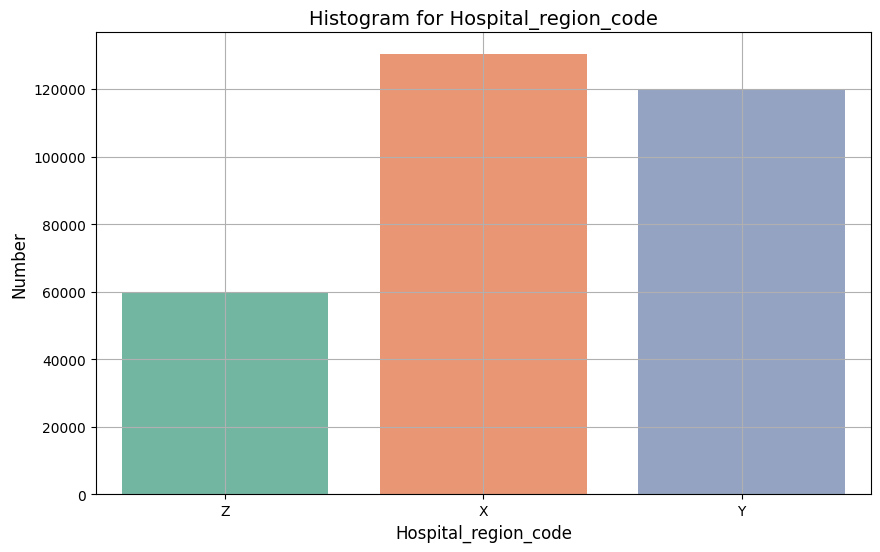

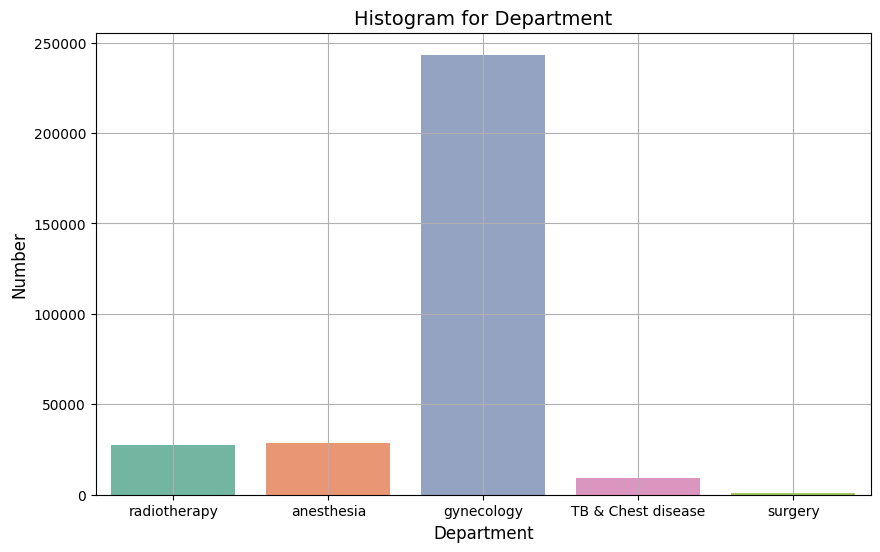

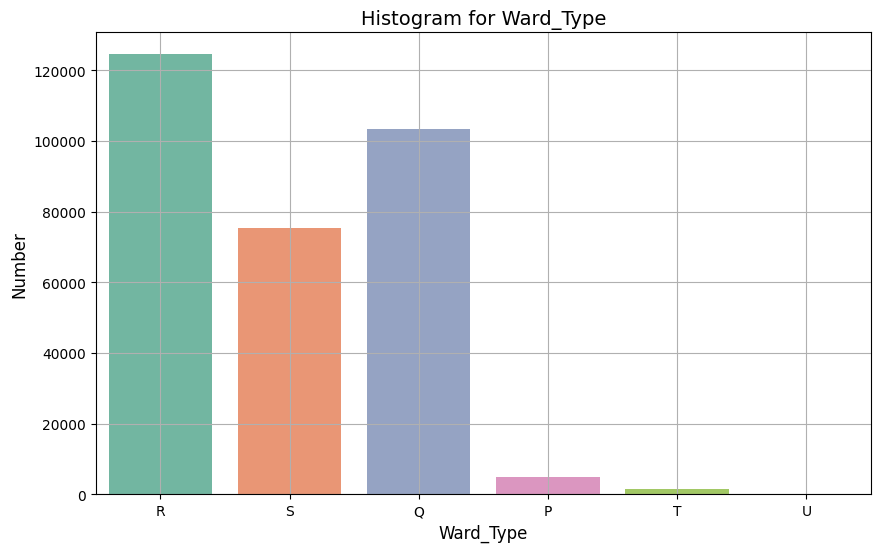

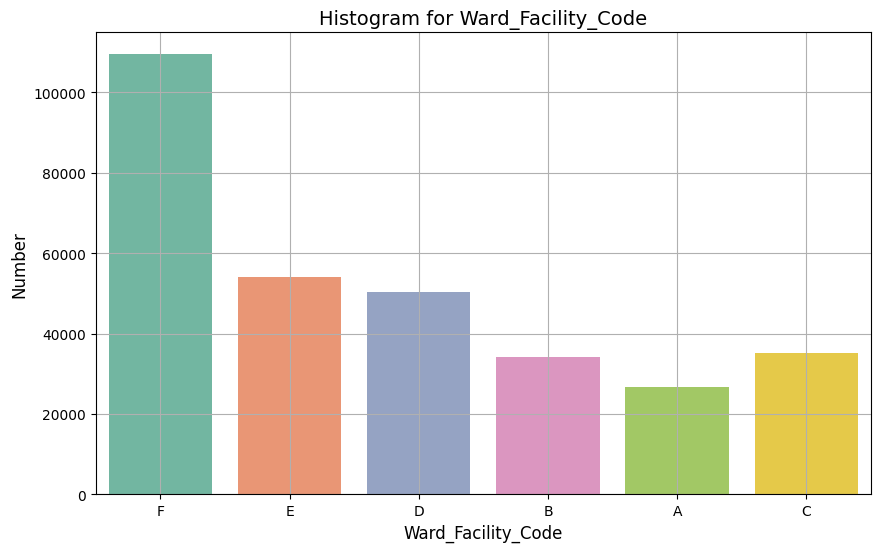

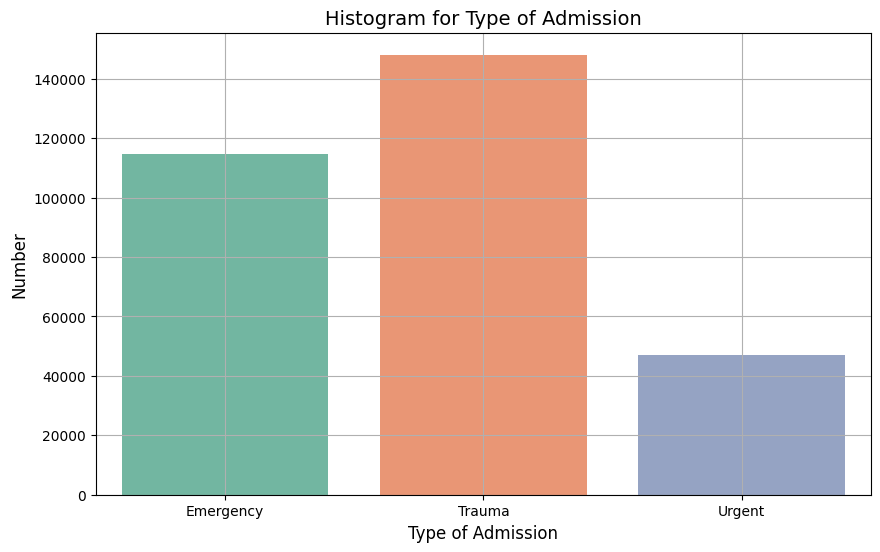

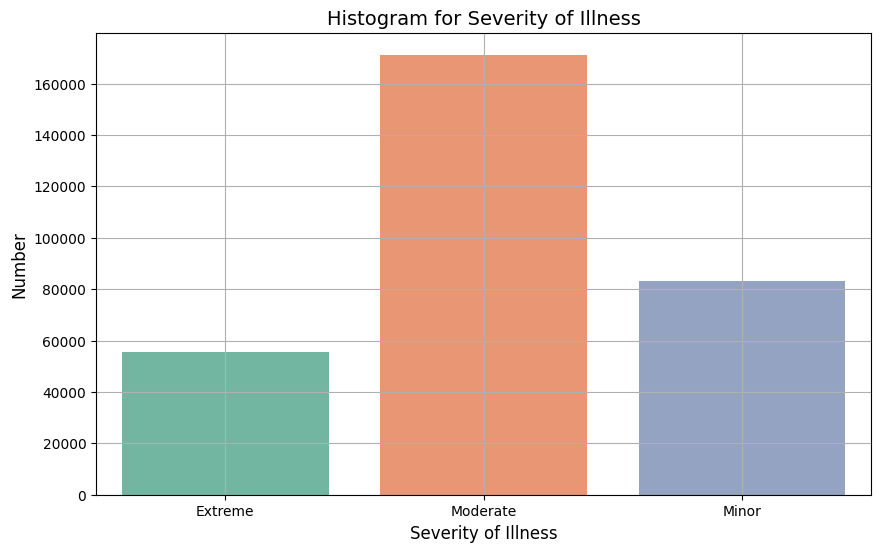

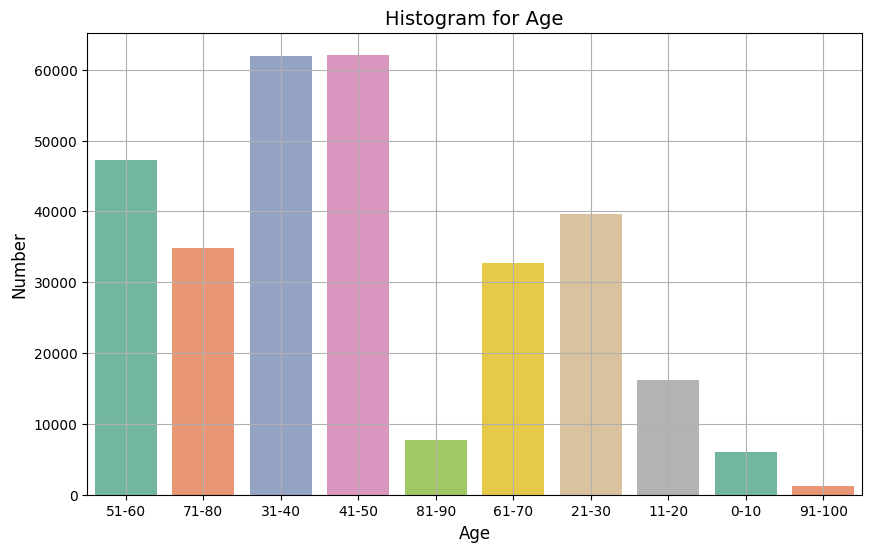

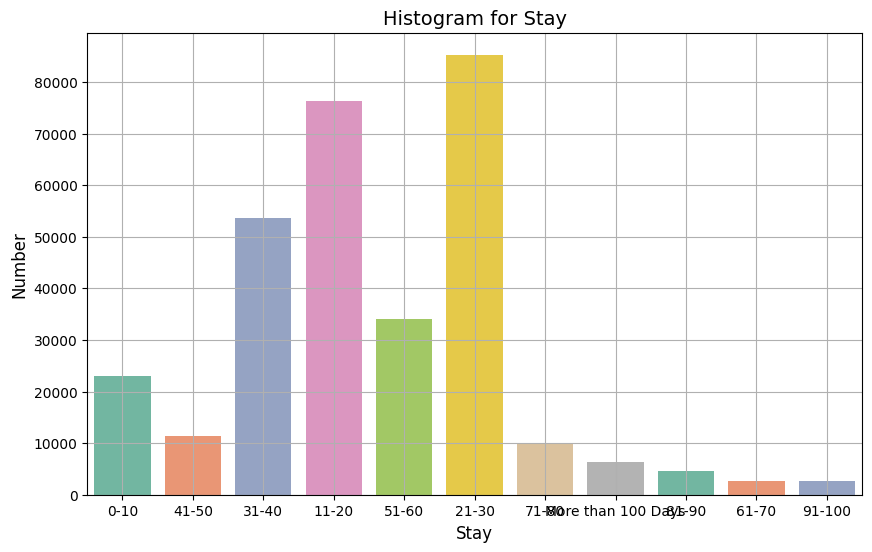

In [38]:
# Derivation of histograms for categorical features
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=data[col], palette="Set2")
    plt.title(f'Histogram for {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Number', fontsize=12)
    plt.grid(True)
    plt.show()

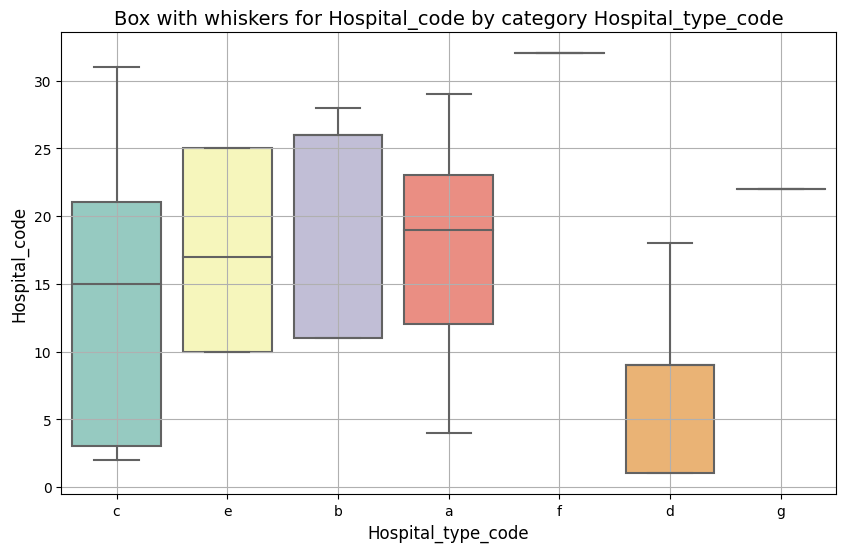

There is a dependency between Hospital_code and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


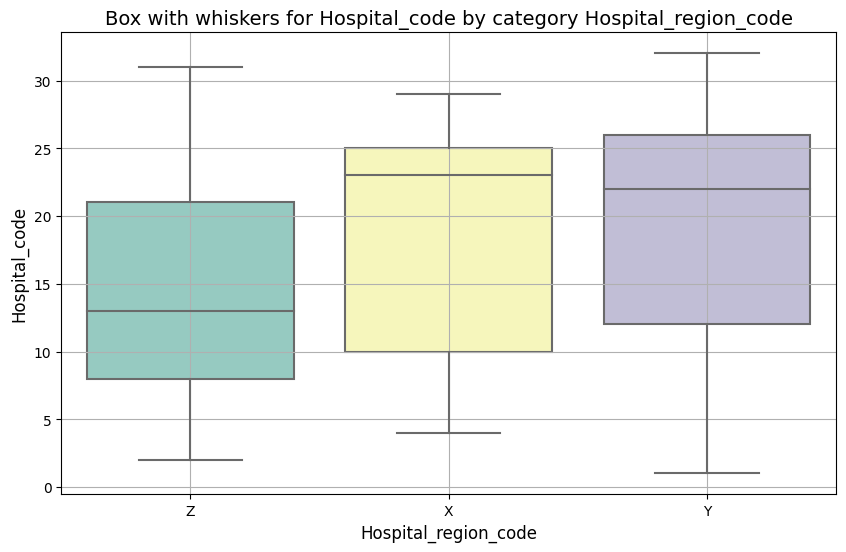

There is a dependency between Hospital_code and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


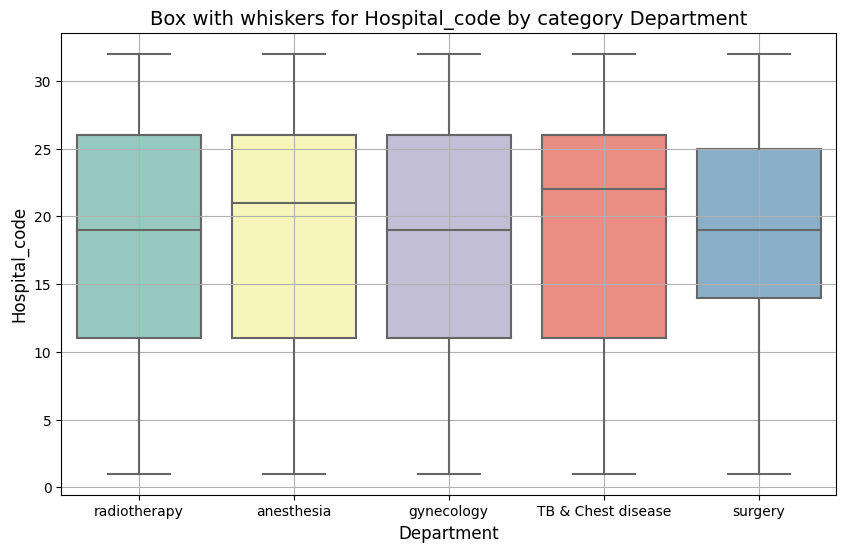

There is a dependency between Hospital_code and Department: the numeric character varies depending on the category Department


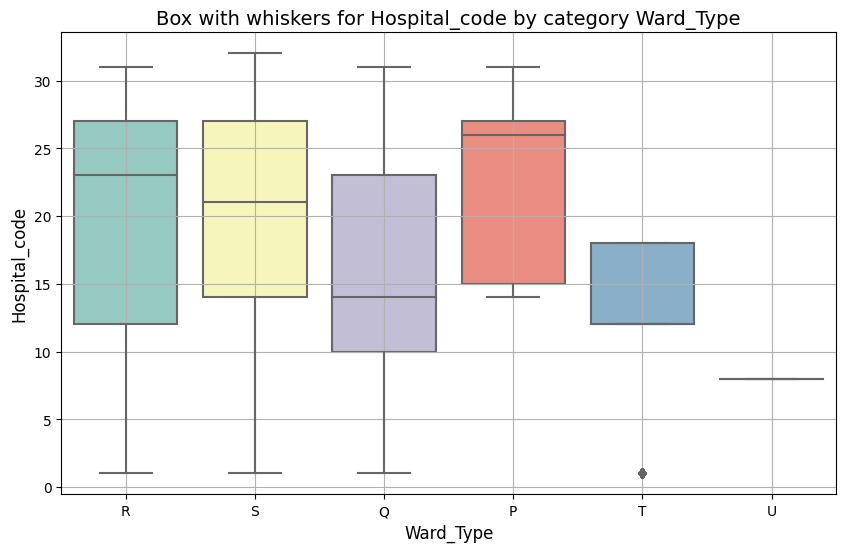

There is a dependency between Hospital_code and Ward_Type: the numeric character varies depending on the category Ward_Type


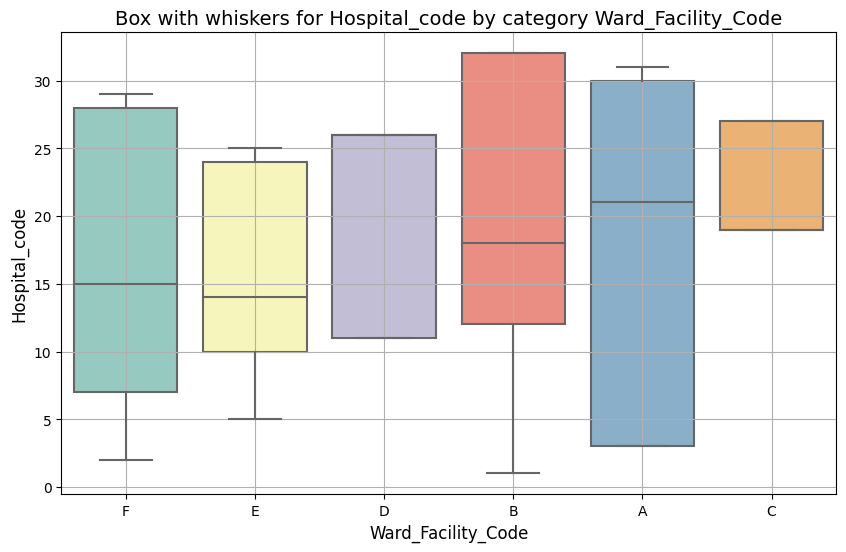

There is a dependency between Hospital_code and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


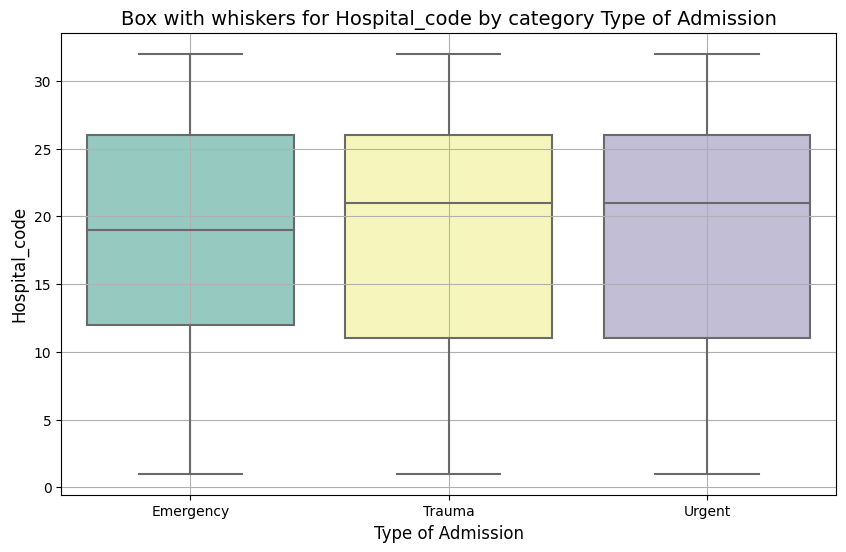

There is a dependency between Hospital_code and Type of Admission: the numeric character varies depending on the category Type of Admission


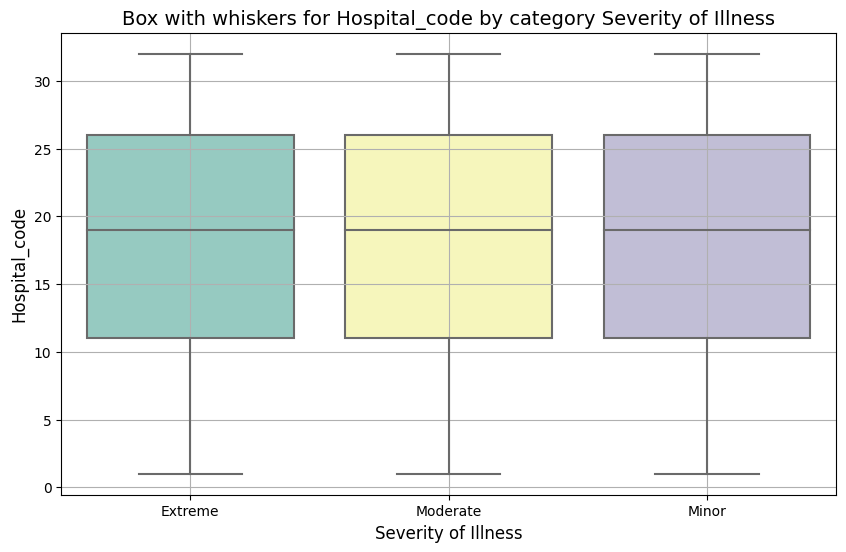

There is a dependency between Hospital_code and Severity of Illness: the numeric character varies depending on the category Severity of Illness


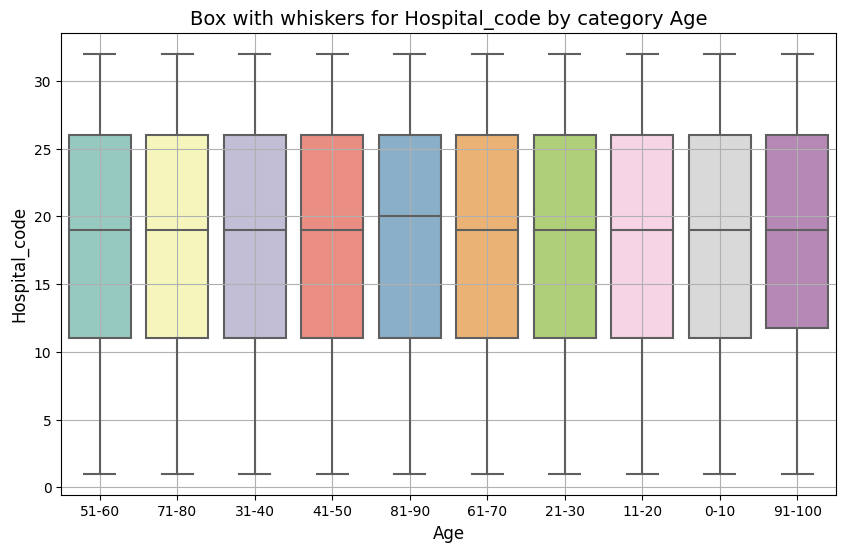

There is a dependency between Hospital_code and Age: the numeric character varies depending on the category Age


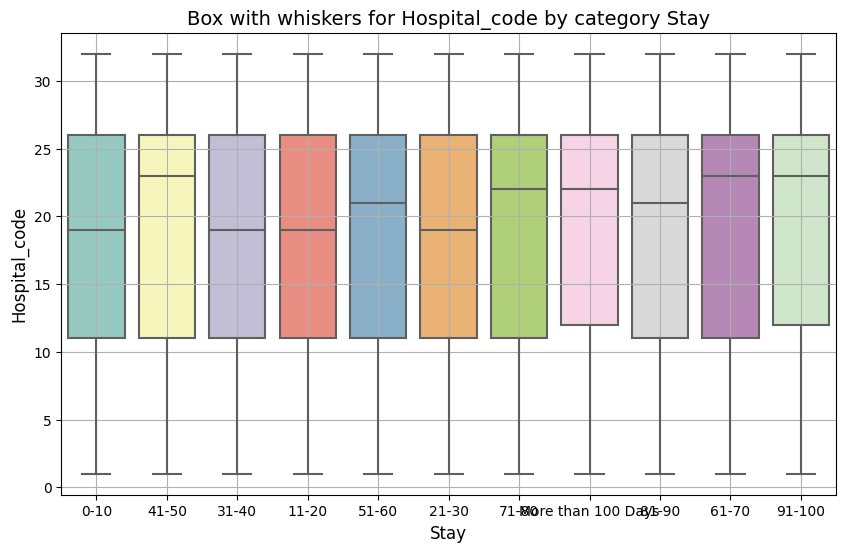

There is a dependency between Hospital_code and Stay: the numeric character varies depending on the category Stay


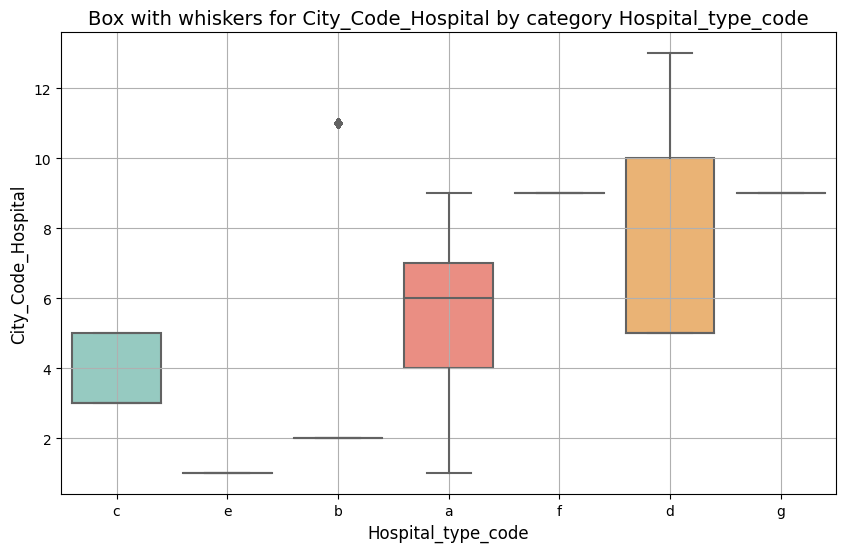

There is a dependency between City_Code_Hospital and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


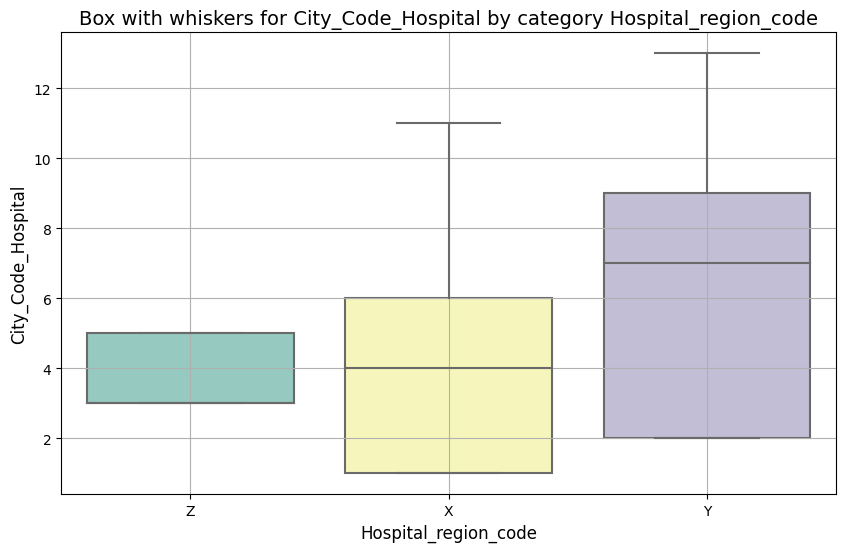

There is a dependency between City_Code_Hospital and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


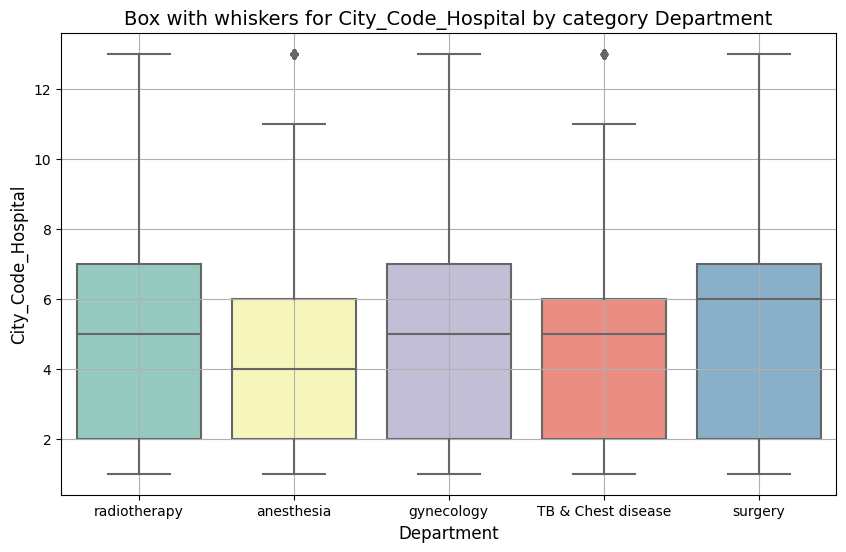

There is a dependency between City_Code_Hospital and Department: the numeric character varies depending on the category Department


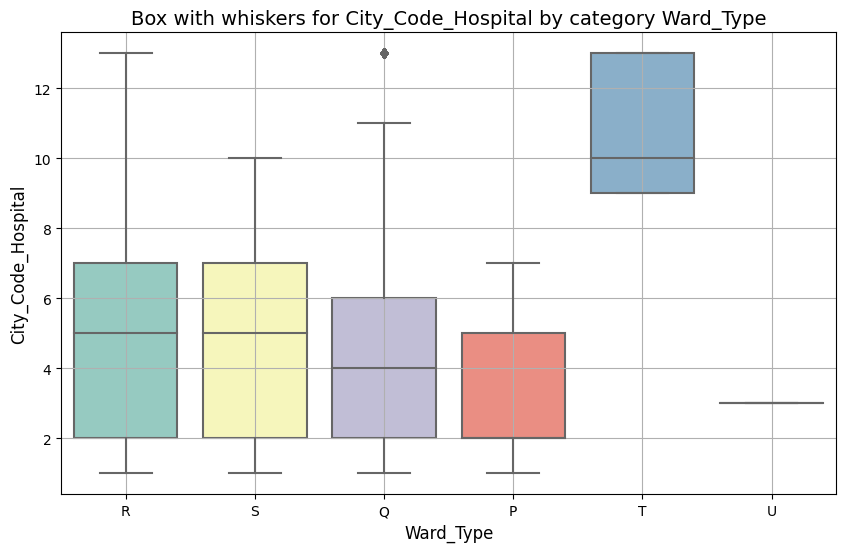

There is a dependency between City_Code_Hospital and Ward_Type: the numeric character varies depending on the category Ward_Type


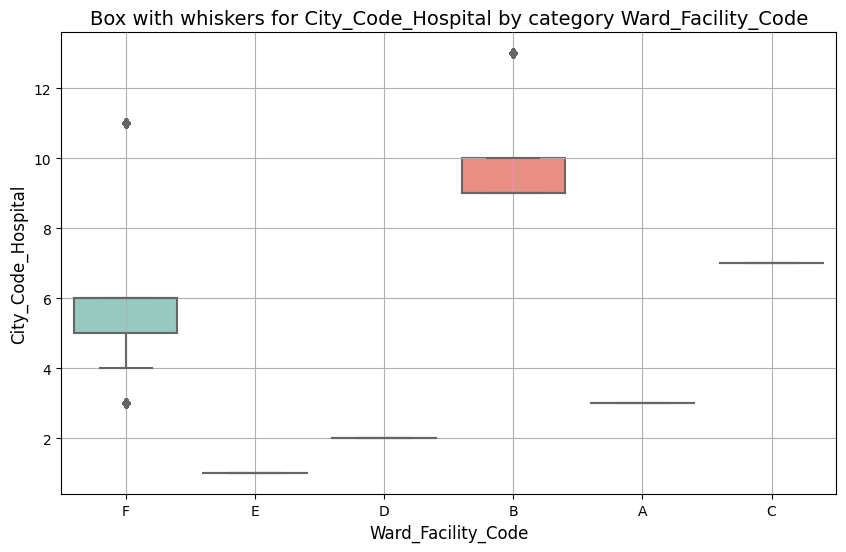

There is a dependency between City_Code_Hospital and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


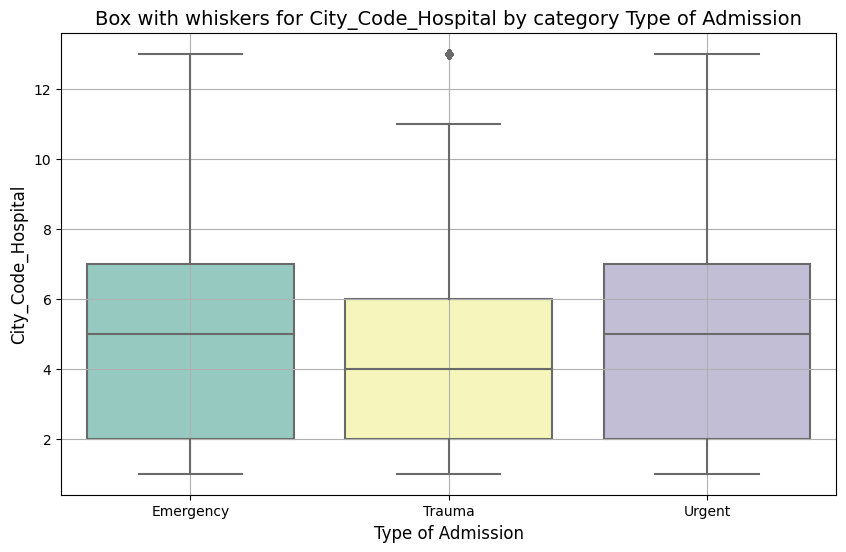

There is a dependency between City_Code_Hospital and Type of Admission: the numeric character varies depending on the category Type of Admission


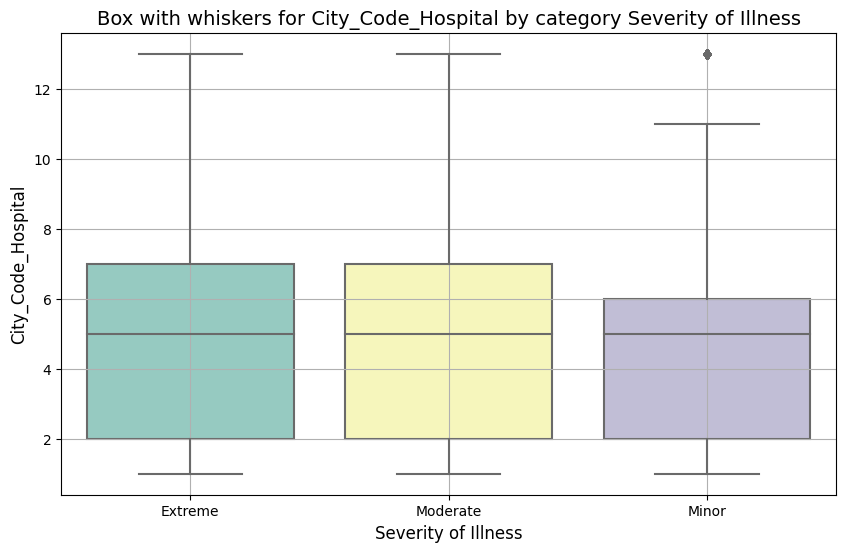

There is a dependency between City_Code_Hospital and Severity of Illness: the numeric character varies depending on the category Severity of Illness


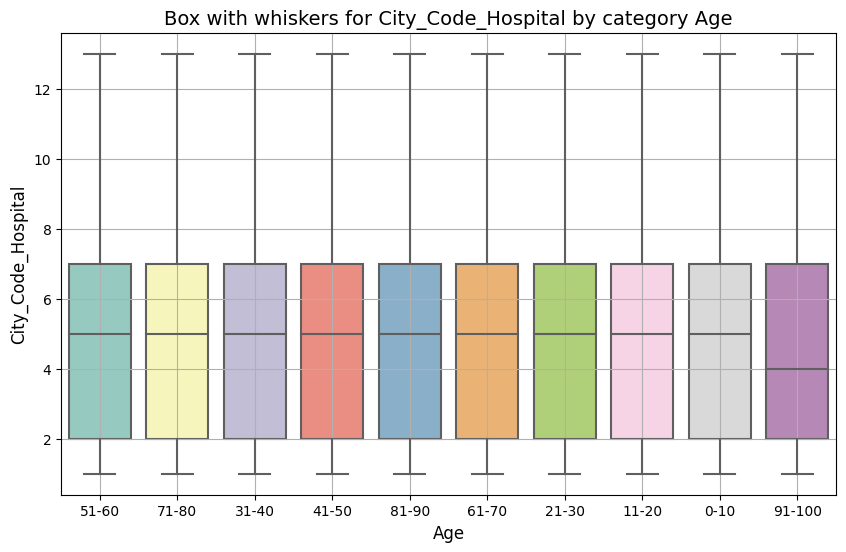

There is a dependency between City_Code_Hospital and Age: the numeric character varies depending on the category Age


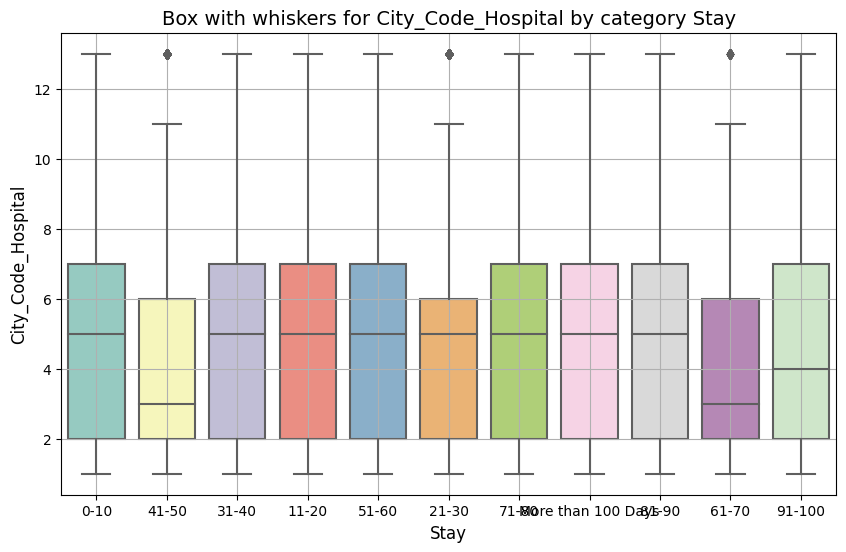

There is a dependency between City_Code_Hospital and Stay: the numeric character varies depending on the category Stay


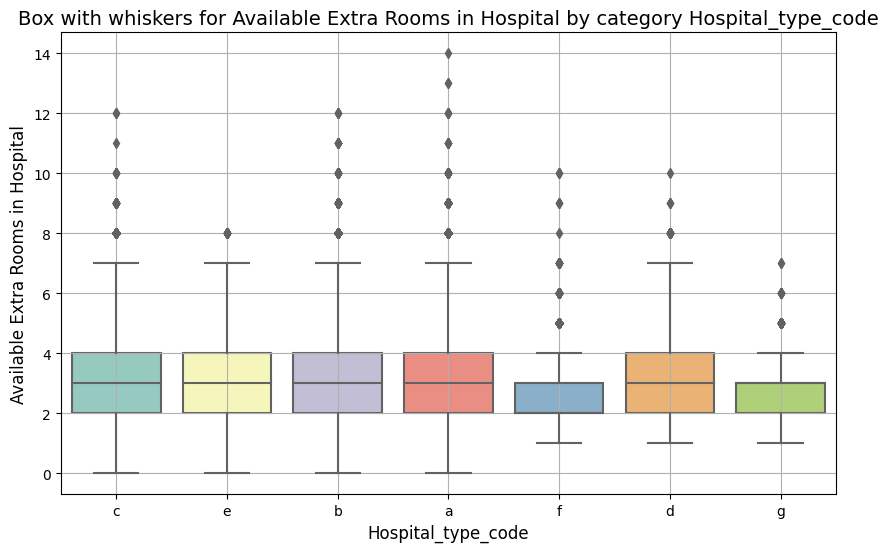

There is a dependency between Available Extra Rooms in Hospital and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


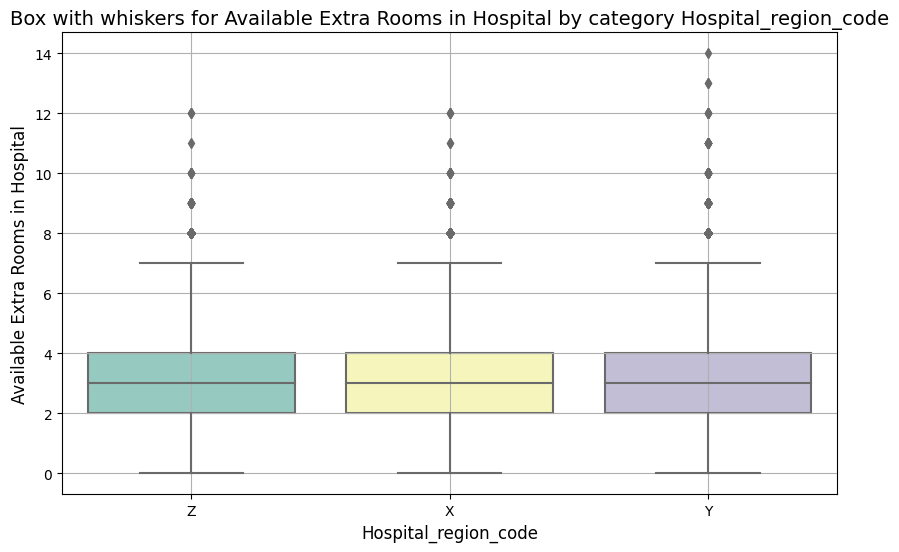

There is a dependency between Available Extra Rooms in Hospital and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


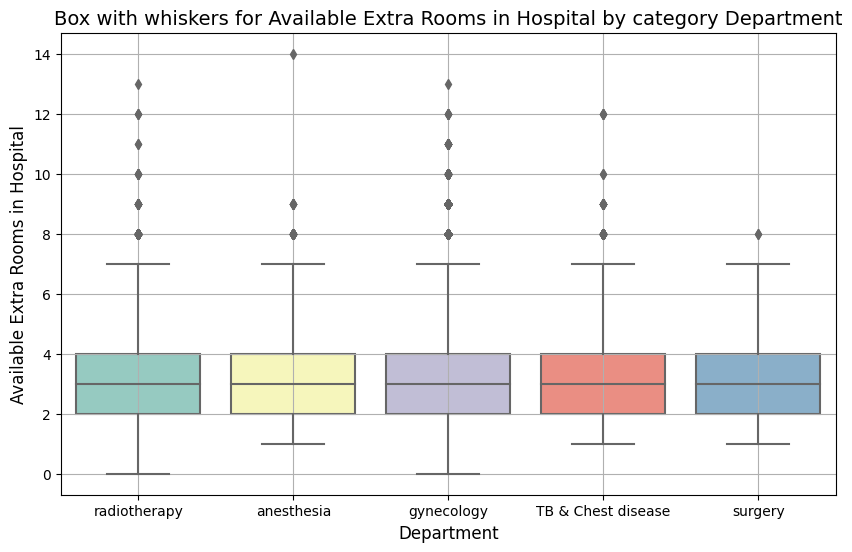

There is a dependency between Available Extra Rooms in Hospital and Department: the numeric character varies depending on the category Department


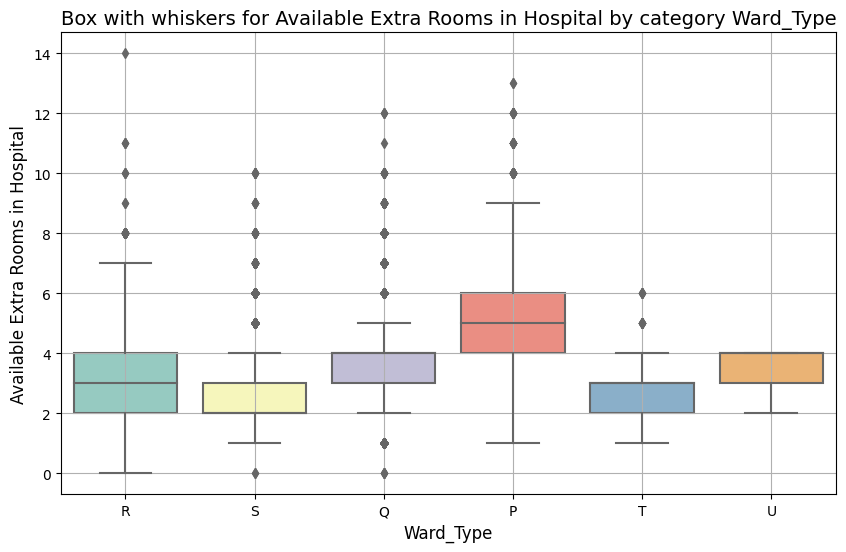

There is a dependency between Available Extra Rooms in Hospital and Ward_Type: the numeric character varies depending on the category Ward_Type


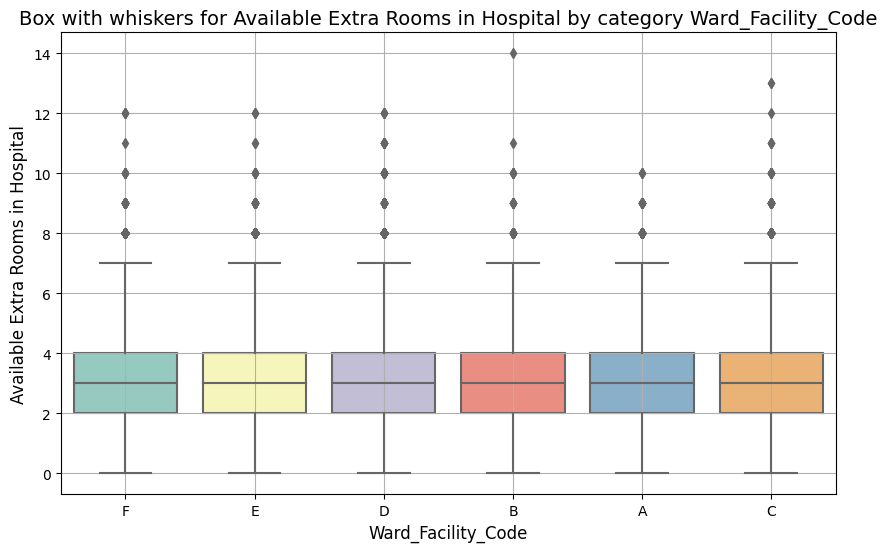

There is a dependency between Available Extra Rooms in Hospital and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


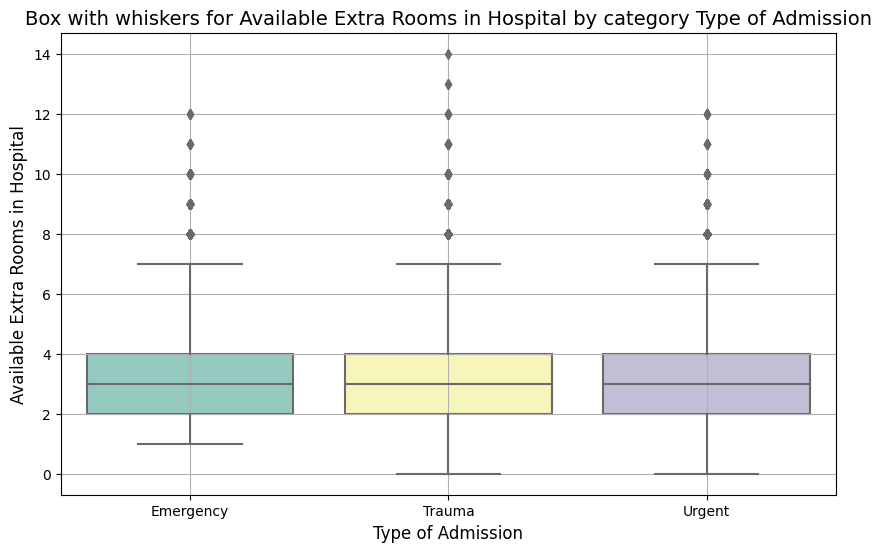

There is a dependency between Available Extra Rooms in Hospital and Type of Admission: the numeric character varies depending on the category Type of Admission


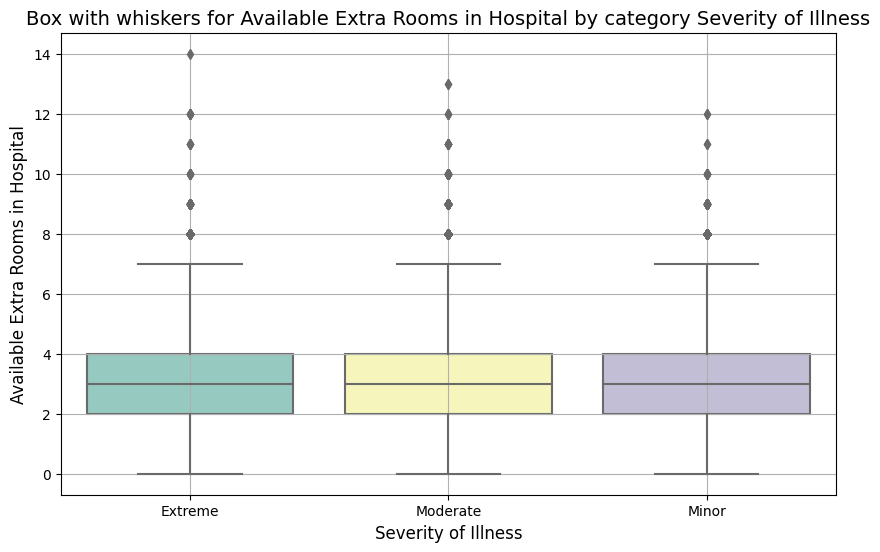

There is a dependency between Available Extra Rooms in Hospital and Severity of Illness: the numeric character varies depending on the category Severity of Illness


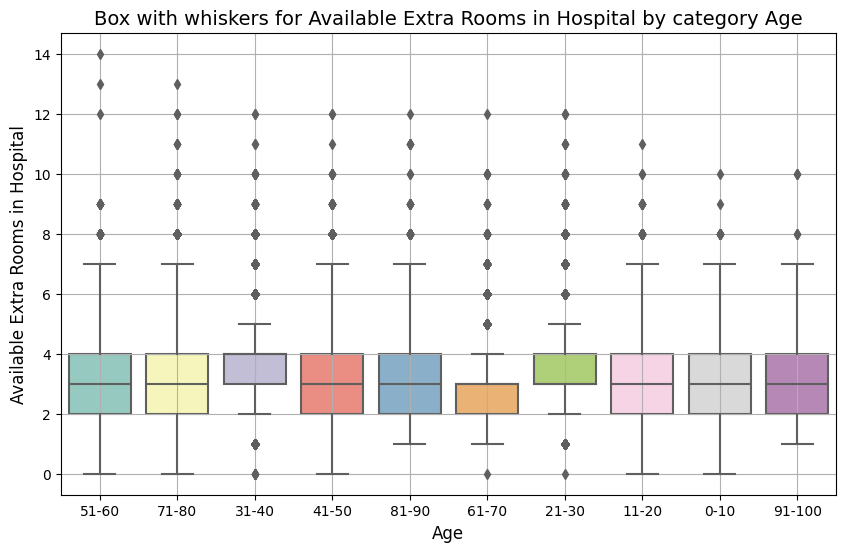

There is a dependency between Available Extra Rooms in Hospital and Age: the numeric character varies depending on the category Age


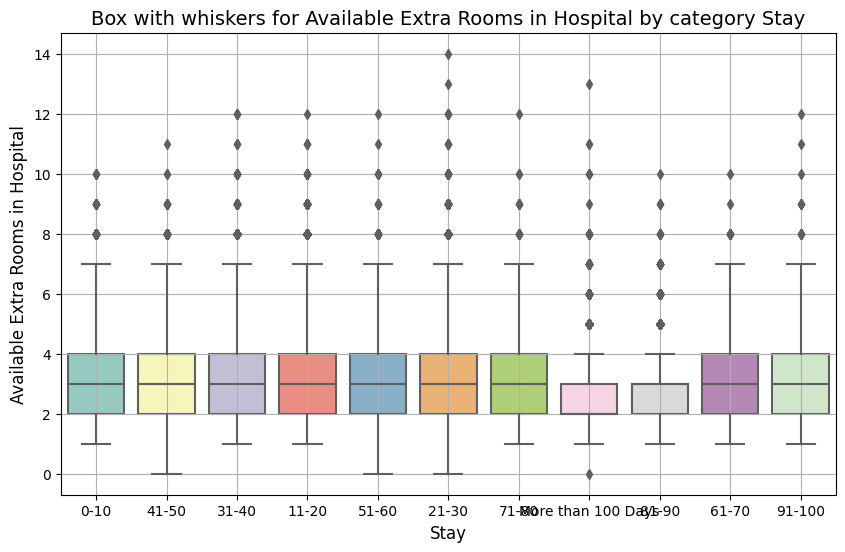

There is a dependency between Available Extra Rooms in Hospital and Stay: the numeric character varies depending on the category Stay


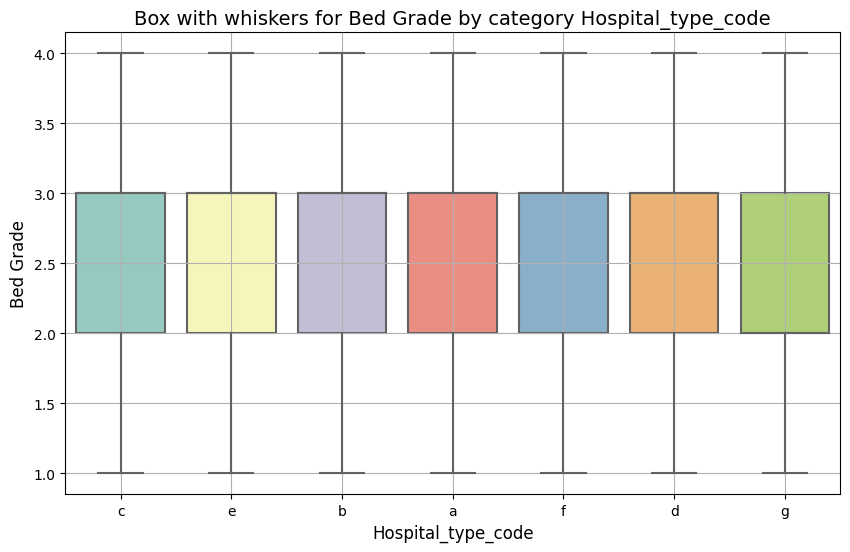

There is a dependency between Bed Grade and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


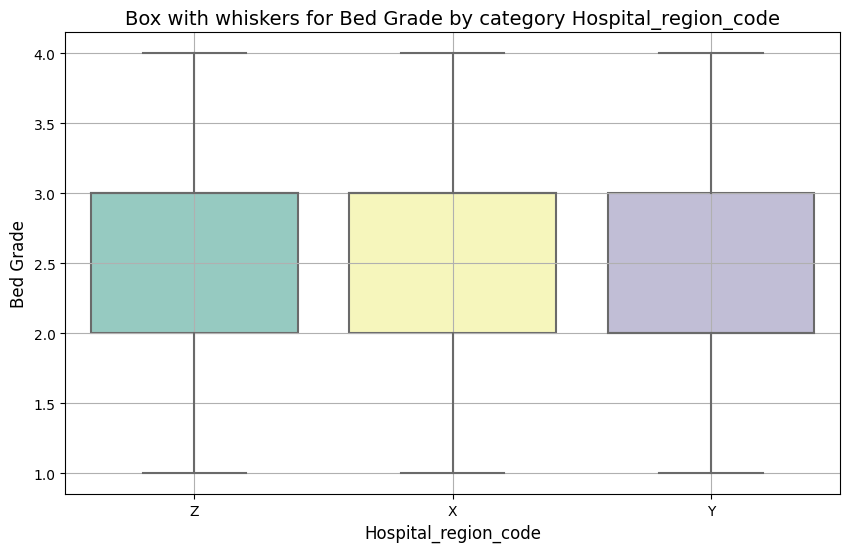

There is a dependency between Bed Grade and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


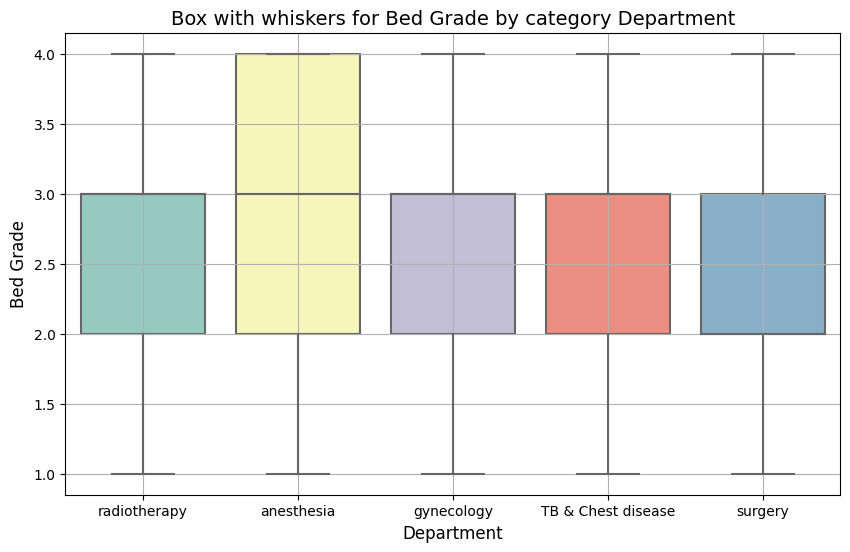

There is a dependency between Bed Grade and Department: the numeric character varies depending on the category Department


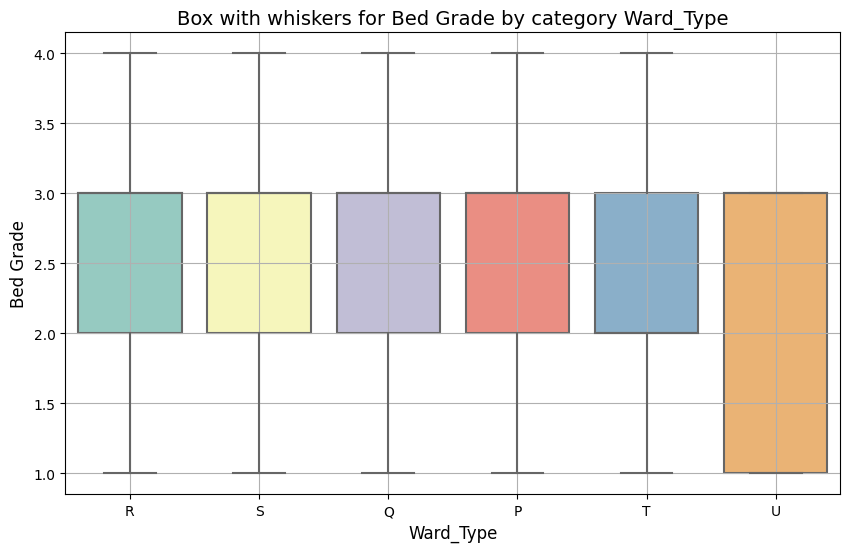

There is a dependency between Bed Grade and Ward_Type: the numeric character varies depending on the category Ward_Type


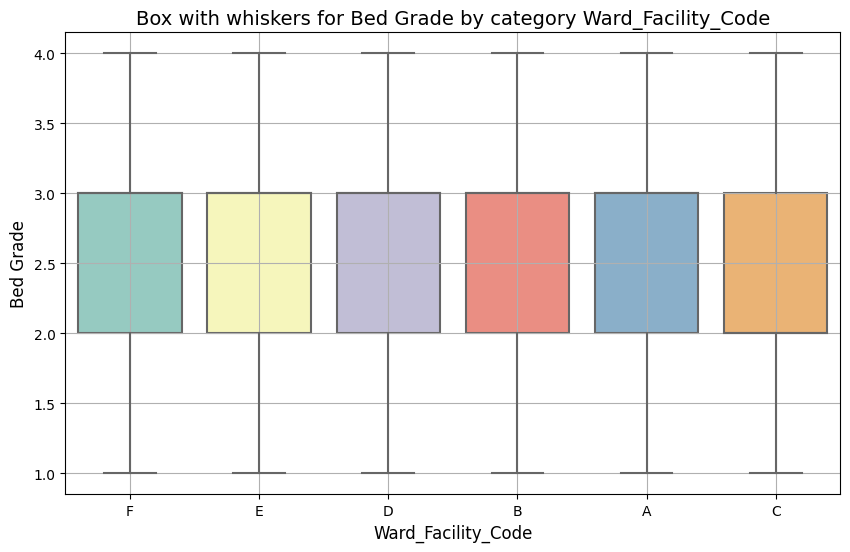

There is a dependency between Bed Grade and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


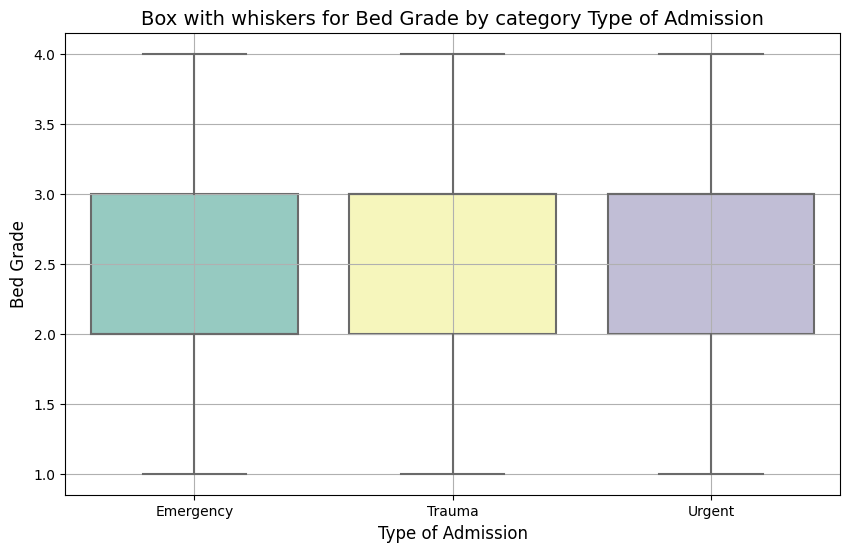

There is a dependency between Bed Grade and Type of Admission: the numeric character varies depending on the category Type of Admission


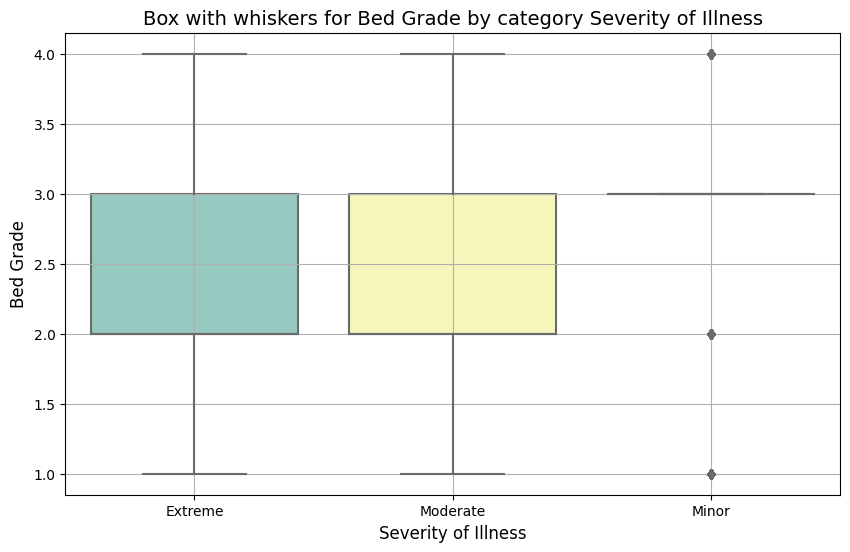

There is a dependency between Bed Grade and Severity of Illness: the numeric character varies depending on the category Severity of Illness


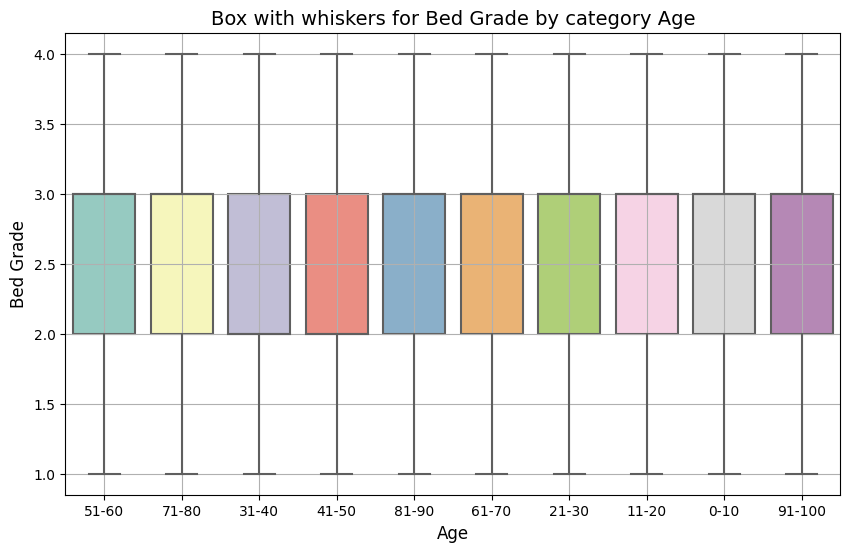

There is a dependency between Bed Grade and Age: the numeric character varies depending on the category Age


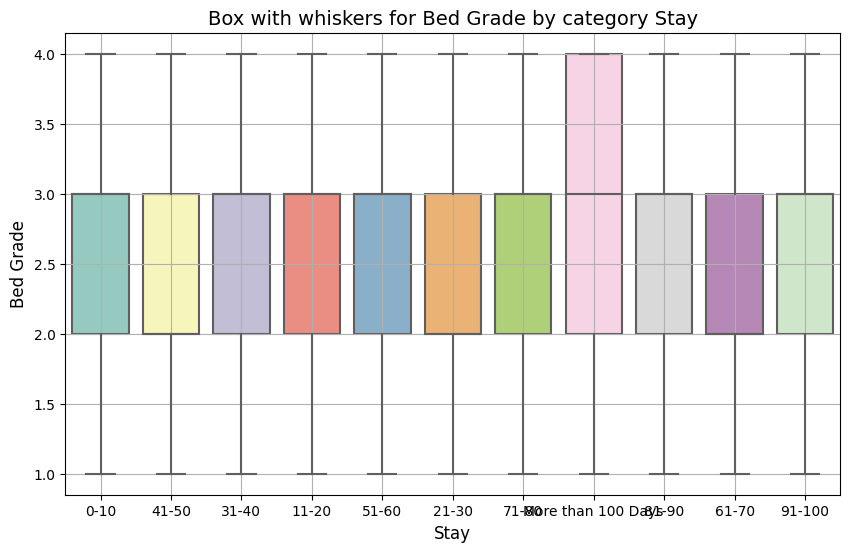

There is a dependency between Bed Grade and Stay: the numeric character varies depending on the category Stay


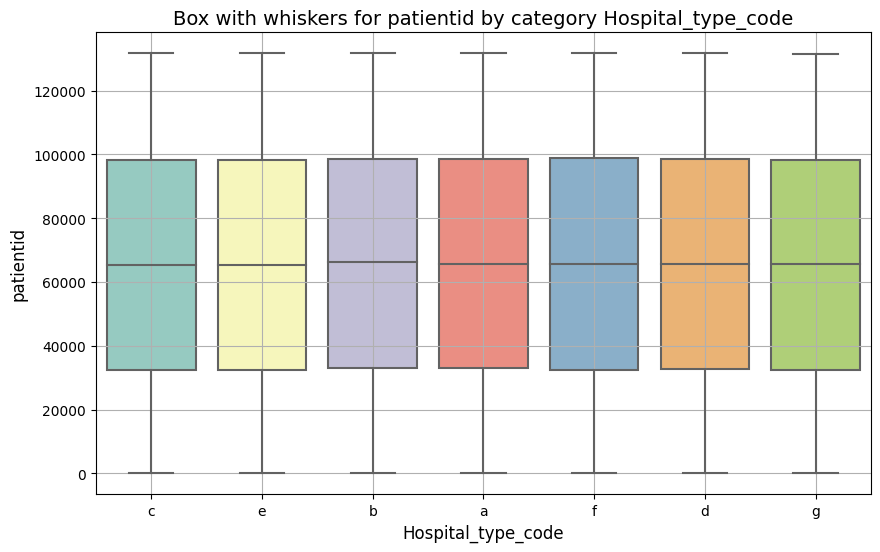

There is a dependency between patientid and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


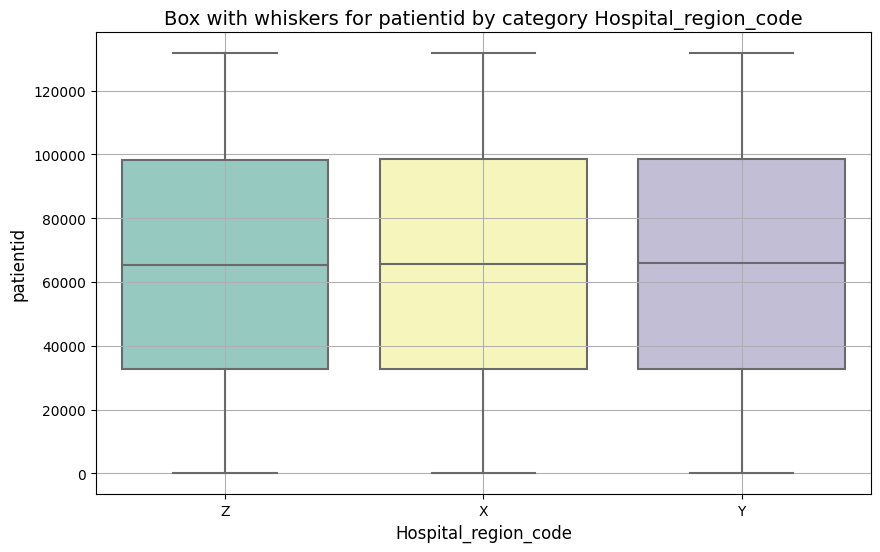

There is a dependency between patientid and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


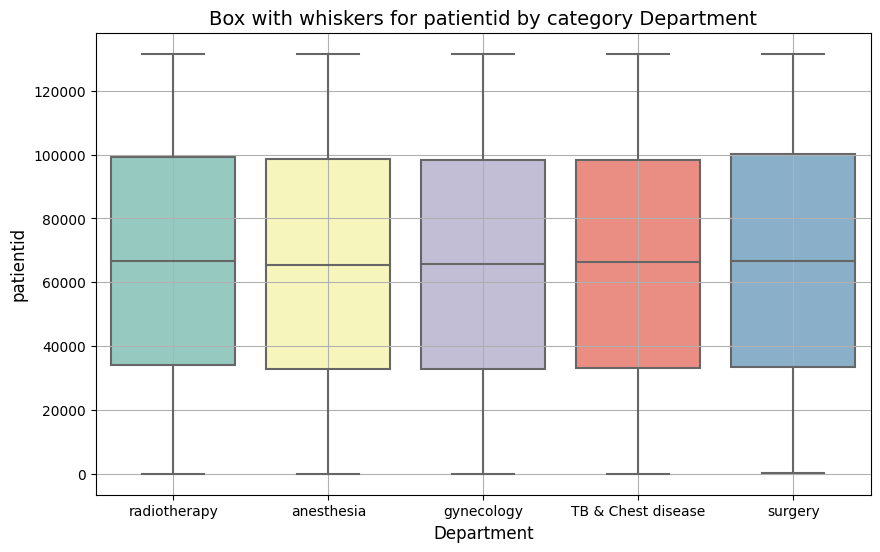

There is a dependency between patientid and Department: the numeric character varies depending on the category Department


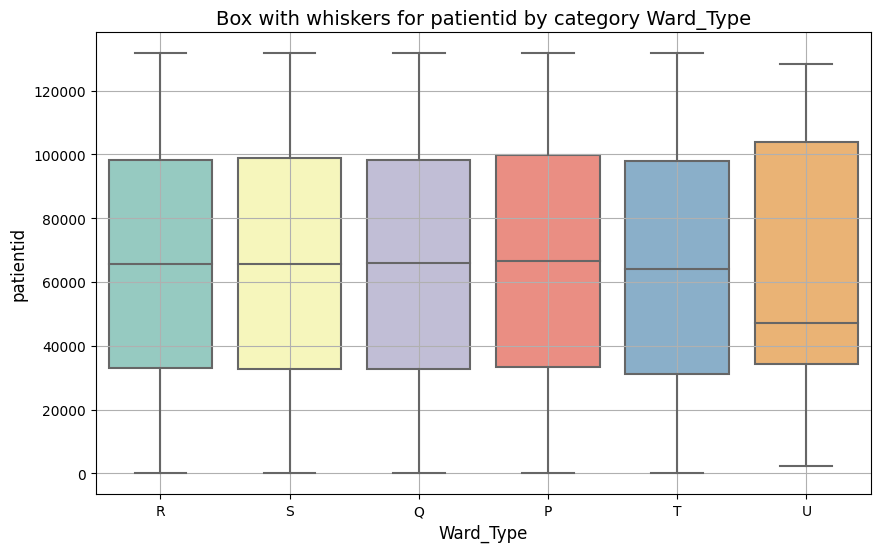

There is a dependency between patientid and Ward_Type: the numeric character varies depending on the category Ward_Type


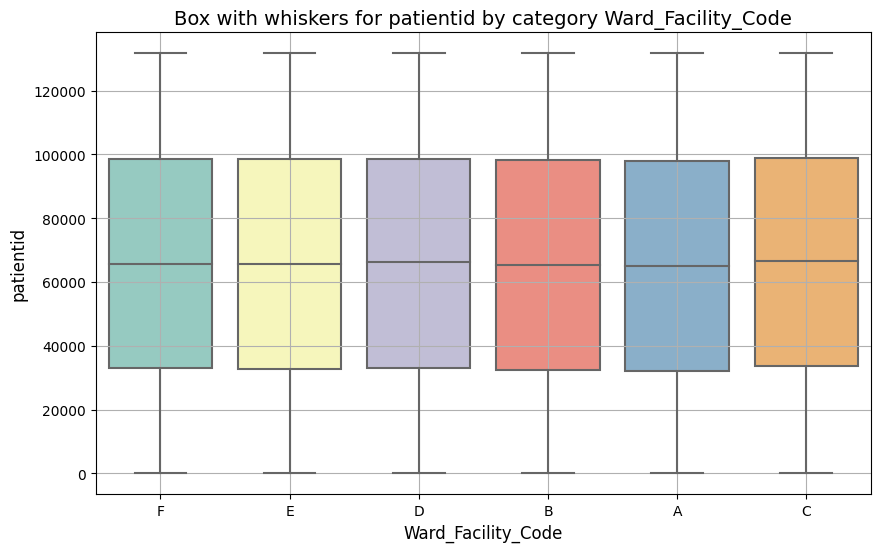

There is a dependency between patientid and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


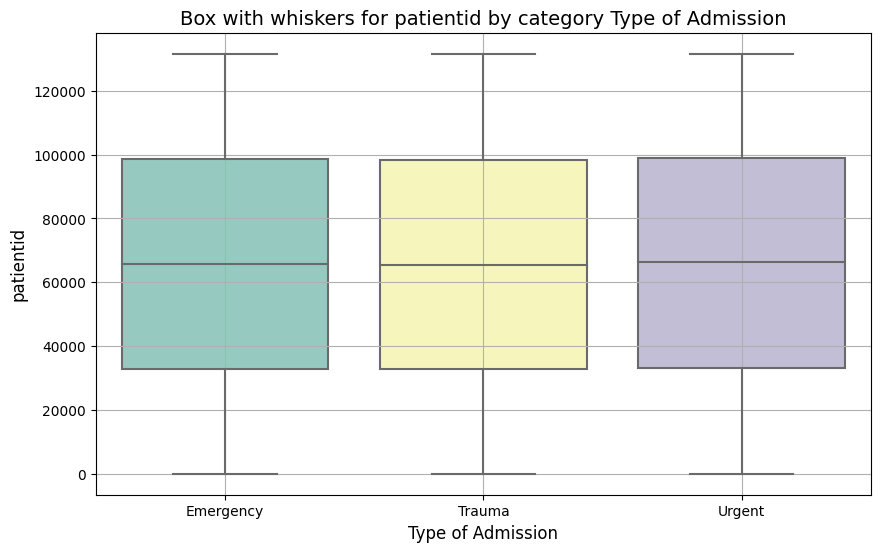

There is a dependency between patientid and Type of Admission: the numeric character varies depending on the category Type of Admission


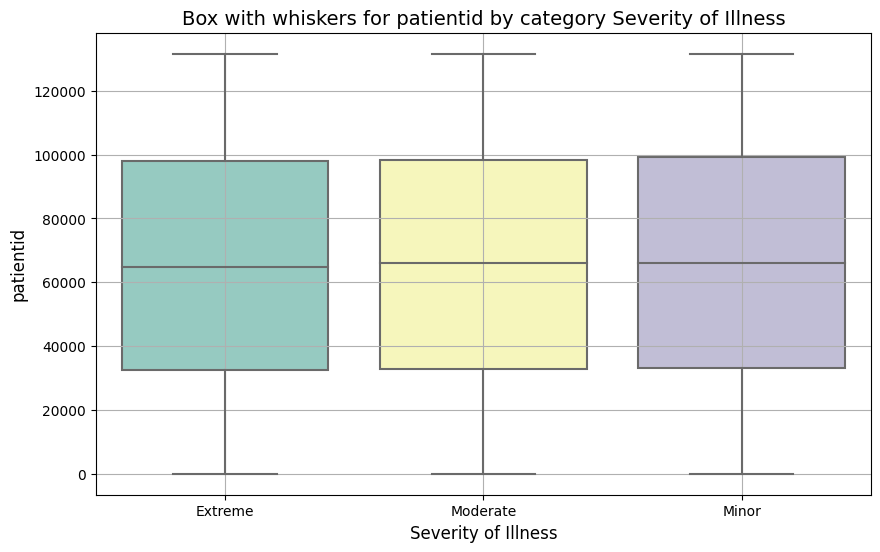

There is a dependency between patientid and Severity of Illness: the numeric character varies depending on the category Severity of Illness


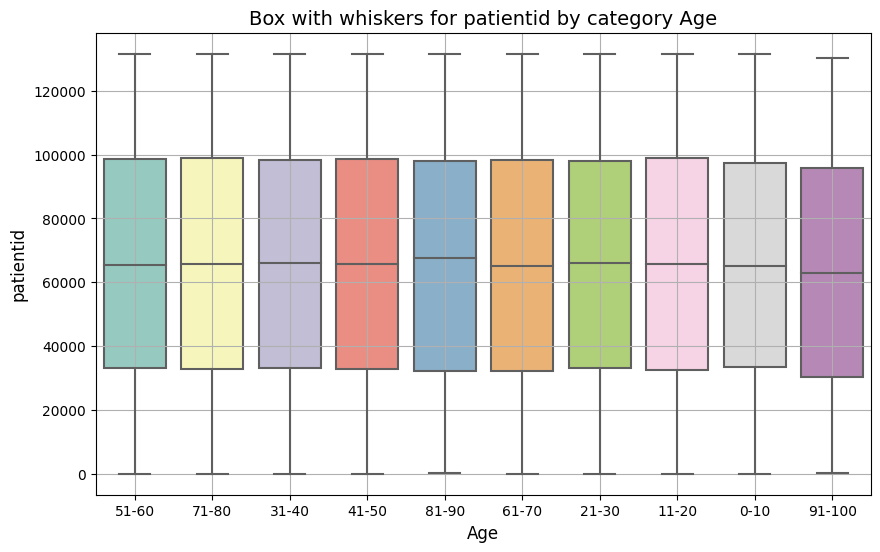

There is a dependency between patientid and Age: the numeric character varies depending on the category Age


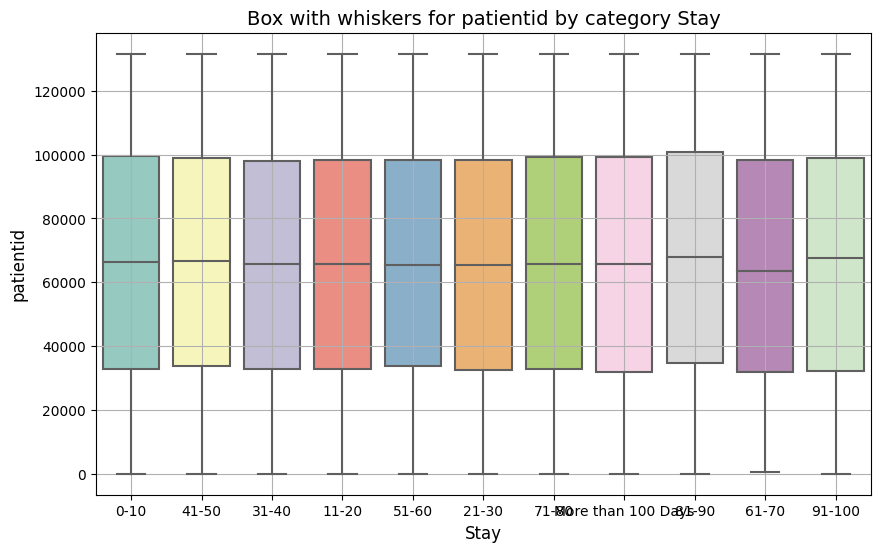

There is a dependency between patientid and Stay: the numeric character varies depending on the category Stay


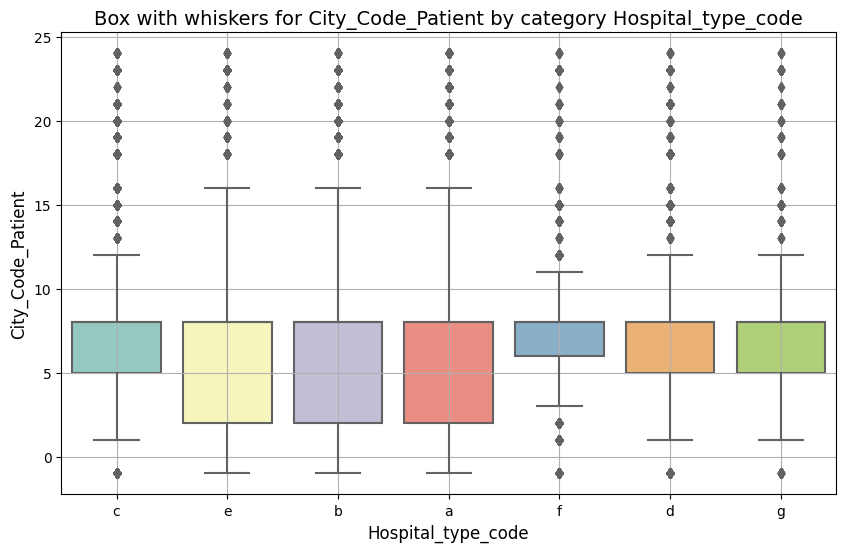

There is a dependency between City_Code_Patient and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


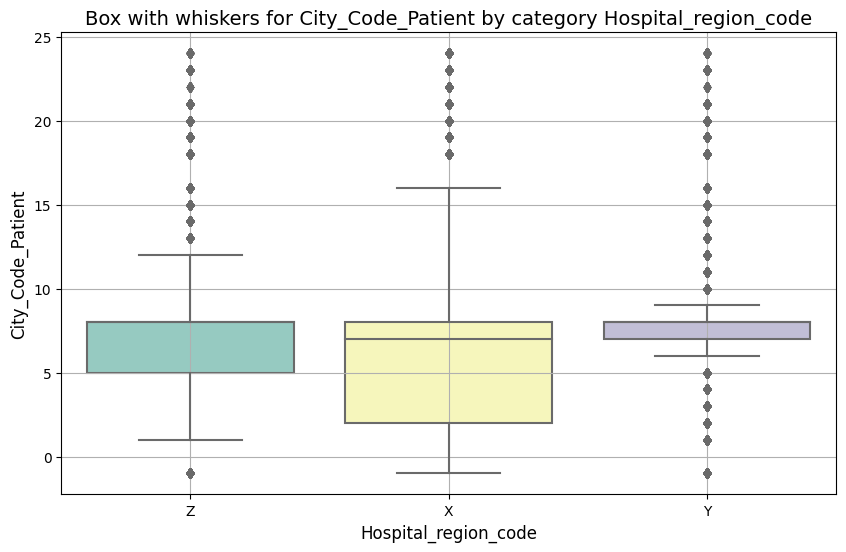

There is a dependency between City_Code_Patient and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


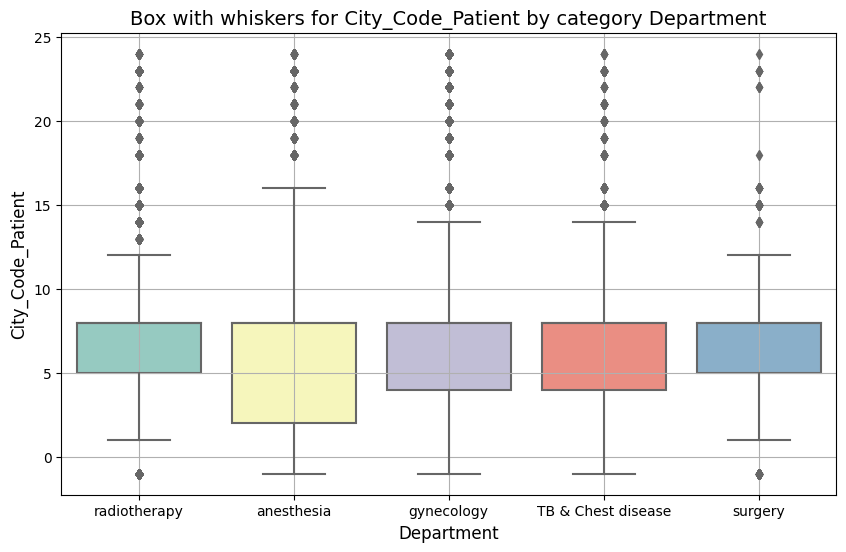

There is a dependency between City_Code_Patient and Department: the numeric character varies depending on the category Department


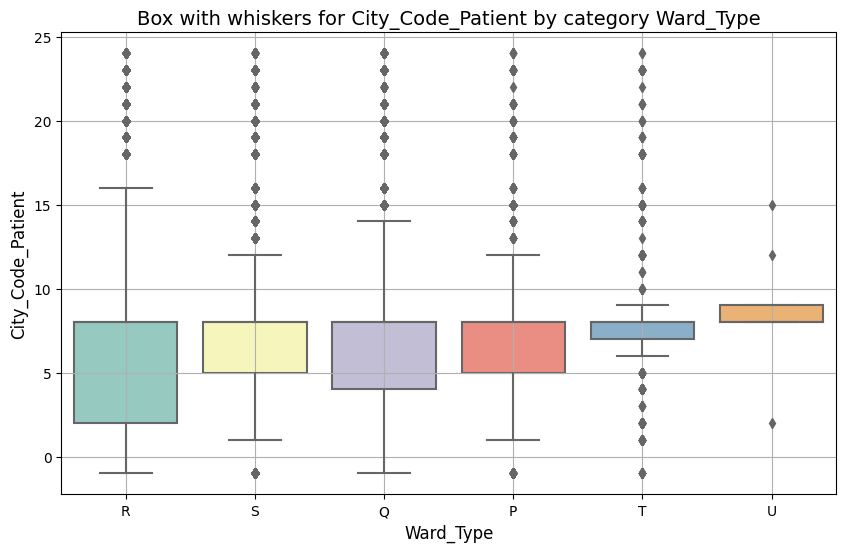

There is a dependency between City_Code_Patient and Ward_Type: the numeric character varies depending on the category Ward_Type


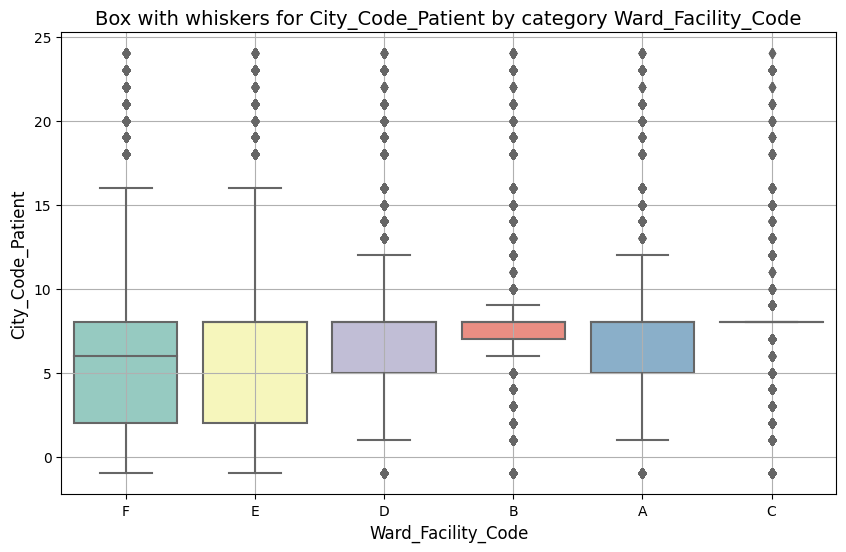

There is a dependency between City_Code_Patient and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


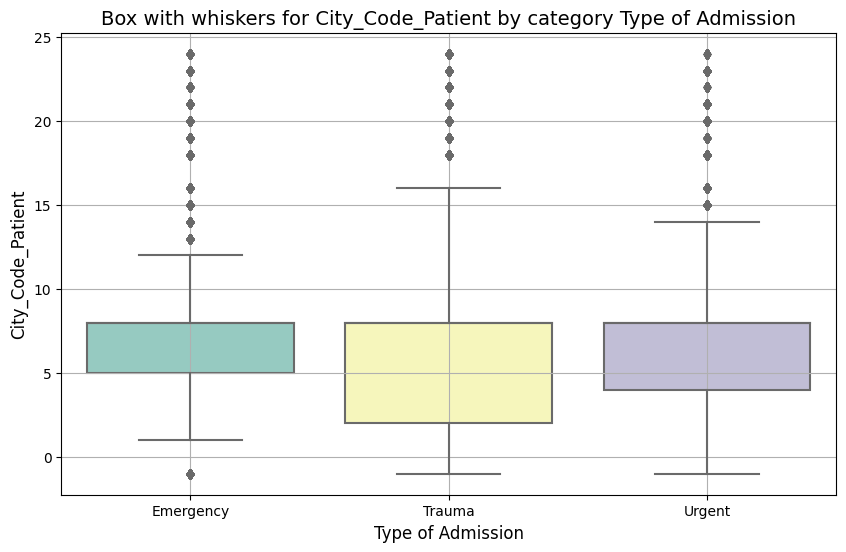

There is a dependency between City_Code_Patient and Type of Admission: the numeric character varies depending on the category Type of Admission


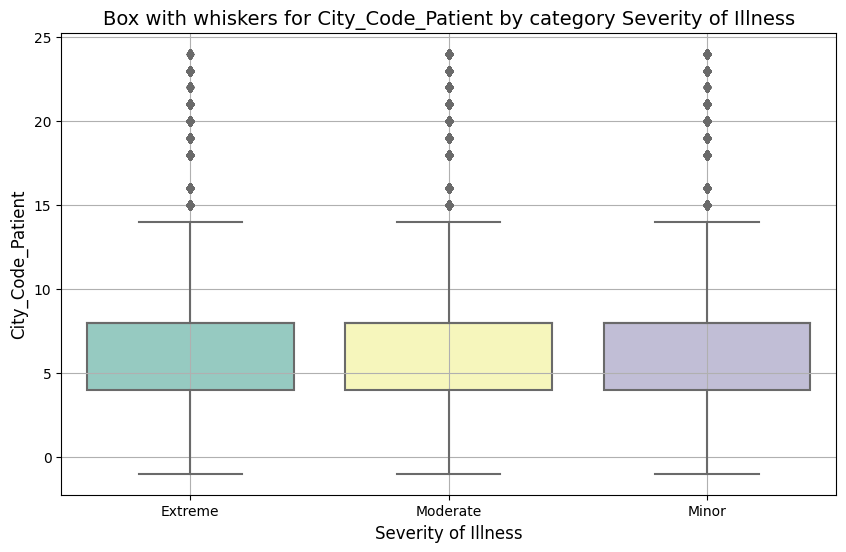

There is a dependency between City_Code_Patient and Severity of Illness: the numeric character varies depending on the category Severity of Illness


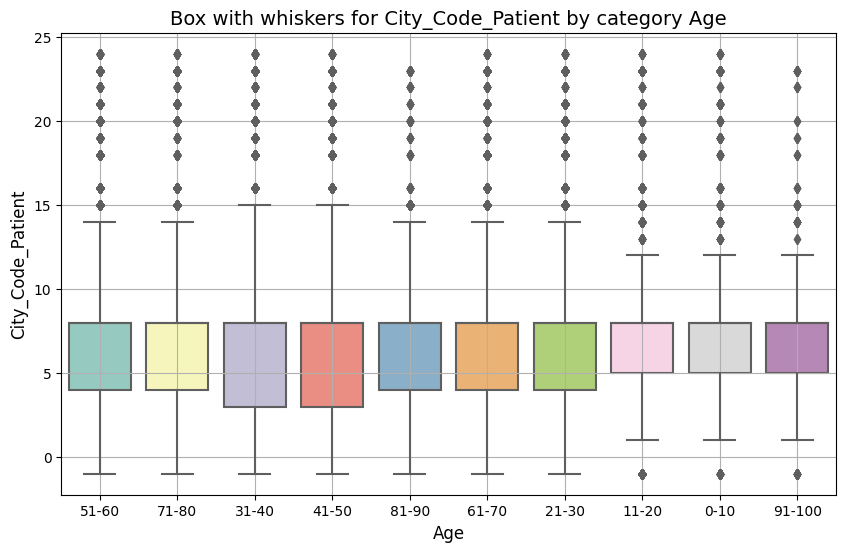

There is a dependency between City_Code_Patient and Age: the numeric character varies depending on the category Age


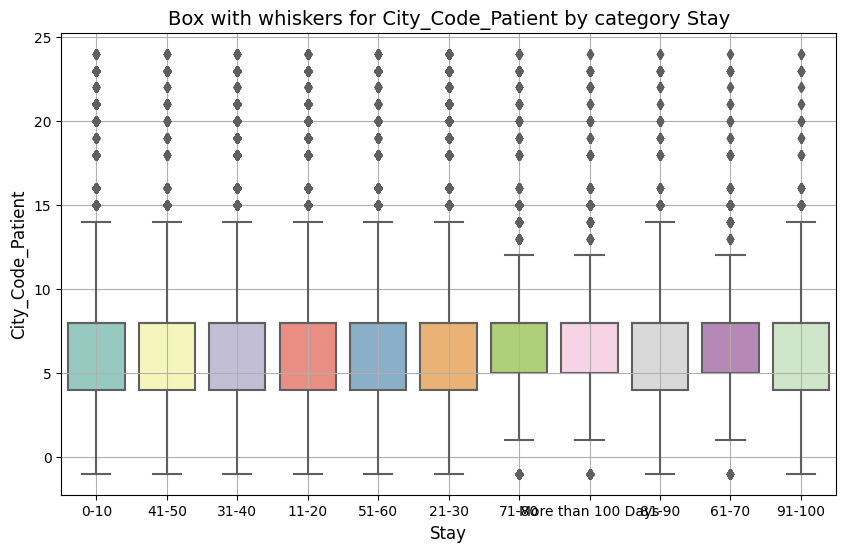

There is a dependency between City_Code_Patient and Stay: the numeric character varies depending on the category Stay


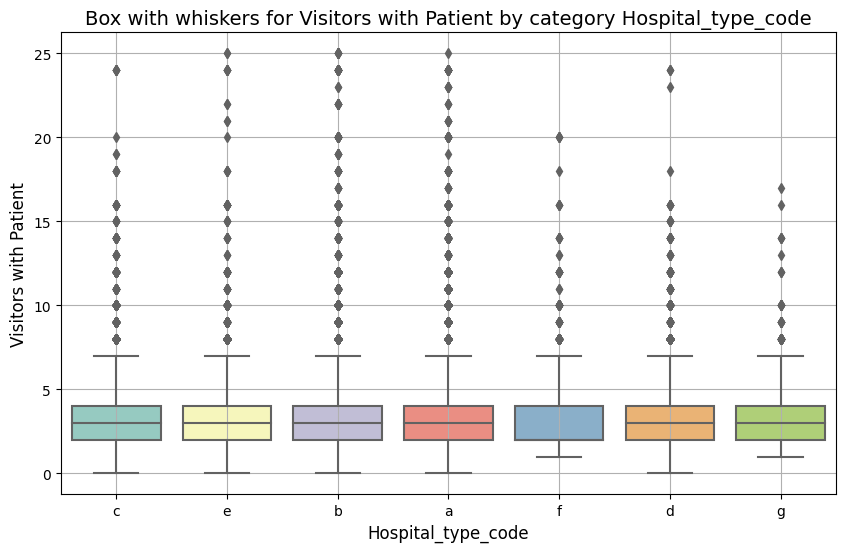

There is a dependency between Visitors with Patient and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


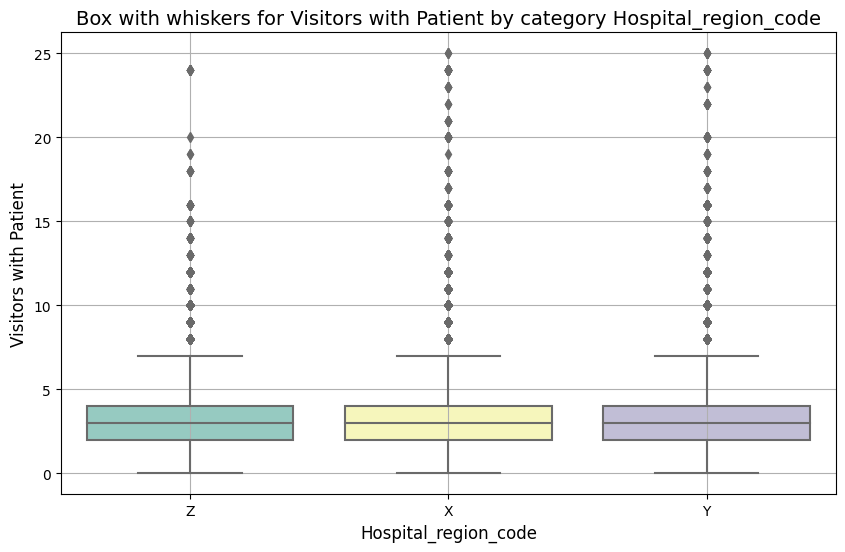

There is a dependency between Visitors with Patient and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


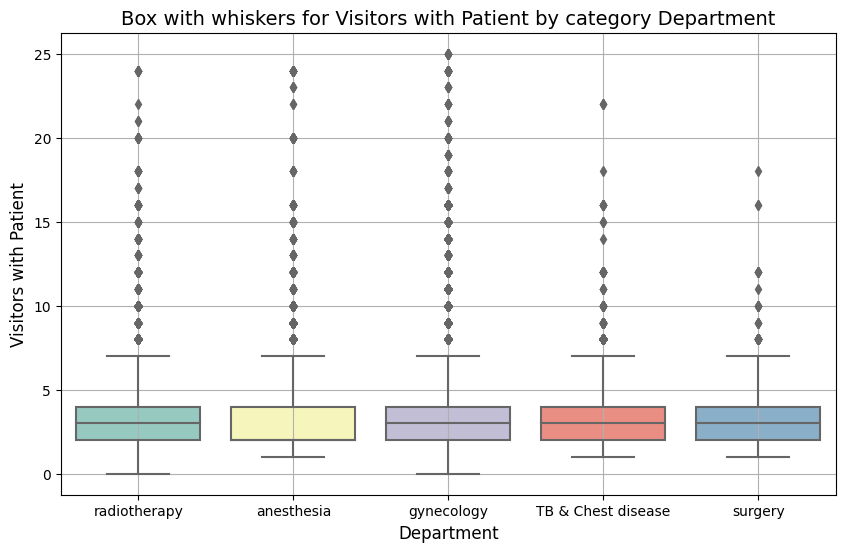

There is a dependency between Visitors with Patient and Department: the numeric character varies depending on the category Department


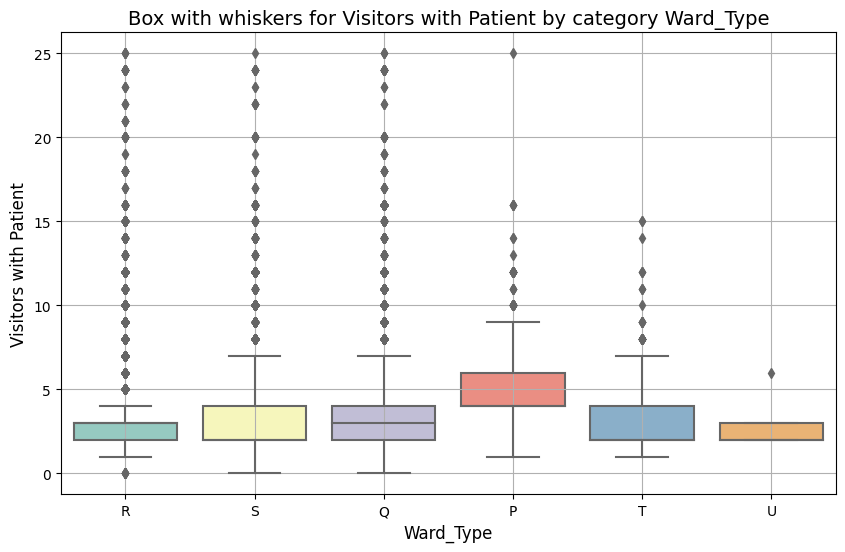

There is a dependency between Visitors with Patient and Ward_Type: the numeric character varies depending on the category Ward_Type


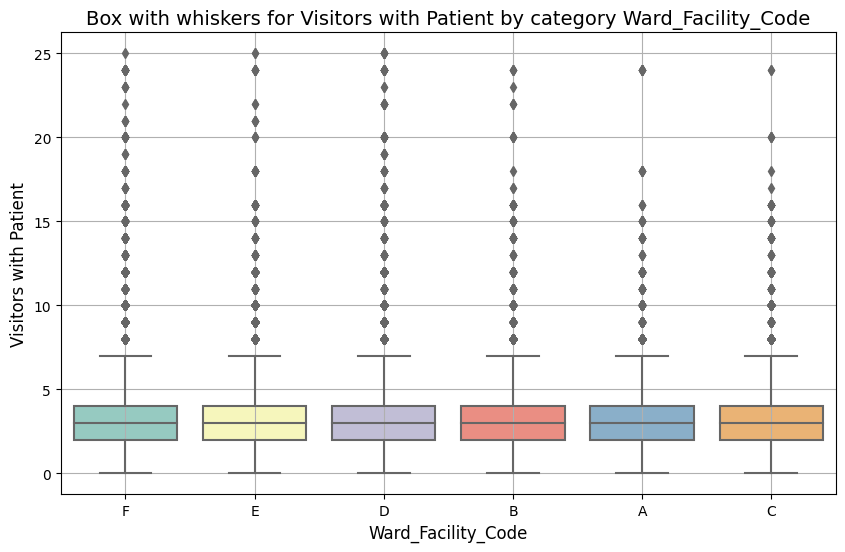

There is a dependency between Visitors with Patient and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


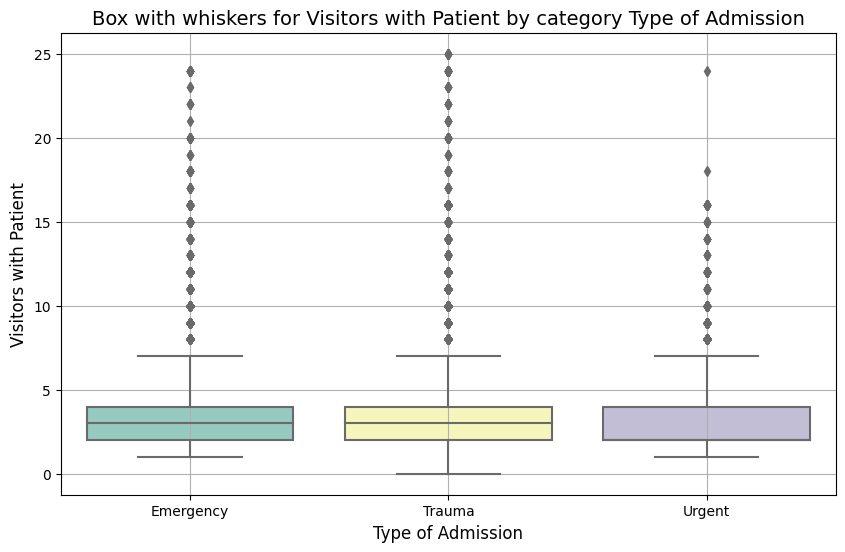

There is a dependency between Visitors with Patient and Type of Admission: the numeric character varies depending on the category Type of Admission


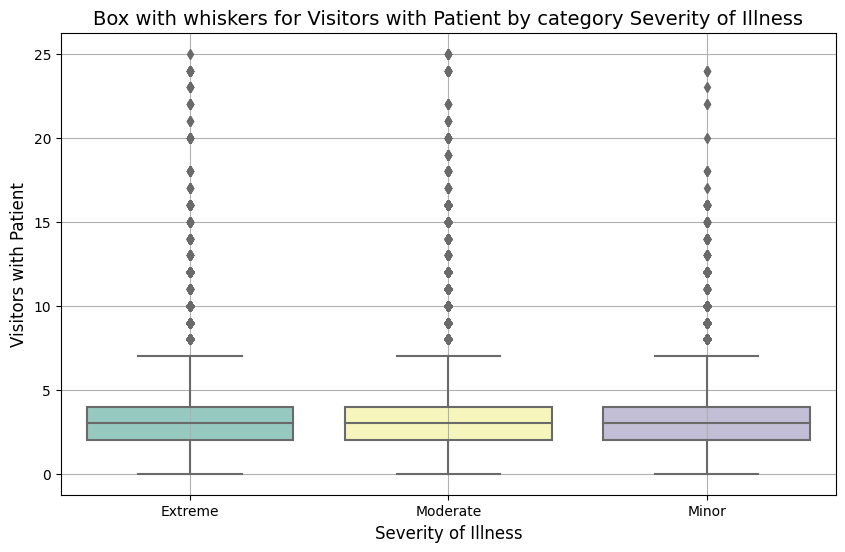

There is a dependency between Visitors with Patient and Severity of Illness: the numeric character varies depending on the category Severity of Illness


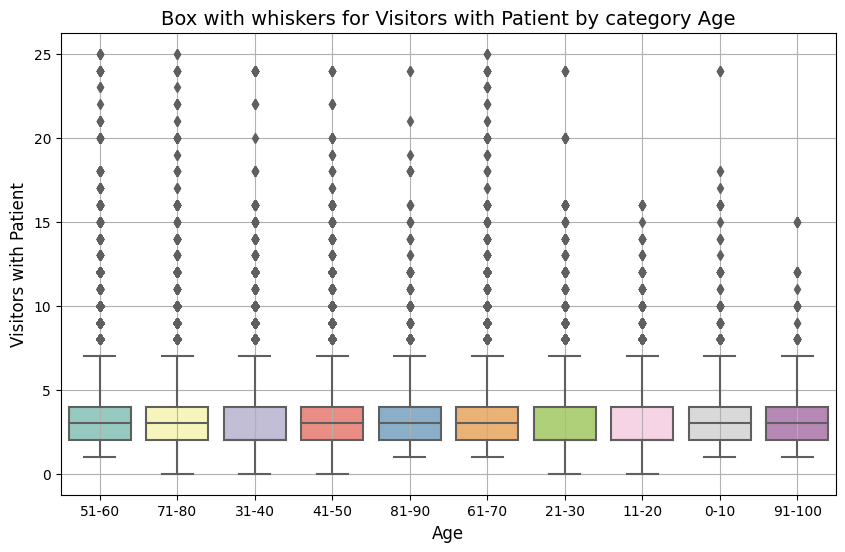

There is a dependency between Visitors with Patient and Age: the numeric character varies depending on the category Age


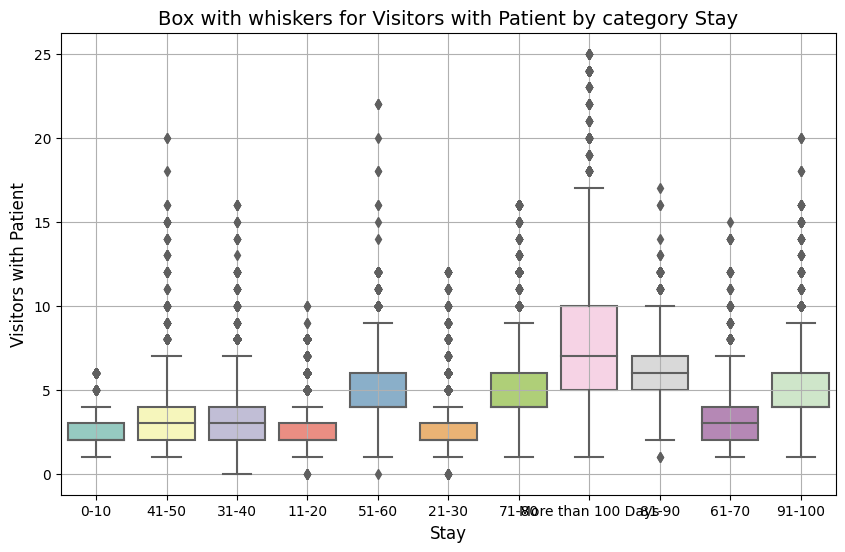

There is a dependency between Visitors with Patient and Stay: the numeric character varies depending on the category Stay


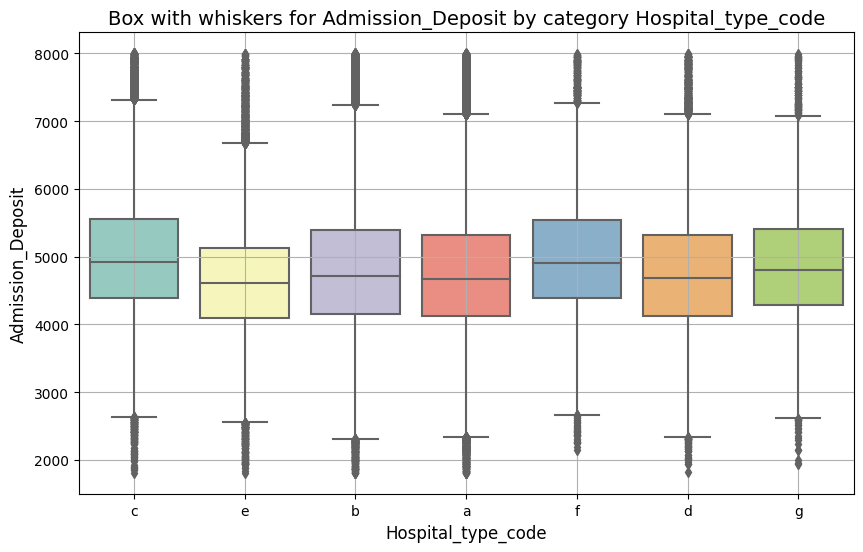

There is a dependency between Admission_Deposit and Hospital_type_code: the numeric character varies depending on the category Hospital_type_code


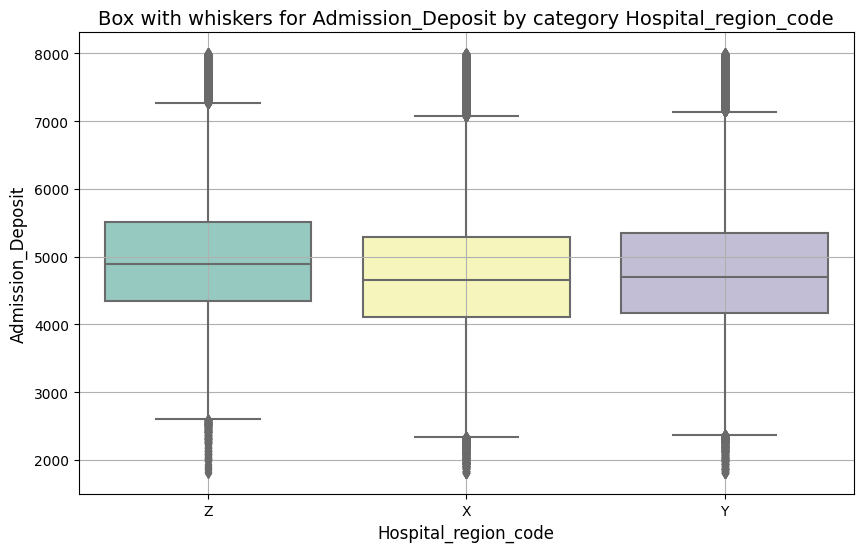

There is a dependency between Admission_Deposit and Hospital_region_code: the numeric character varies depending on the category Hospital_region_code


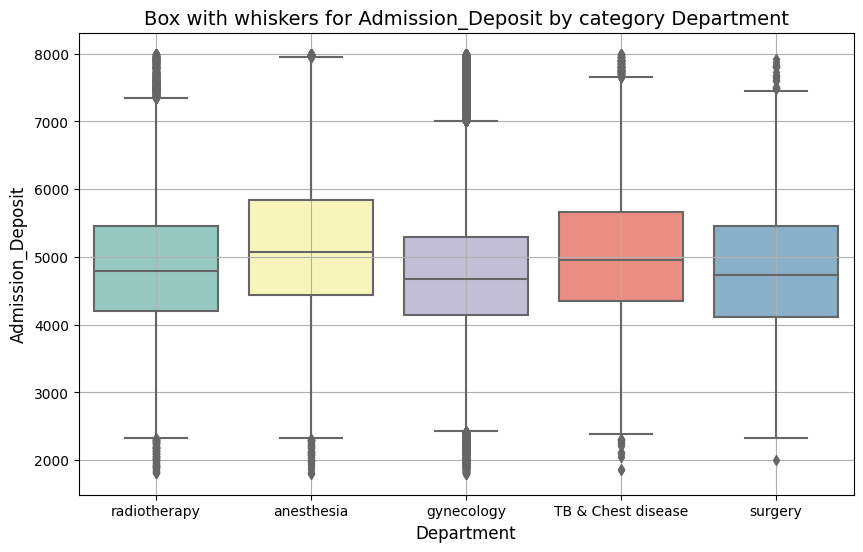

There is a dependency between Admission_Deposit and Department: the numeric character varies depending on the category Department


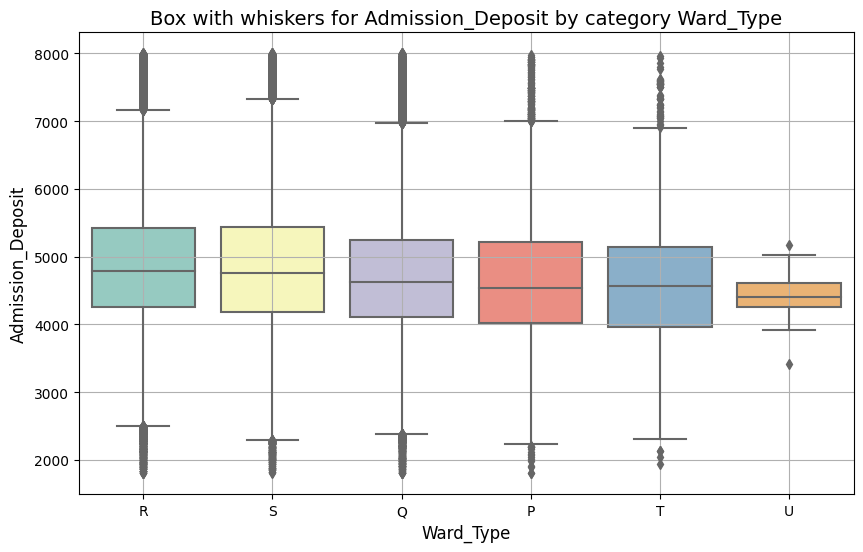

There is a dependency between Admission_Deposit and Ward_Type: the numeric character varies depending on the category Ward_Type


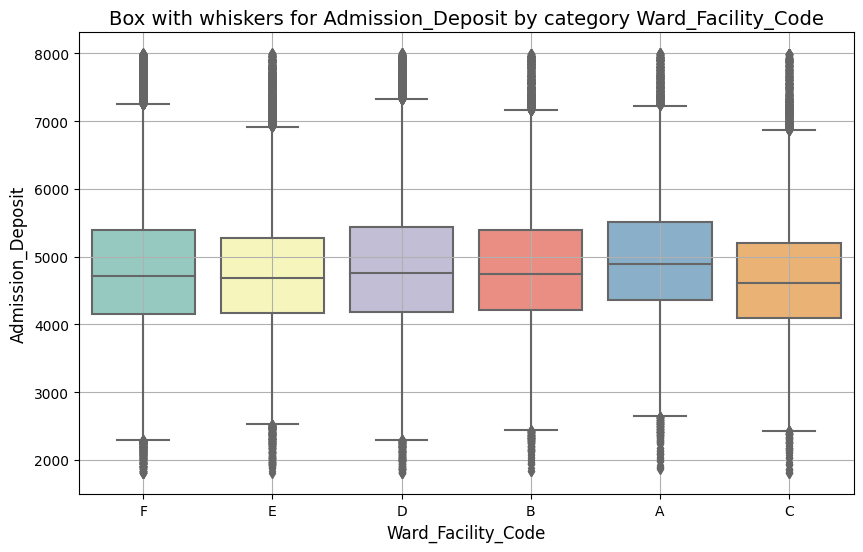

There is a dependency between Admission_Deposit and Ward_Facility_Code: the numeric character varies depending on the category Ward_Facility_Code


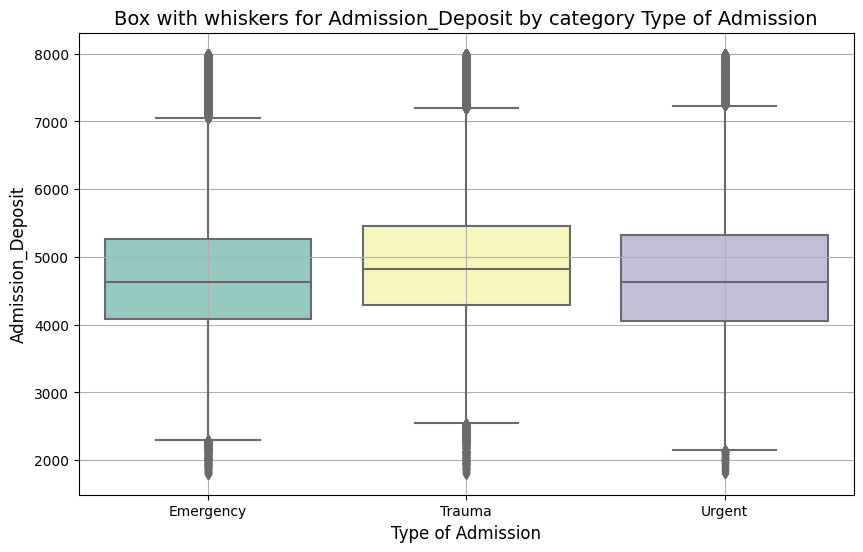

There is a dependency between Admission_Deposit and Type of Admission: the numeric character varies depending on the category Type of Admission


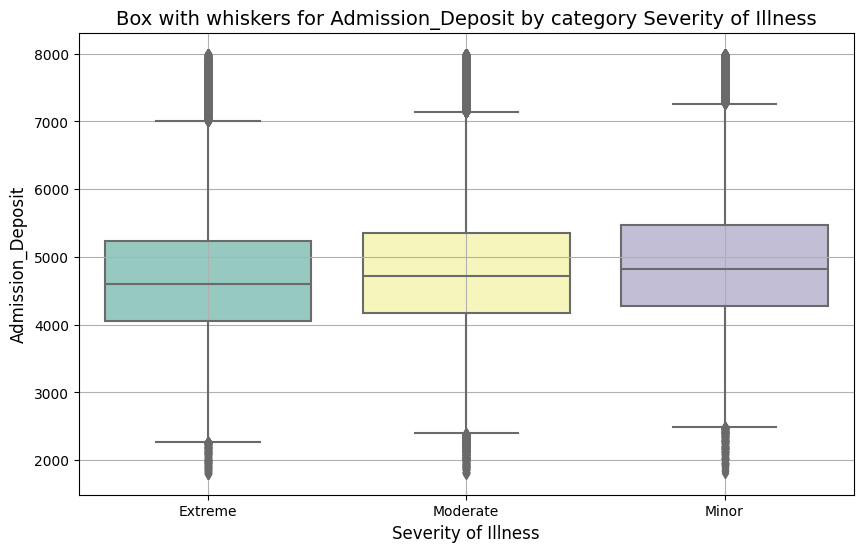

There is a dependency between Admission_Deposit and Severity of Illness: the numeric character varies depending on the category Severity of Illness


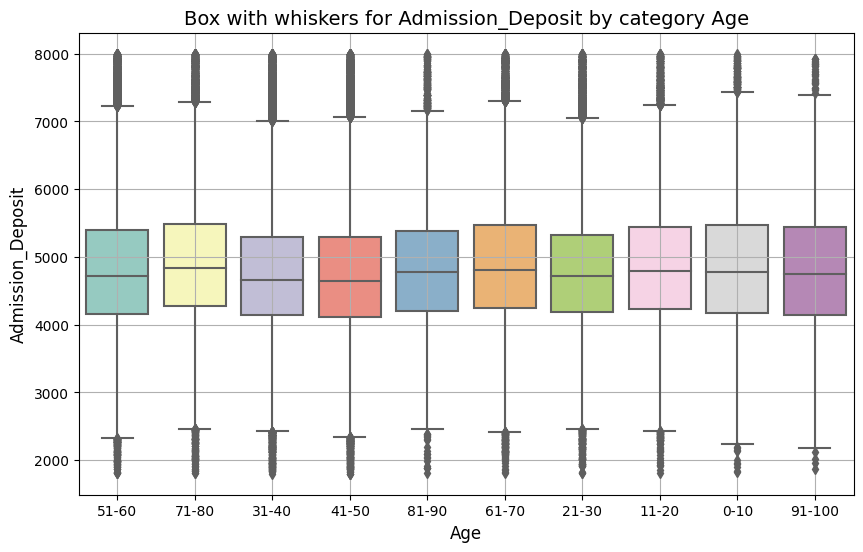

There is a dependency between Admission_Deposit and Age: the numeric character varies depending on the category Age


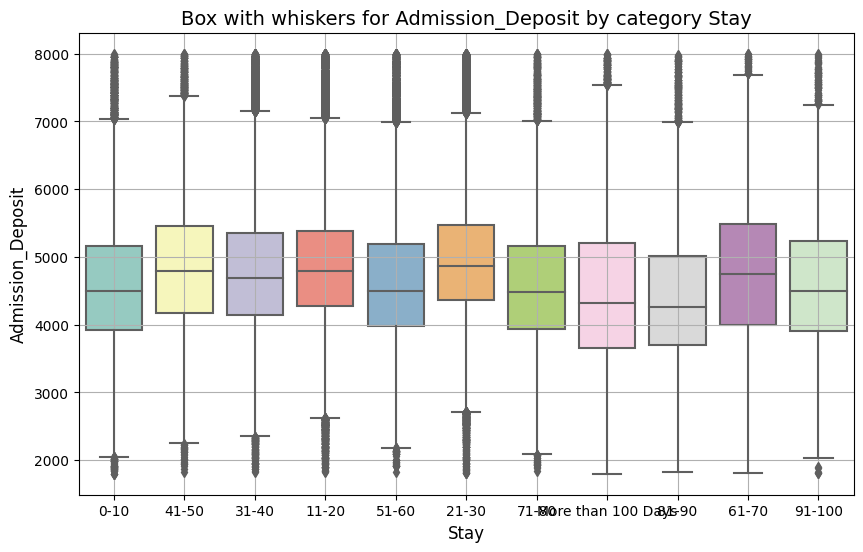

There is a dependency between Admission_Deposit and Stay: the numeric character varies depending on the category Stay


In [39]:
# Group boxes with whiskers for numeric features, depending on categorical features
for num_col in numerical_cols:
    for cat_col in categorical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=data, palette="Set3")
        plt.title(f'Box with whiskers for {num_col} by category {cat_col}', fontsize=14)
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.grid(True)
        plt.show()

        # Dependency description
        if data.groupby(cat_col)[num_col].mean().std() > 0:
            print(f"There is a dependency between {num_col} and {cat_col}: the numeric character varies depending on the category {cat_col}")
        else:
            print(f"No significant relationship between {num_col} and {cat_col}")

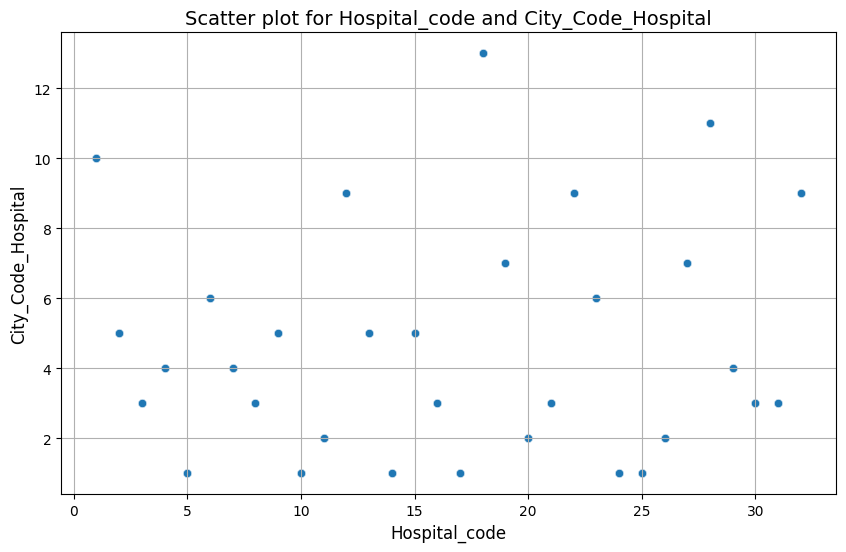

There is no strong dependency between Hospital_code and City_Code_Hospital


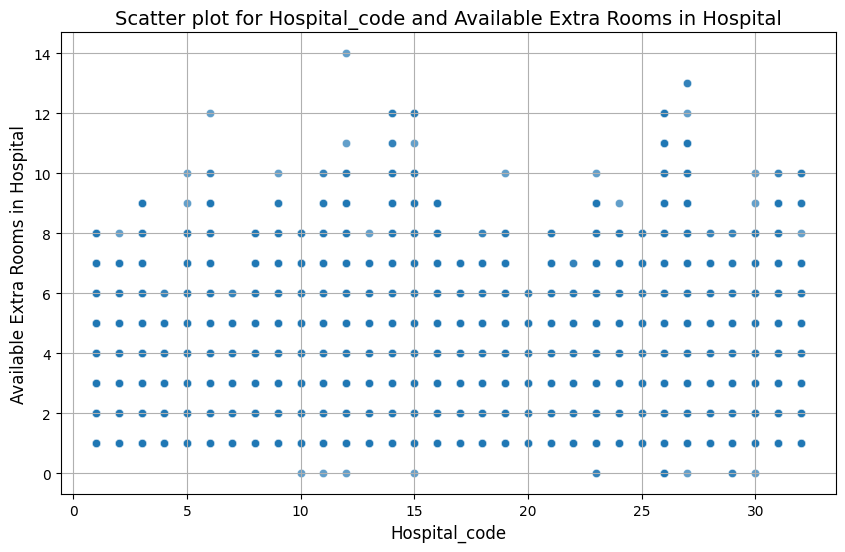

There is no strong dependency between Hospital_code and Available Extra Rooms in Hospital


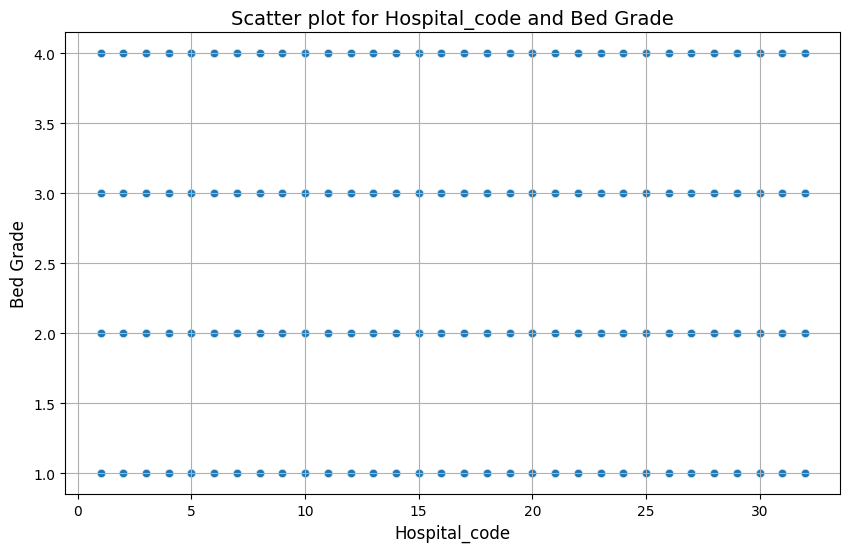

There is no strong dependency between Hospital_code and Bed Grade


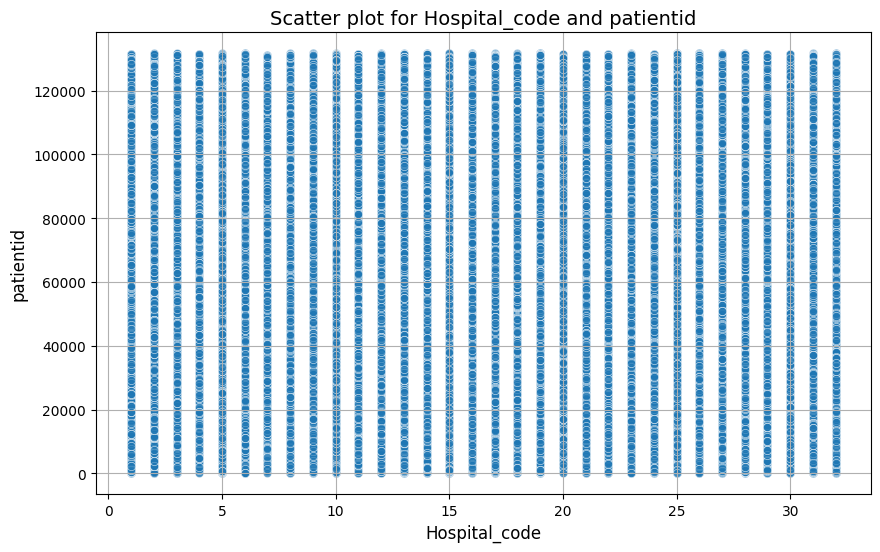

There is no strong dependency between Hospital_code and patientid


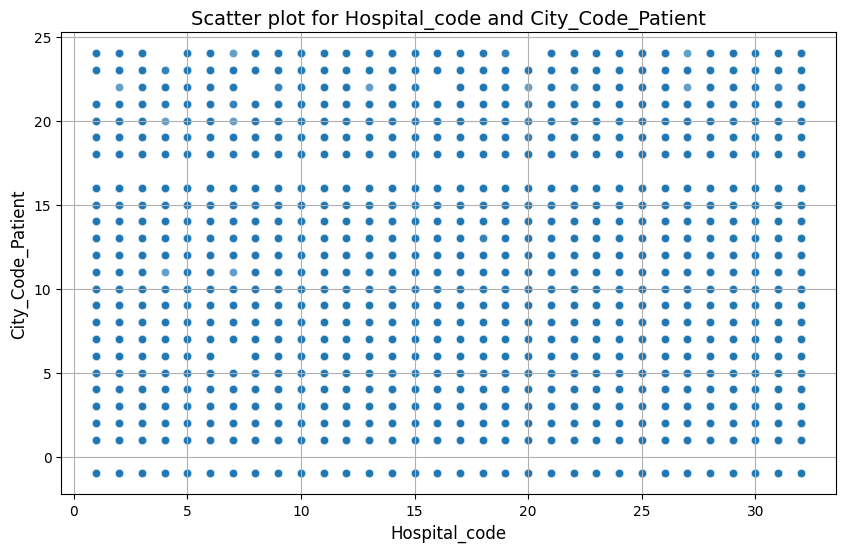

There is no strong dependency between Hospital_code and City_Code_Patient


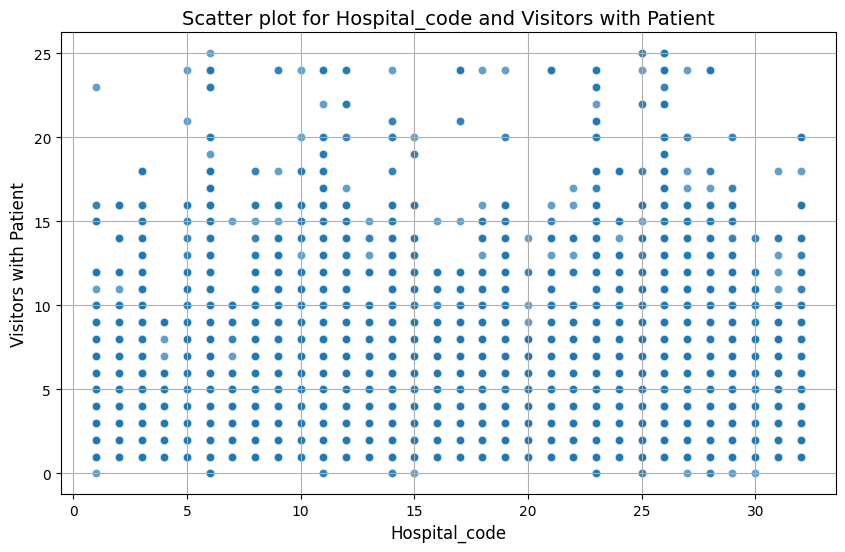

There is no strong dependency between Hospital_code and Visitors with Patient


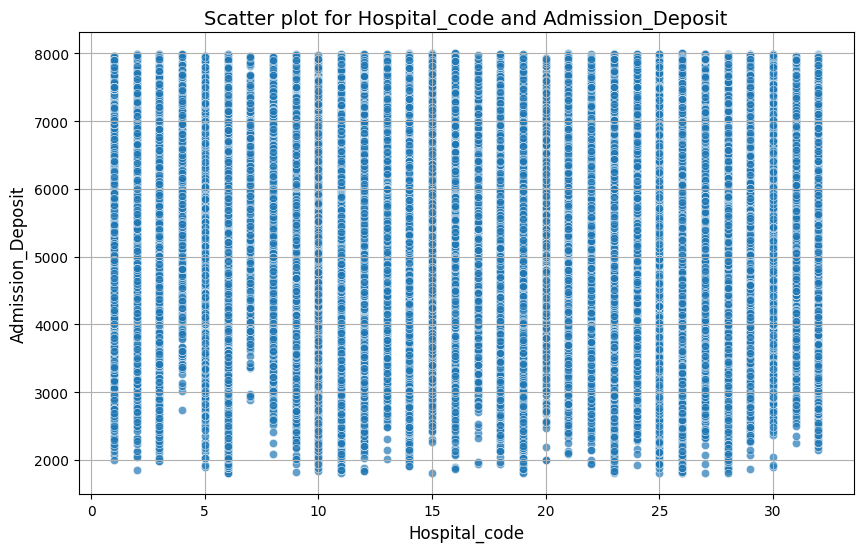

There is no strong dependency between Hospital_code and Admission_Deposit


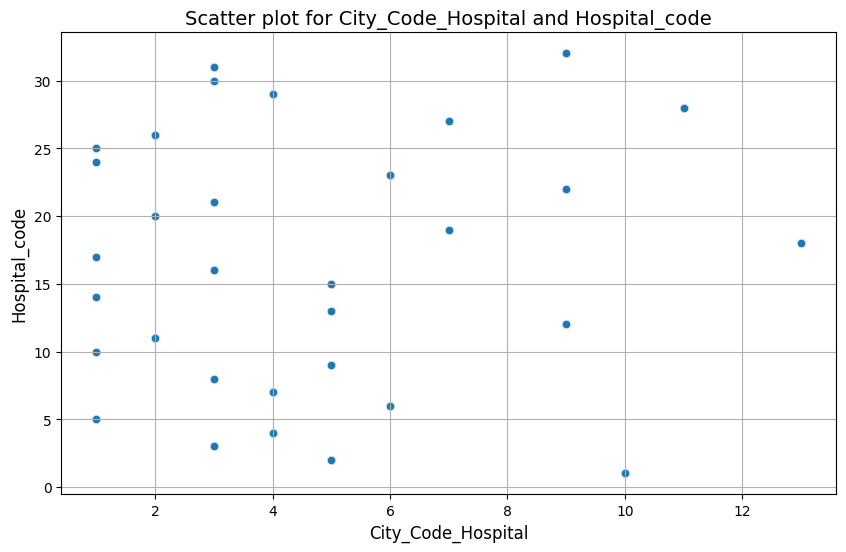

There is no strong dependency between City_Code_Hospital and Hospital_code


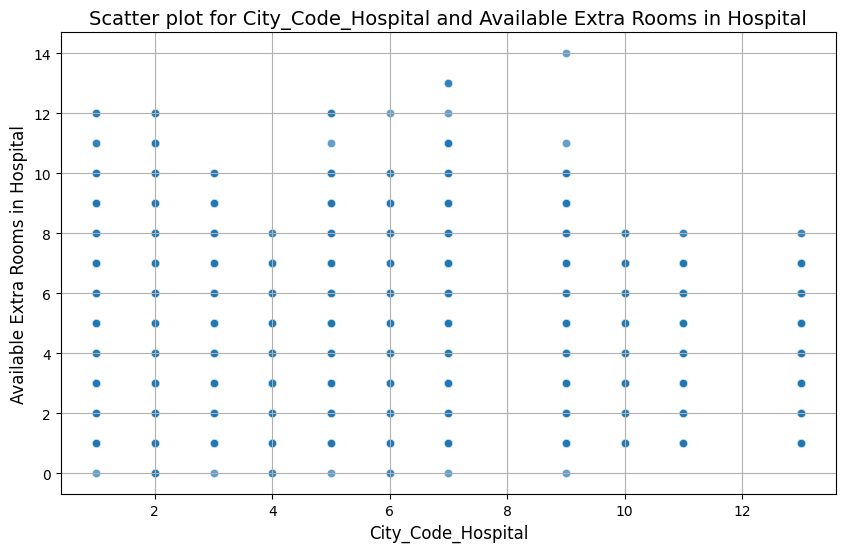

There is no strong dependency between City_Code_Hospital and Available Extra Rooms in Hospital


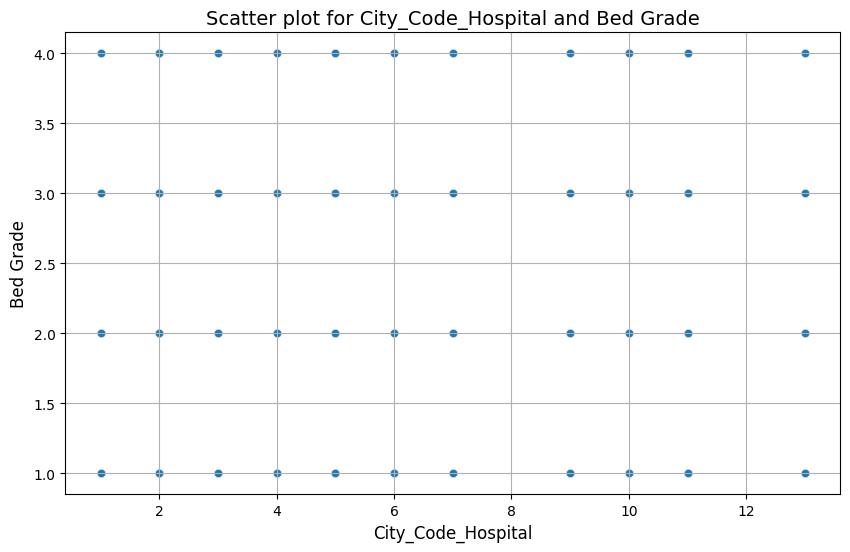

There is no strong dependency between City_Code_Hospital and Bed Grade


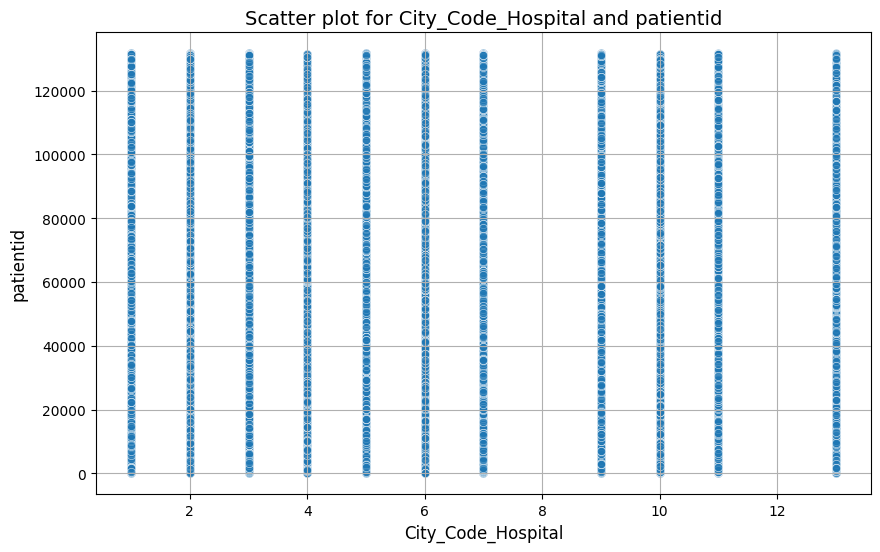

There is no strong dependency between City_Code_Hospital and patientid


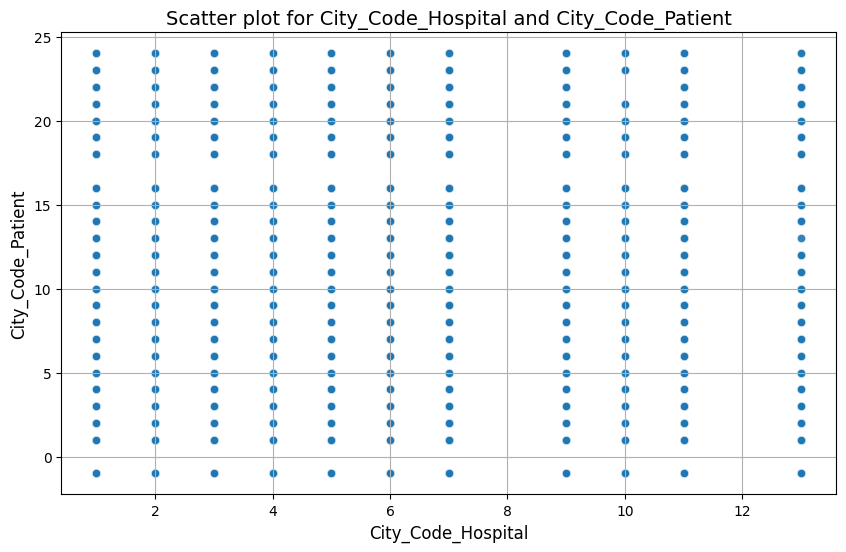

There is no strong dependency between City_Code_Hospital and City_Code_Patient


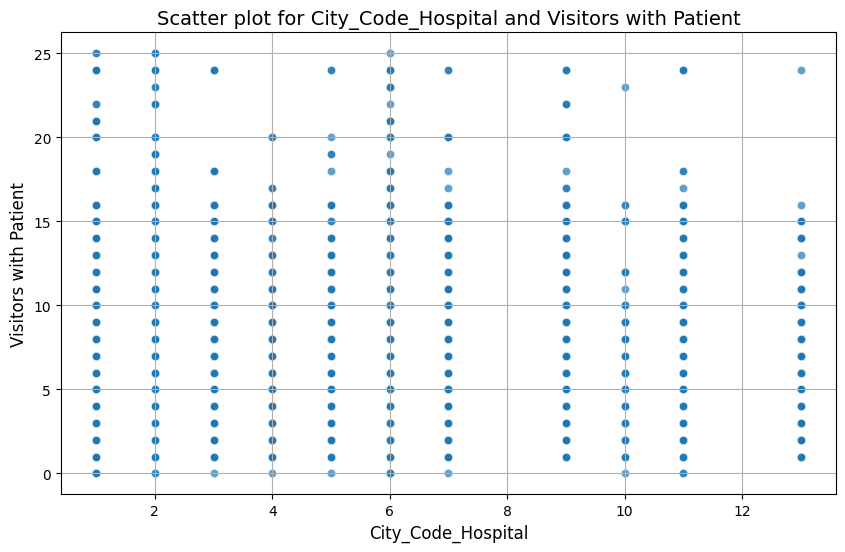

There is no strong dependency between City_Code_Hospital and Visitors with Patient


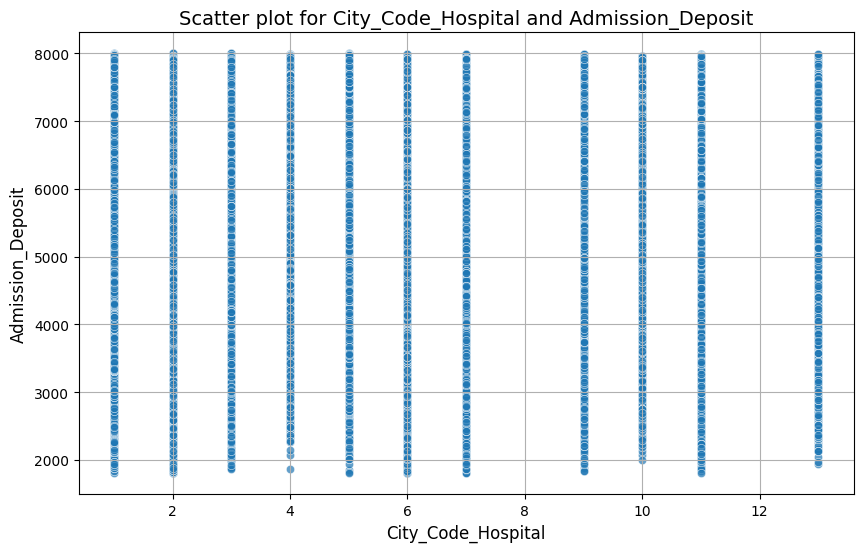

There is no strong dependency between City_Code_Hospital and Admission_Deposit


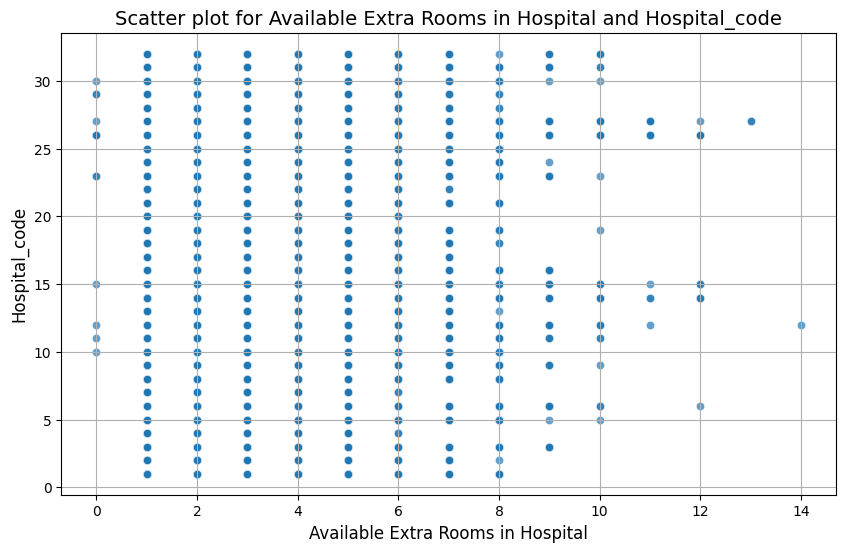

There is no strong dependency between Available Extra Rooms in Hospital and Hospital_code


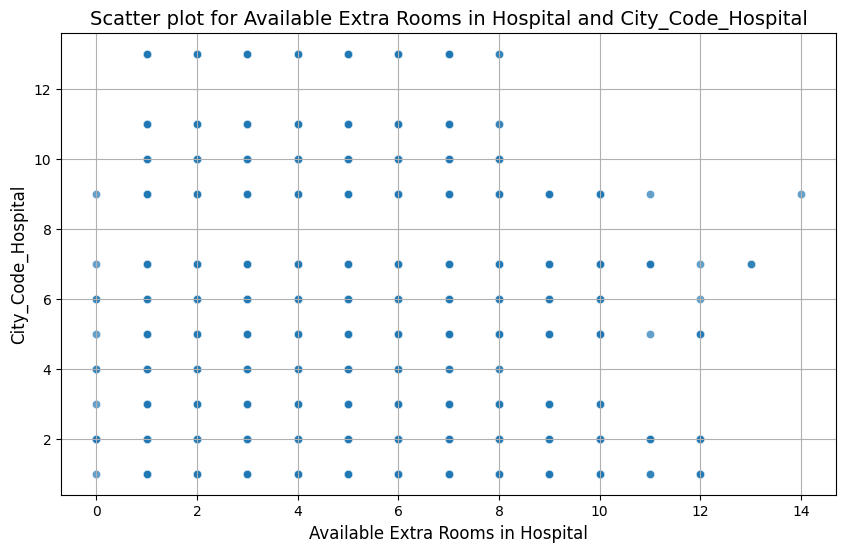

There is no strong dependency between Available Extra Rooms in Hospital and City_Code_Hospital


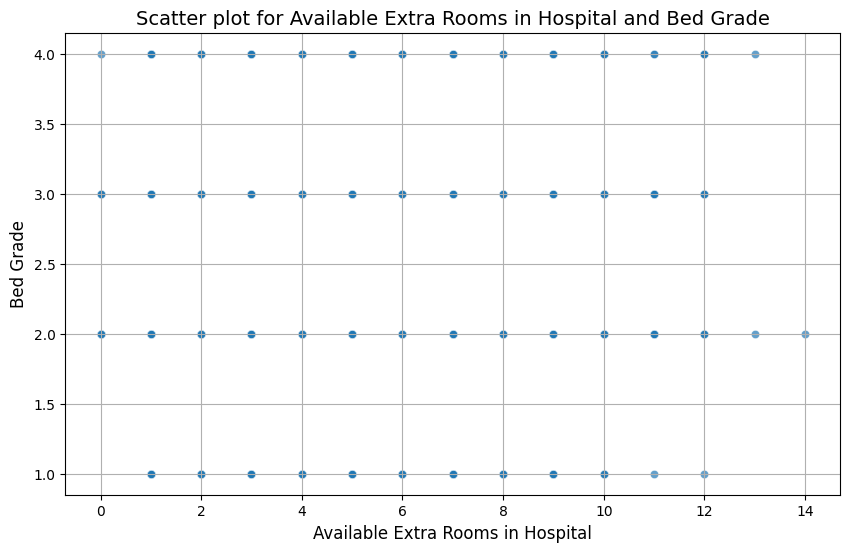

There is no strong dependency between Available Extra Rooms in Hospital and Bed Grade


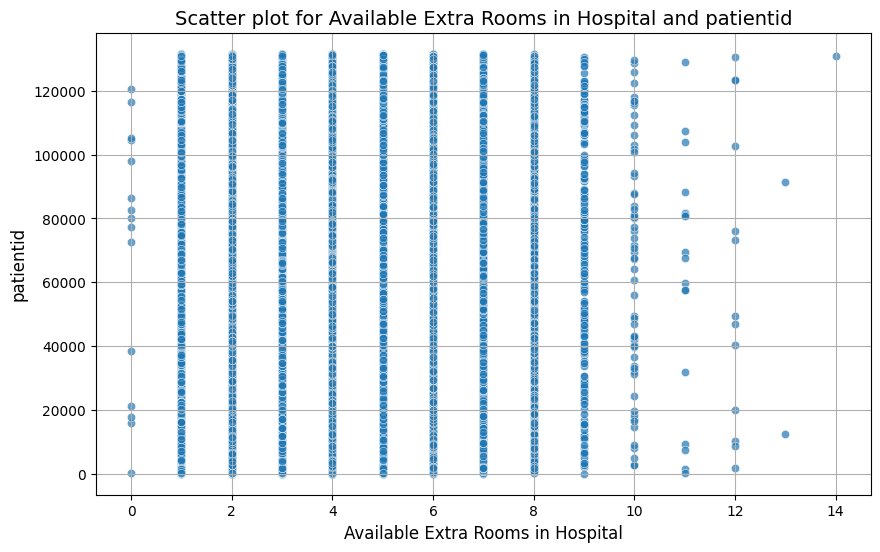

There is no strong dependency between Available Extra Rooms in Hospital and patientid


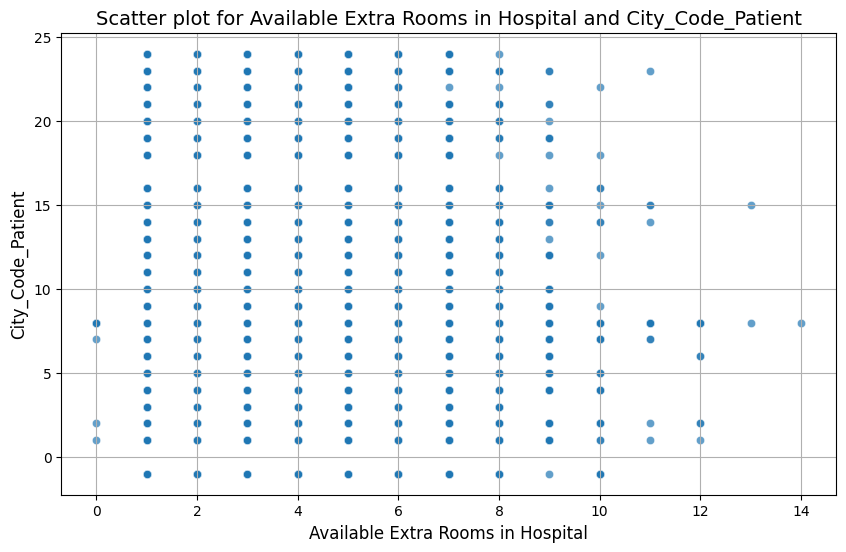

There is no strong dependency between Available Extra Rooms in Hospital and City_Code_Patient


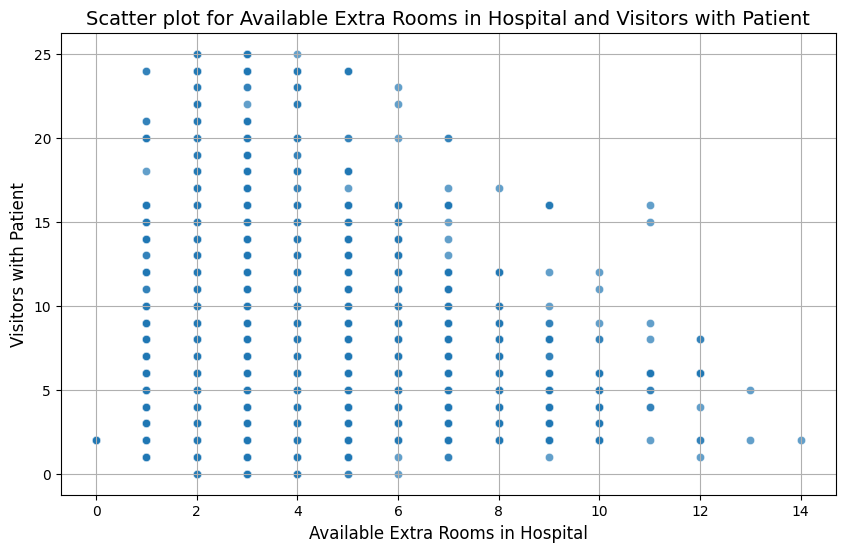

There is no strong dependency between Available Extra Rooms in Hospital and Visitors with Patient


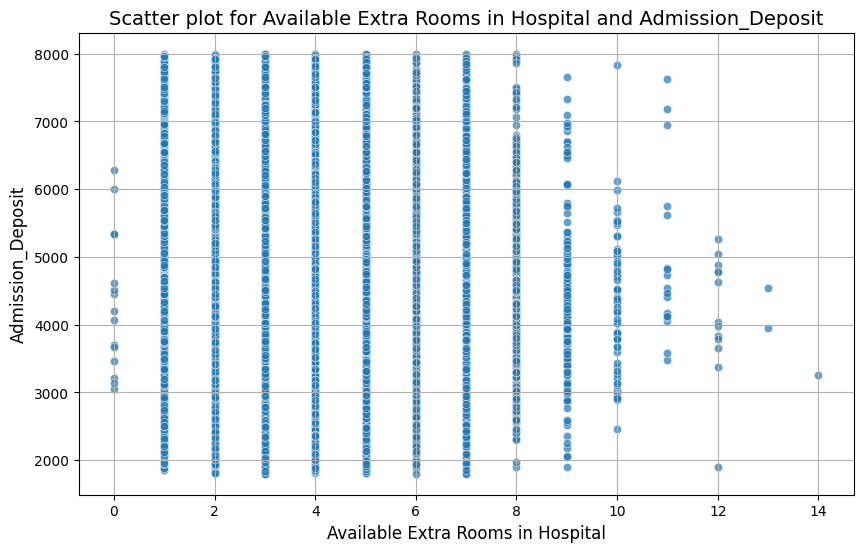

There is no strong dependency between Available Extra Rooms in Hospital and Admission_Deposit


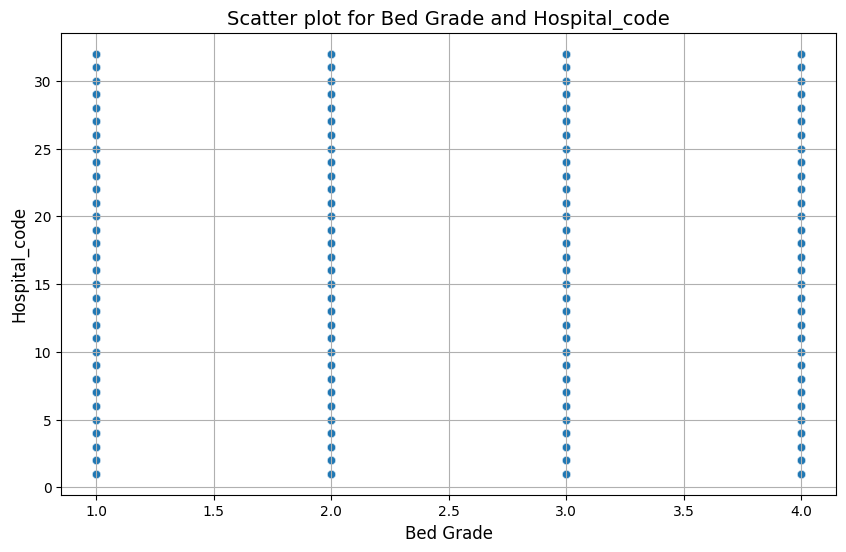

There is no strong dependency between Bed Grade and Hospital_code


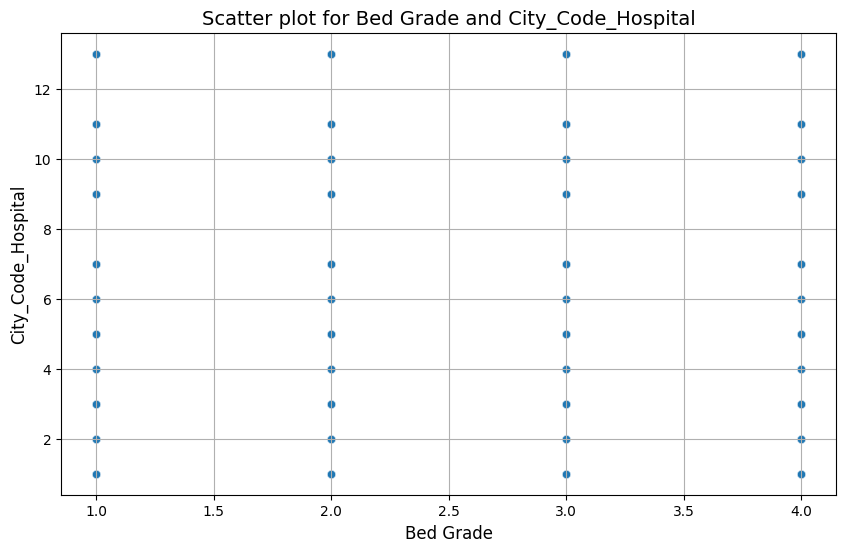

There is no strong dependency between Bed Grade and City_Code_Hospital


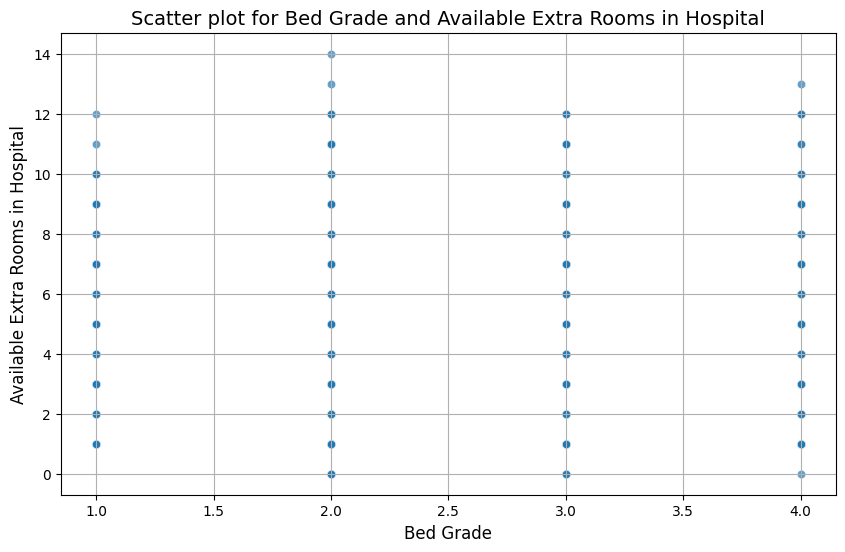

There is no strong dependency between Bed Grade and Available Extra Rooms in Hospital


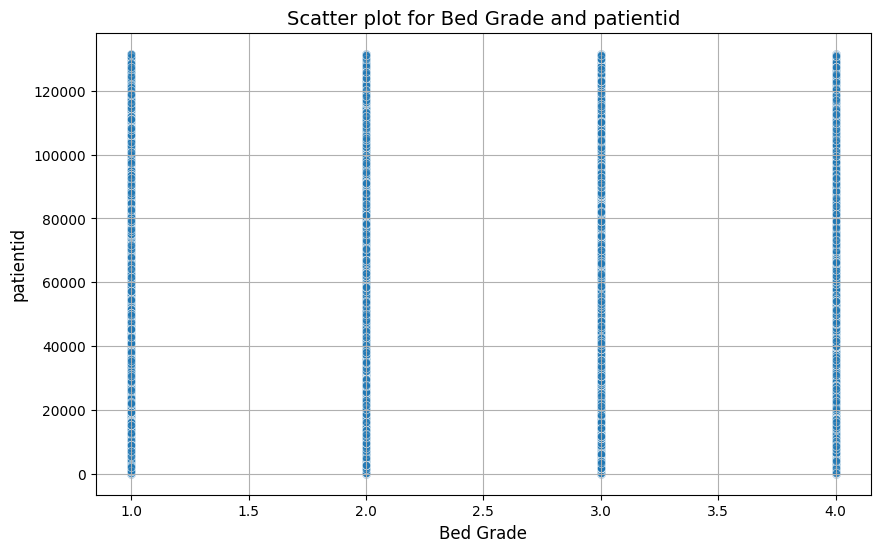

There is no strong dependency between Bed Grade and patientid


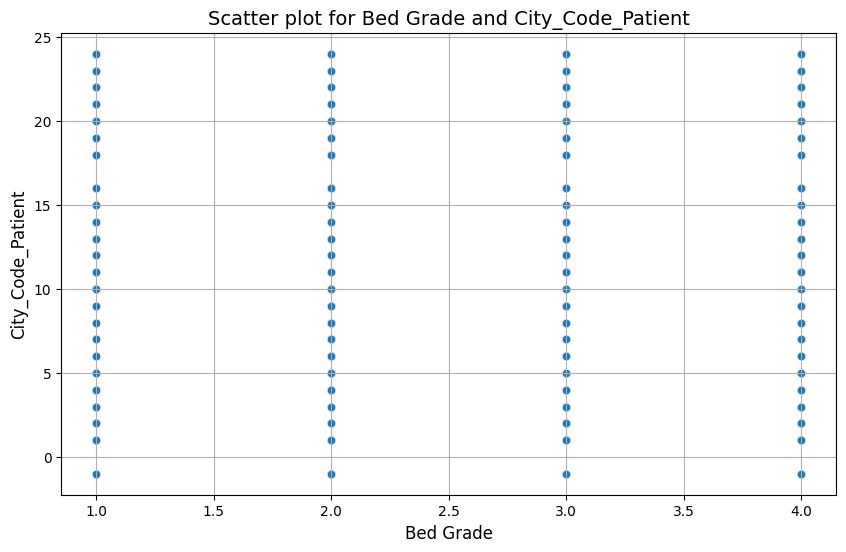

There is no strong dependency between Bed Grade and City_Code_Patient


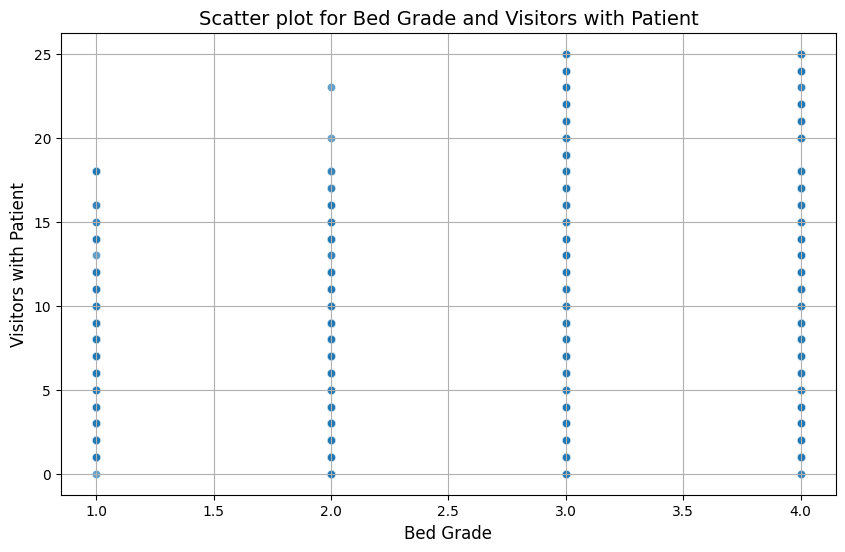

There is no strong dependency between Bed Grade and Visitors with Patient


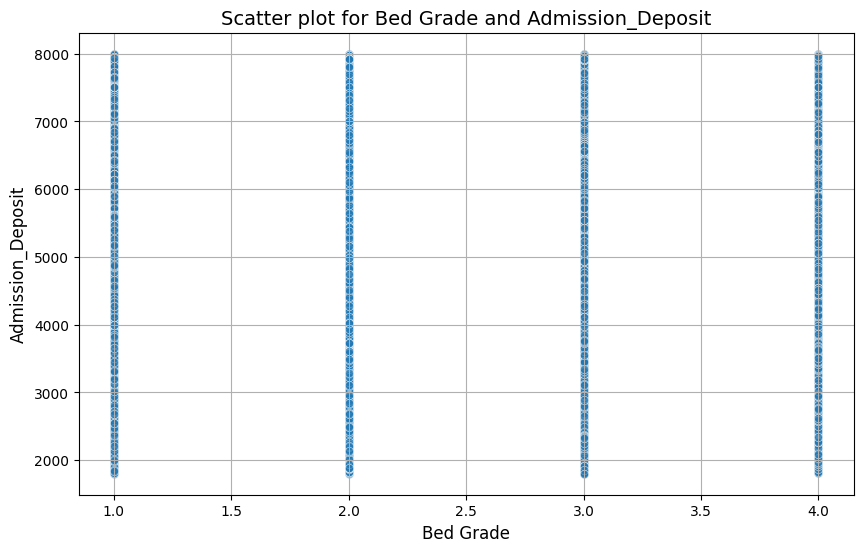

There is no strong dependency between Bed Grade and Admission_Deposit


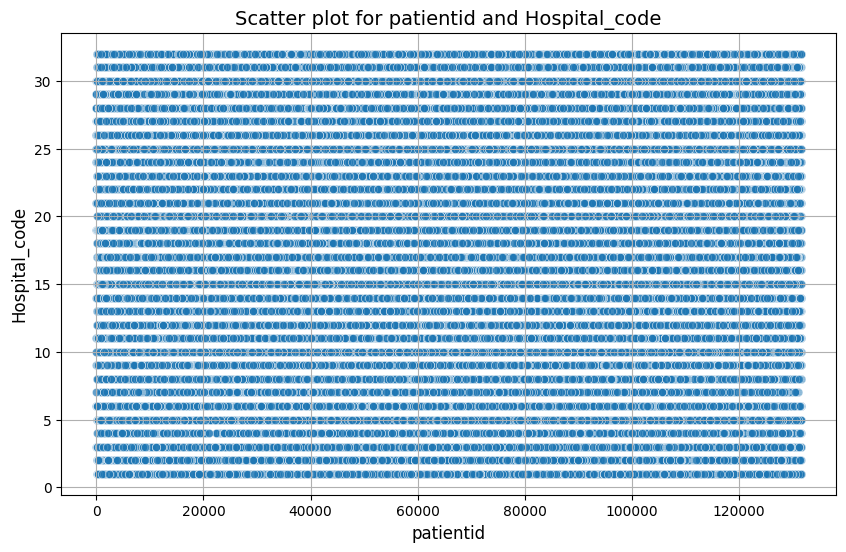

There is no strong dependency between patientid and Hospital_code


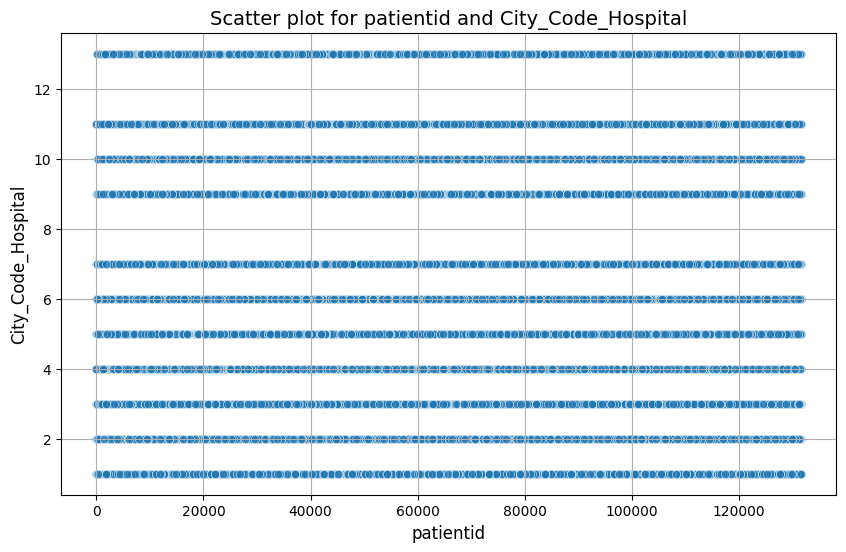

There is no strong dependency between patientid and City_Code_Hospital


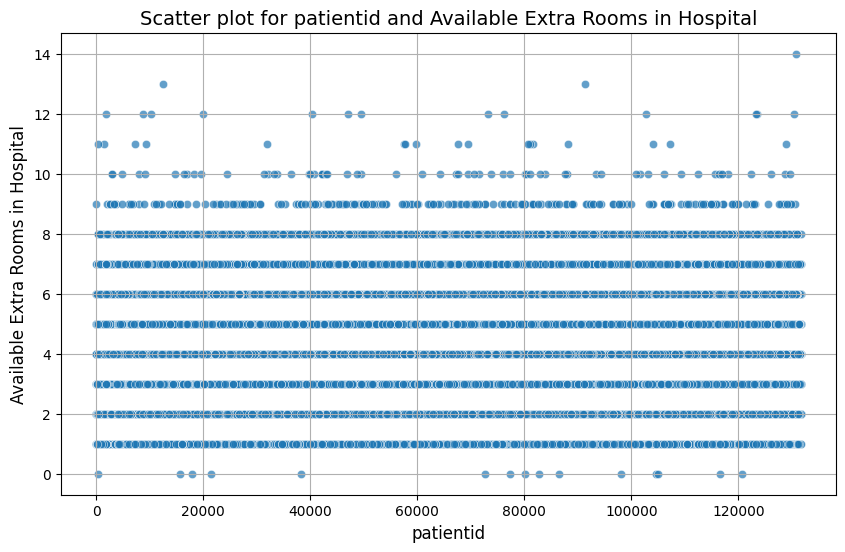

There is no strong dependency between patientid and Available Extra Rooms in Hospital


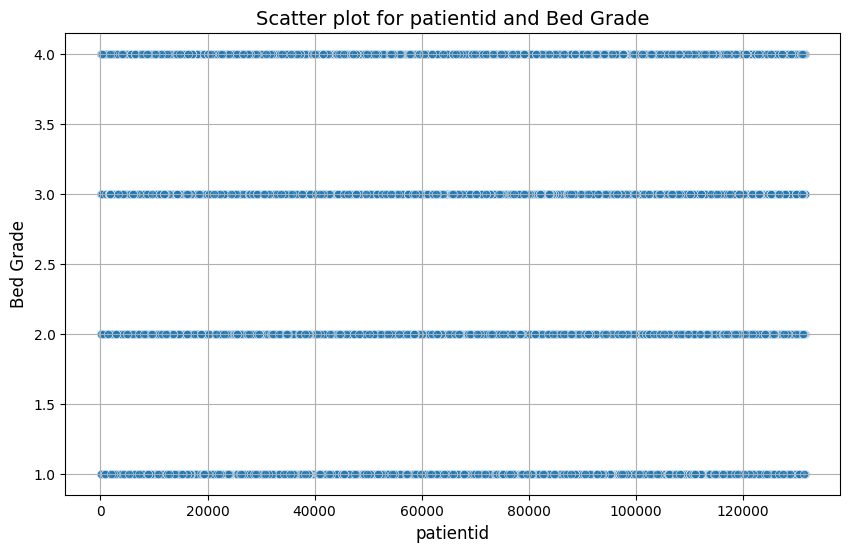

There is no strong dependency between patientid and Bed Grade


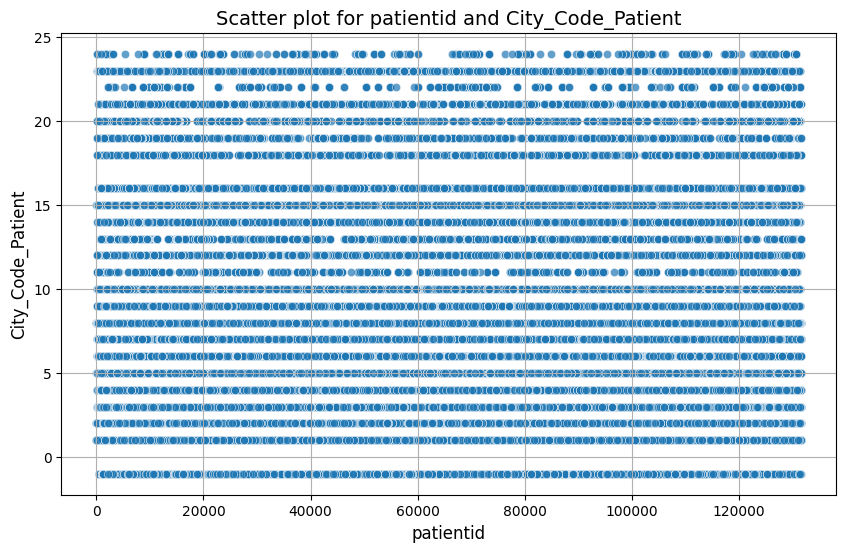

There is no strong dependency between patientid and City_Code_Patient


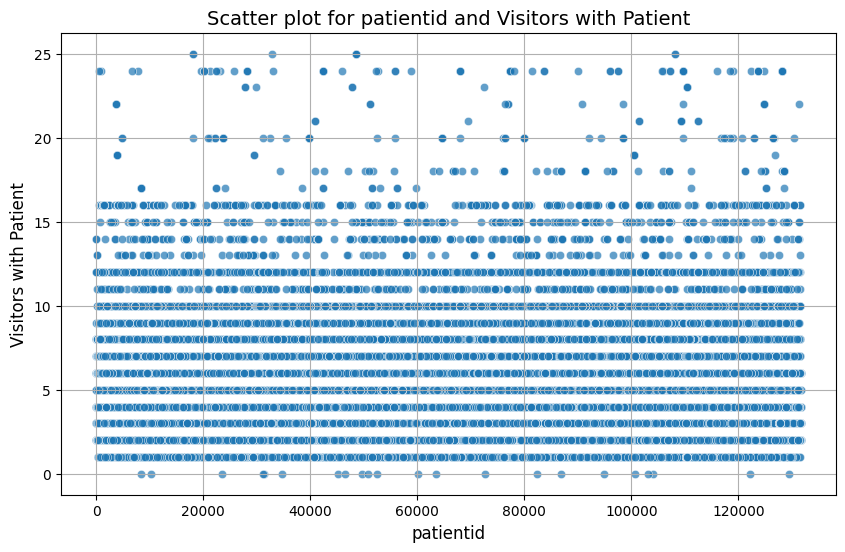

There is no strong dependency between patientid and Visitors with Patient


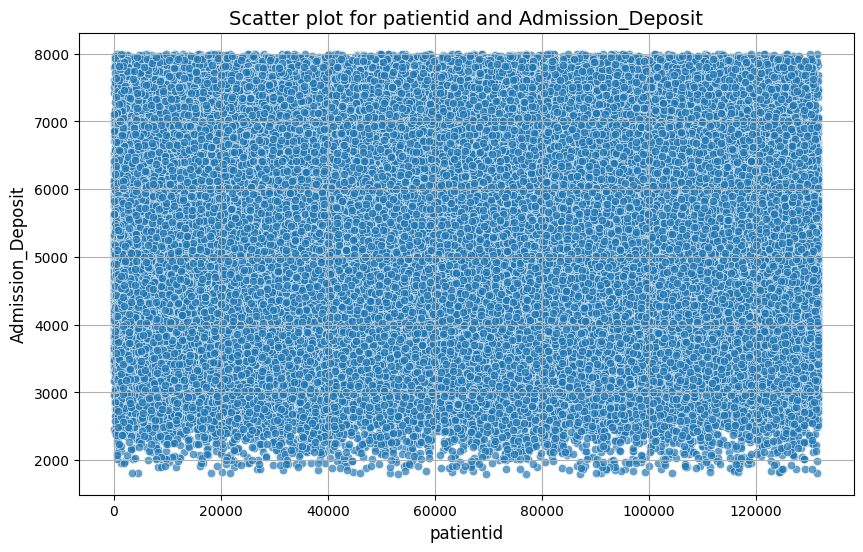

There is no strong dependency between patientid and Admission_Deposit


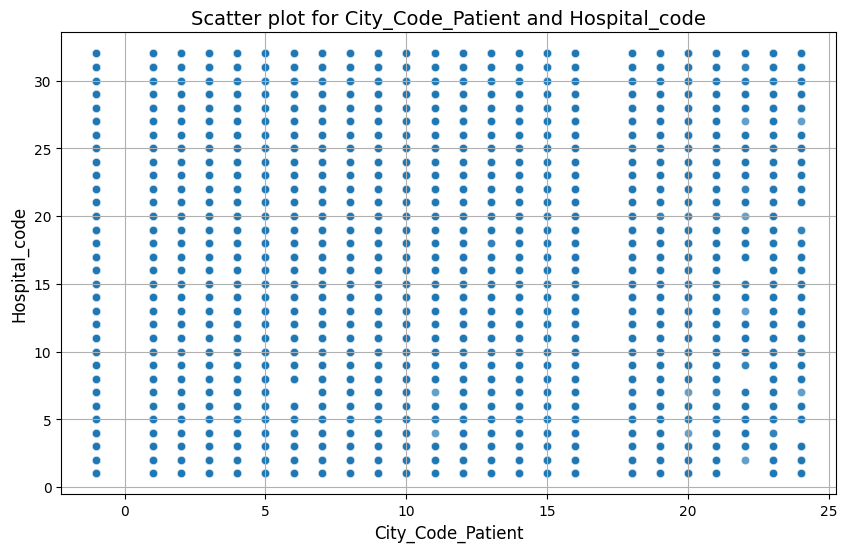

There is no strong dependency between City_Code_Patient and Hospital_code


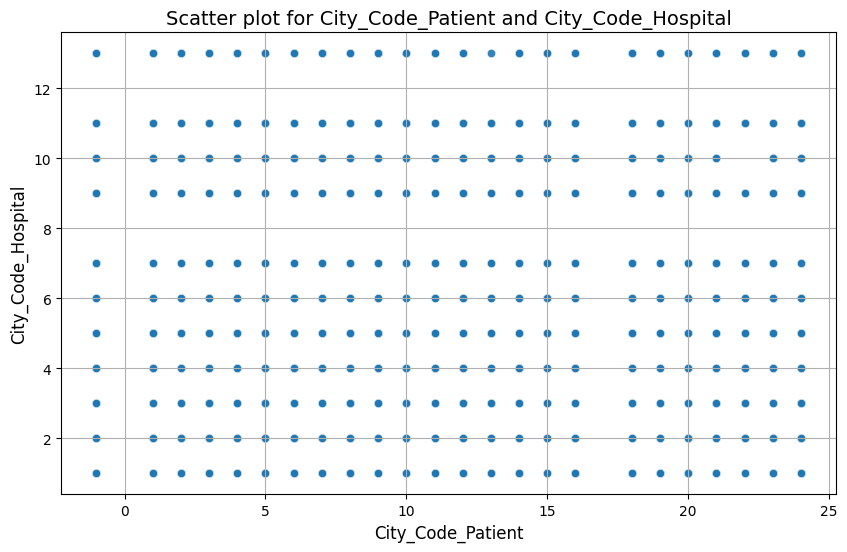

There is no strong dependency between City_Code_Patient and City_Code_Hospital


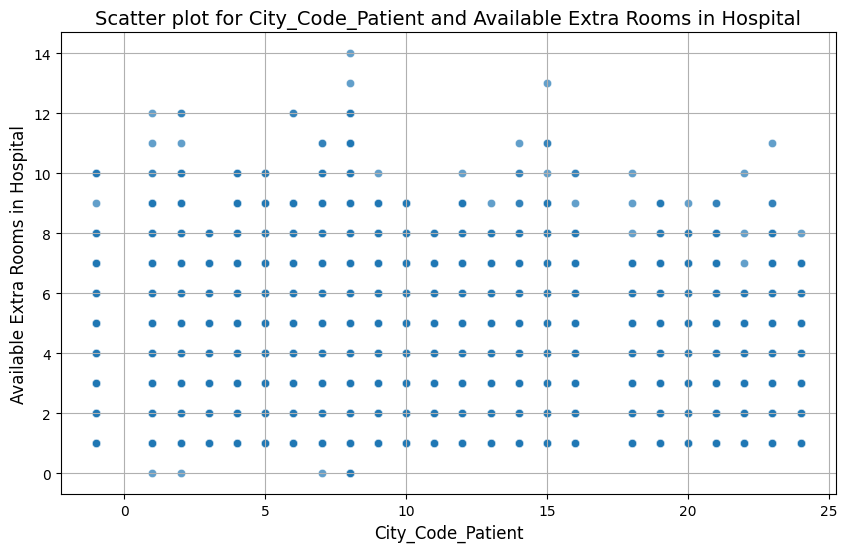

There is no strong dependency between City_Code_Patient and Available Extra Rooms in Hospital


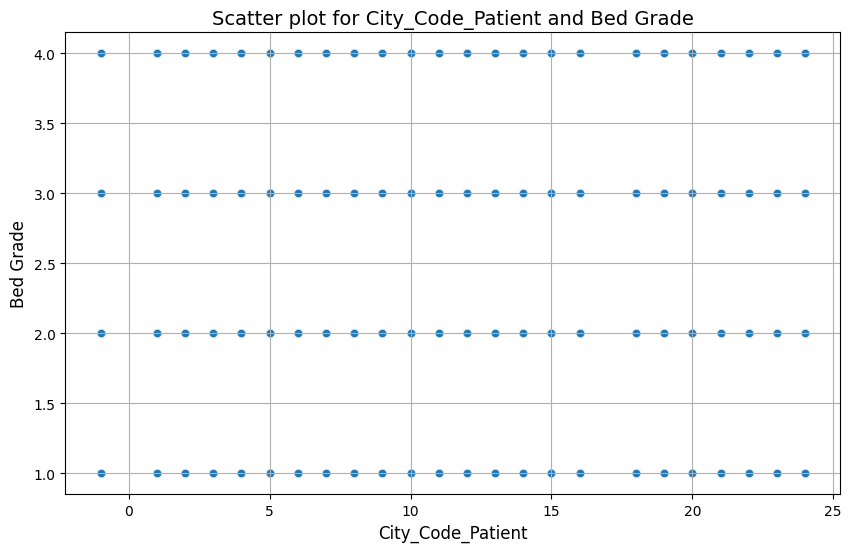

There is no strong dependency between City_Code_Patient and Bed Grade


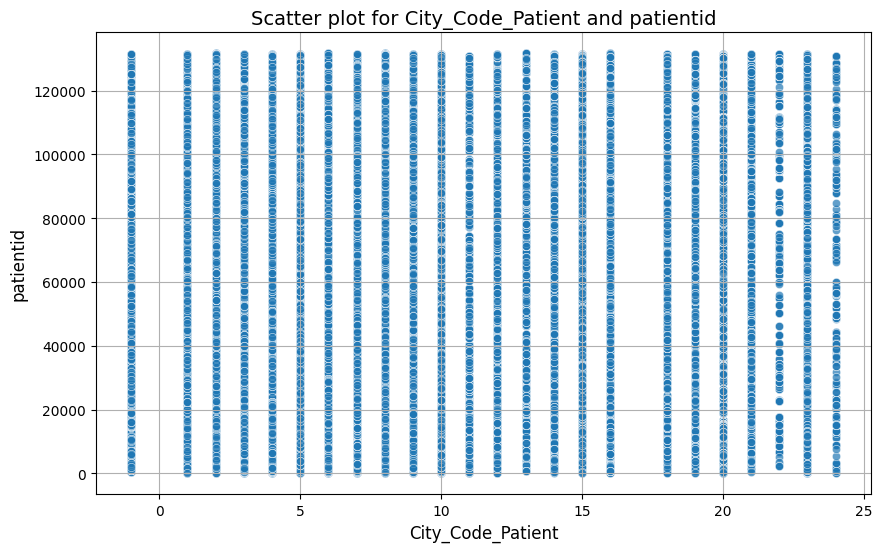

There is no strong dependency between City_Code_Patient and patientid


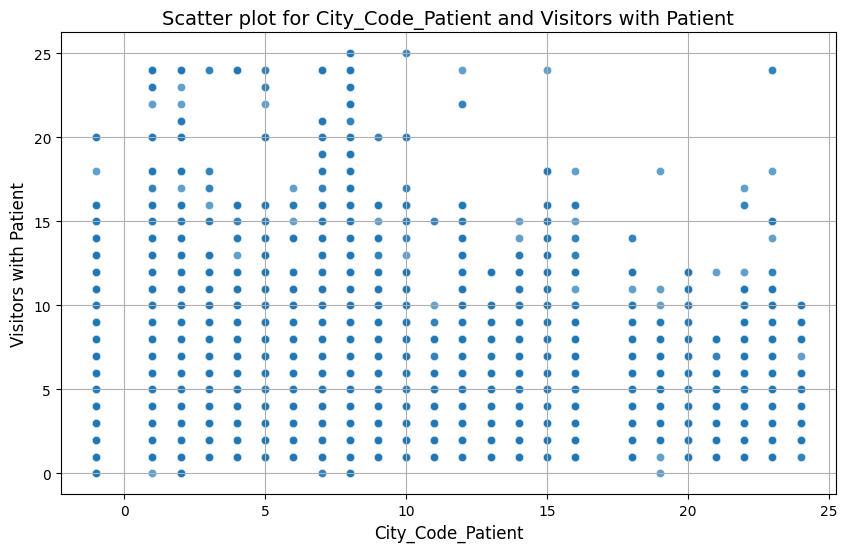

There is no strong dependency between City_Code_Patient and Visitors with Patient


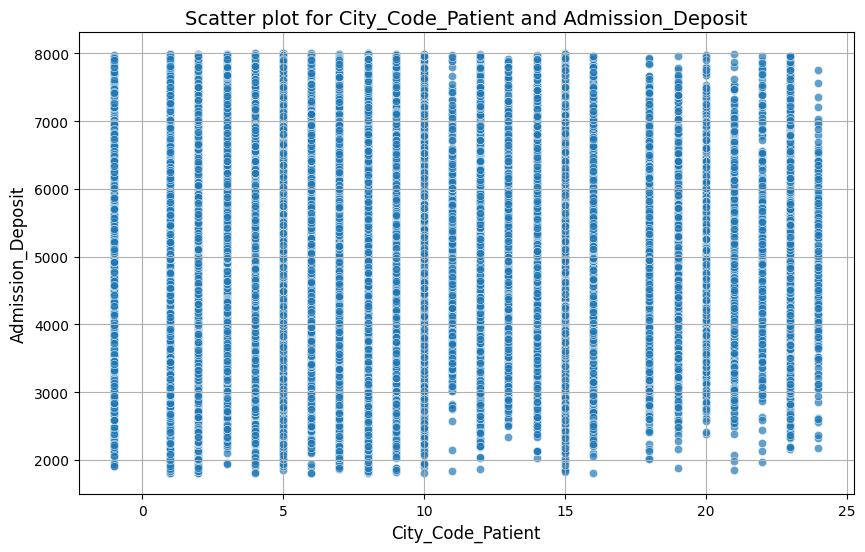

There is no strong dependency between City_Code_Patient and Admission_Deposit


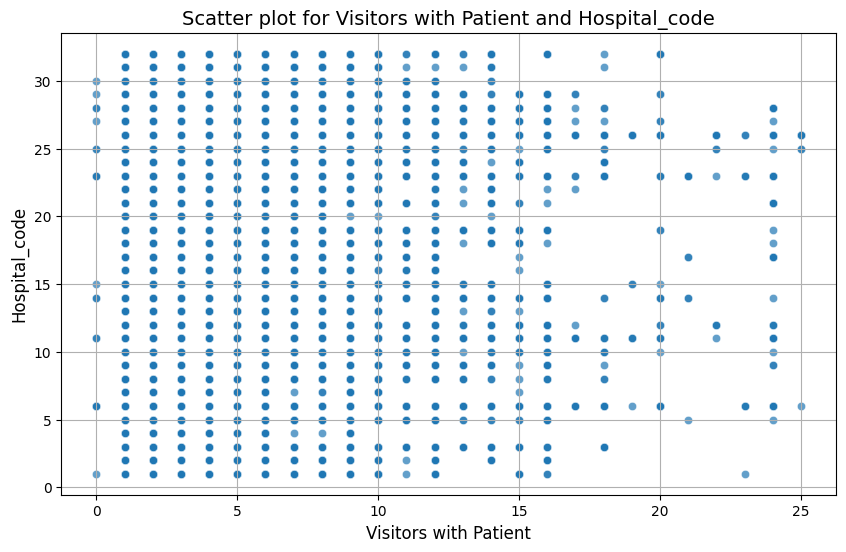

There is no strong dependency between Visitors with Patient and Hospital_code


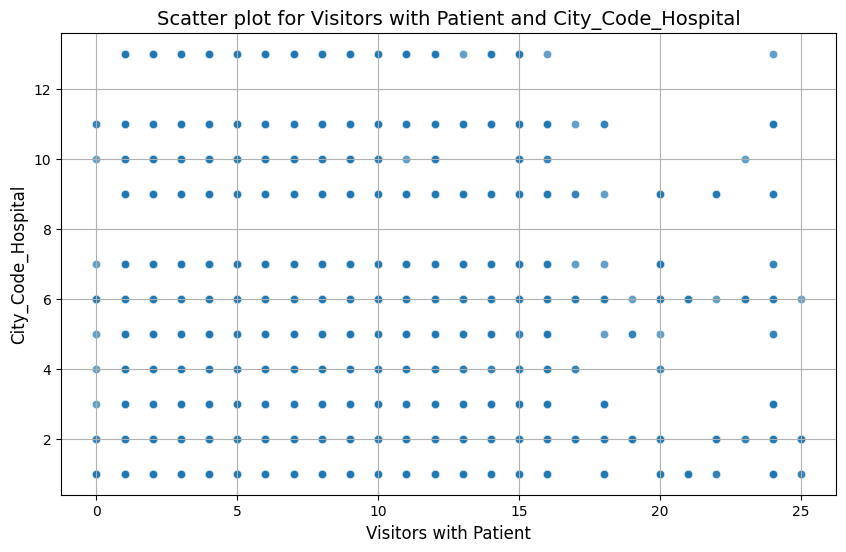

There is no strong dependency between Visitors with Patient and City_Code_Hospital


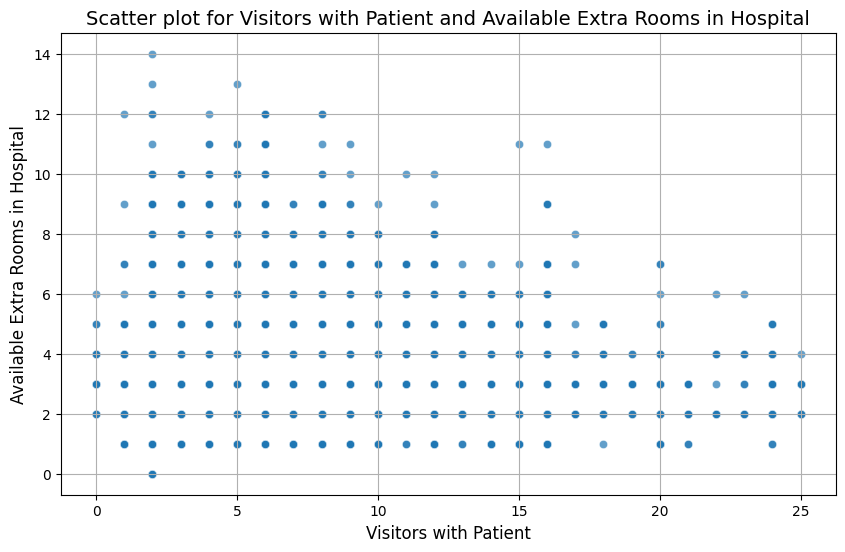

There is no strong dependency between Visitors with Patient and Available Extra Rooms in Hospital


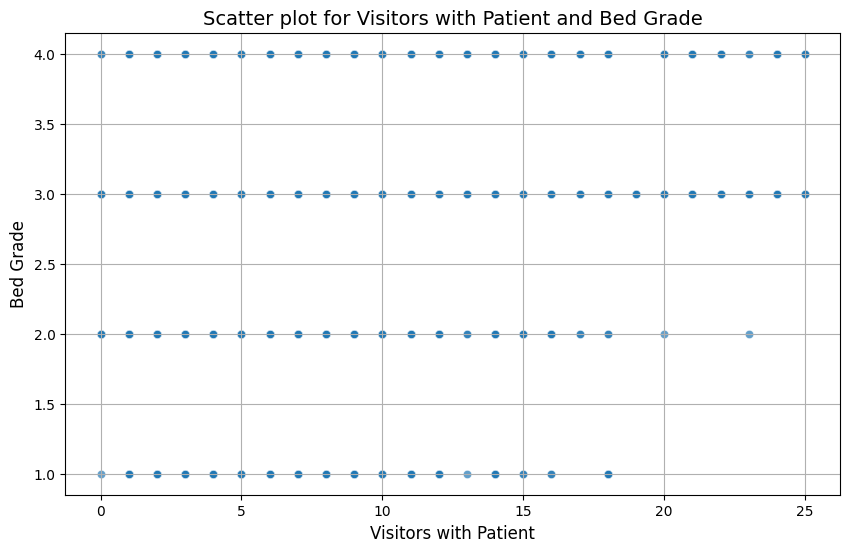

There is no strong dependency between Visitors with Patient and Bed Grade


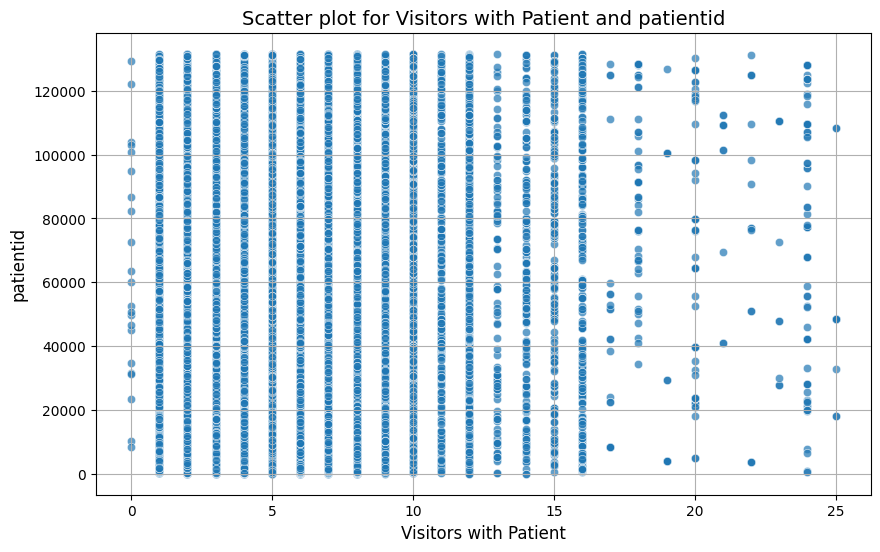

There is no strong dependency between Visitors with Patient and patientid


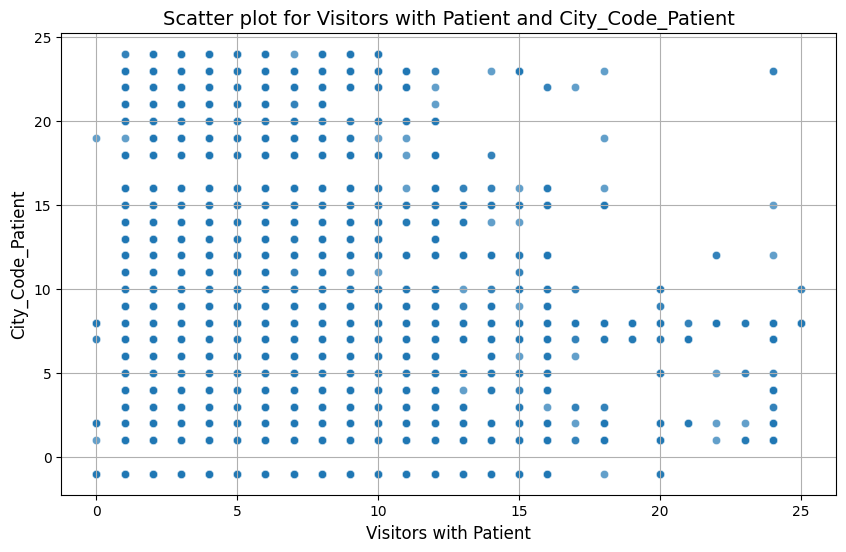

There is no strong dependency between Visitors with Patient and City_Code_Patient


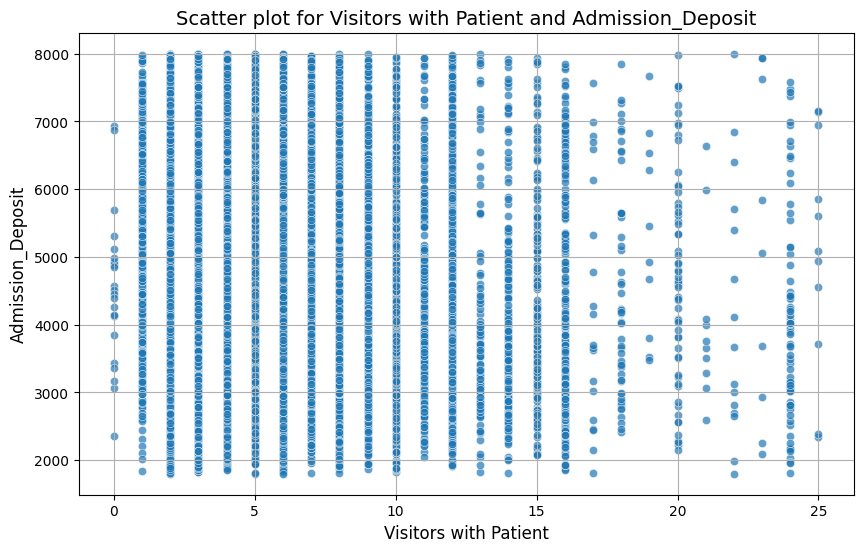

There is no strong dependency between Visitors with Patient and Admission_Deposit


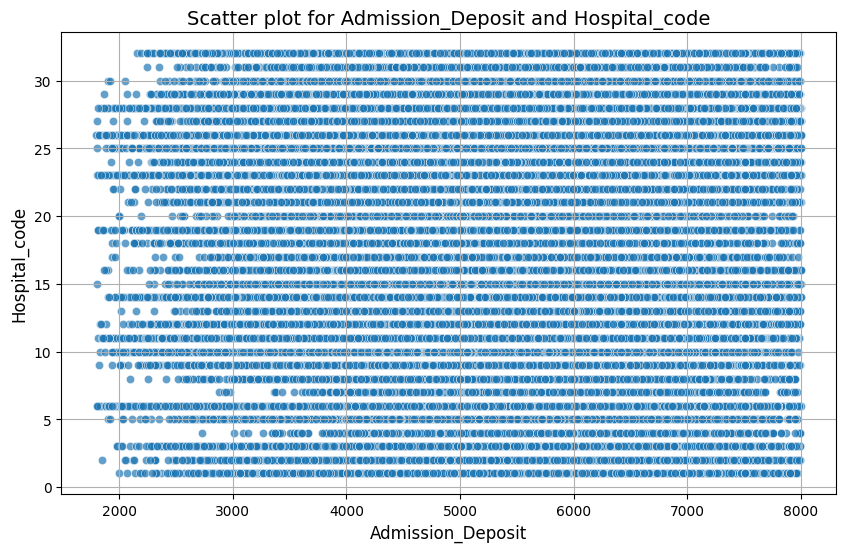

There is no strong dependency between Admission_Deposit and Hospital_code


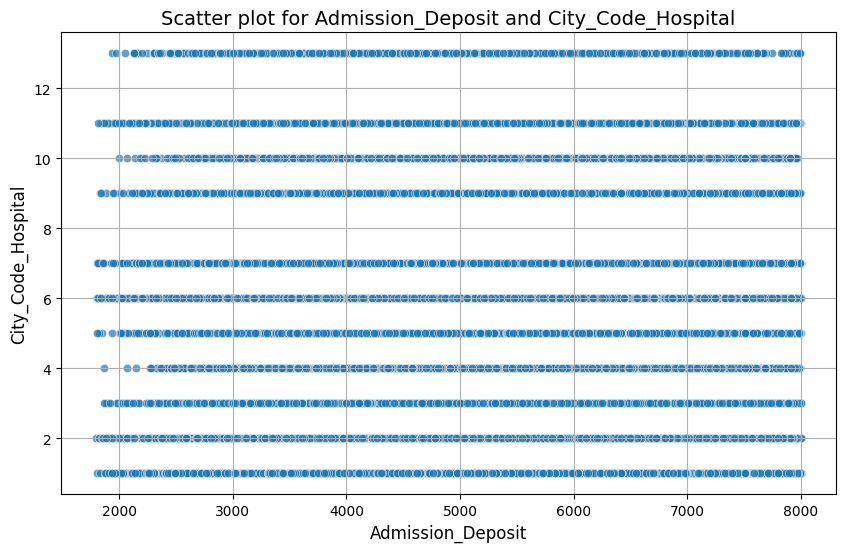

There is no strong dependency between Admission_Deposit and City_Code_Hospital


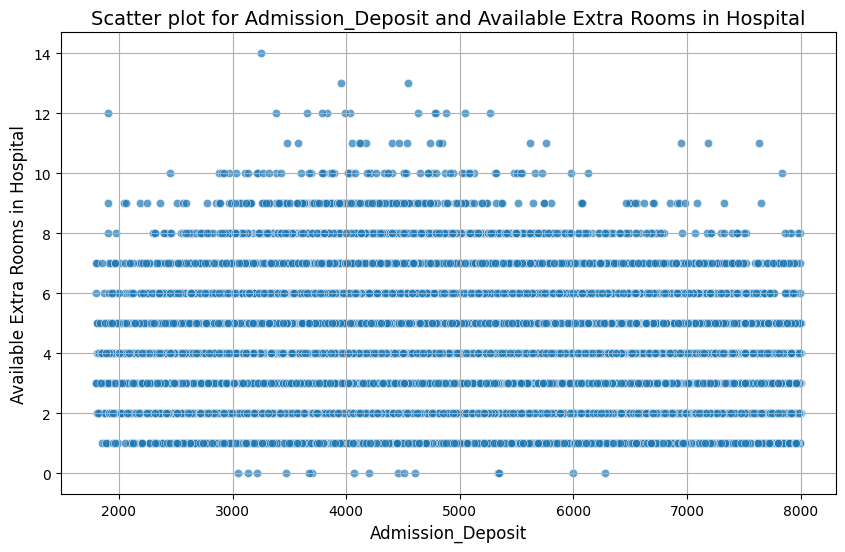

There is no strong dependency between Admission_Deposit and Available Extra Rooms in Hospital


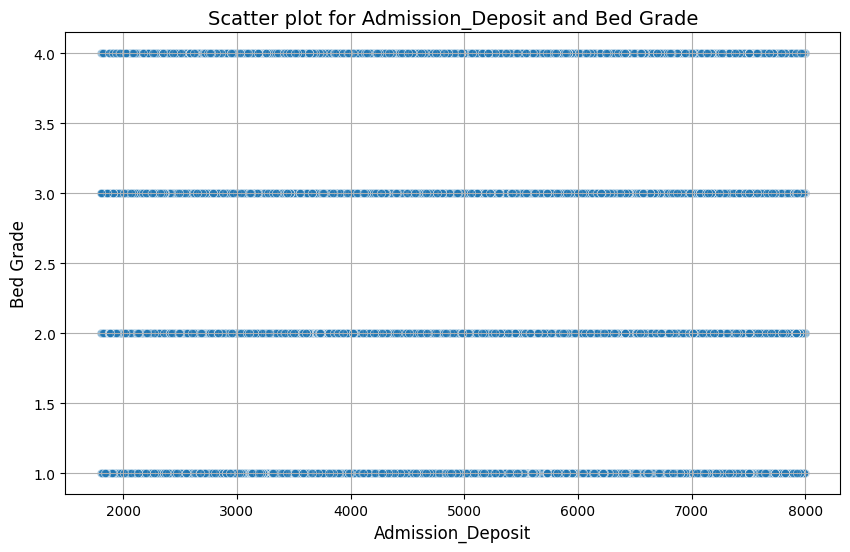

There is no strong dependency between Admission_Deposit and Bed Grade


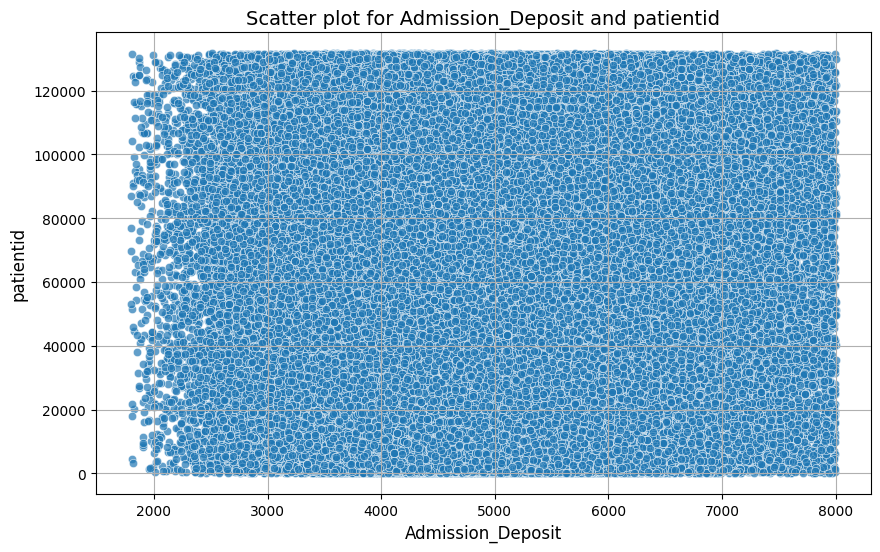

There is no strong dependency between Admission_Deposit and patientid


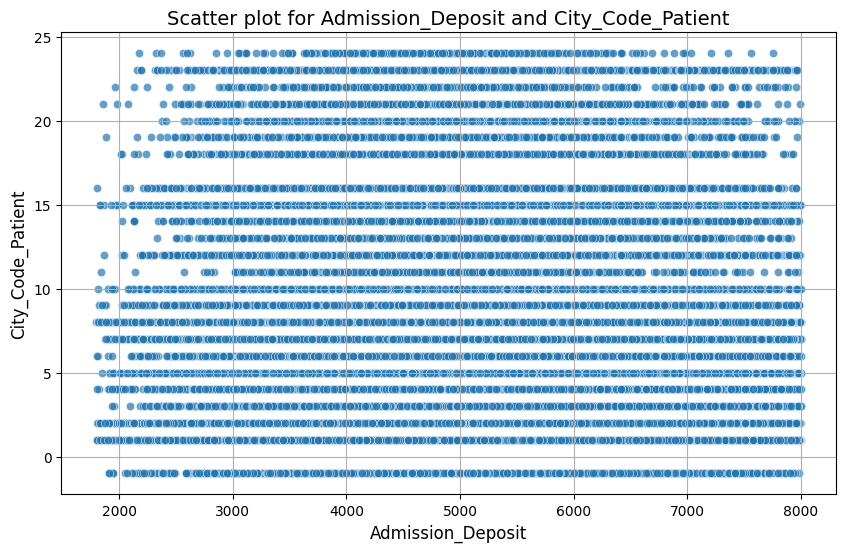

There is no strong dependency between Admission_Deposit and City_Code_Patient


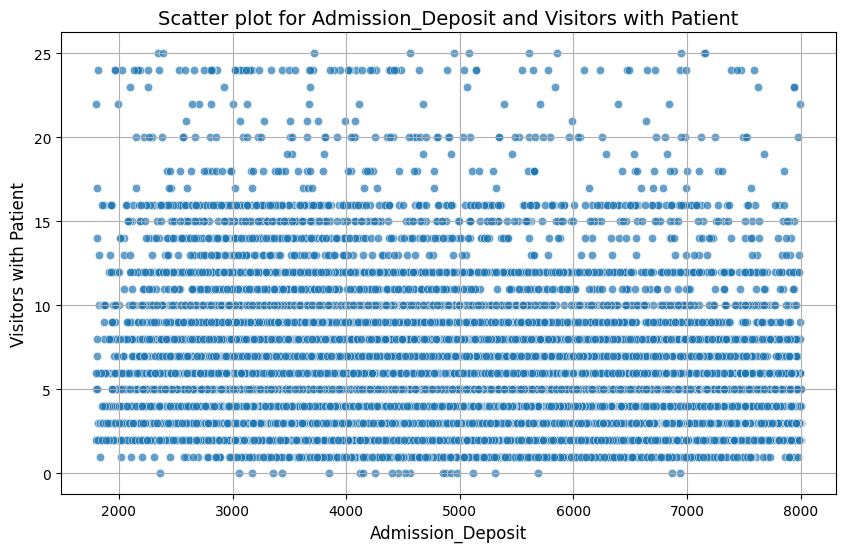

There is no strong dependency between Admission_Deposit and Visitors with Patient


In [40]:
# Scatter plots for numerical features
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=data[col1], y=data[col2], alpha=0.7)
            plt.title(f'Scatter plot for {col1} and {col2}', fontsize=14)
            plt.xlabel(col1, fontsize=12)
            plt.ylabel(col2, fontsize=12)
            plt.grid(True)
            plt.show()
            
            # Definition of dependency
            corr = data[col1].corr(data[col2])
            if abs(corr) > 0.5:
                print(f"There is a strong dependency between  {col1} and {col2} (correlation coefficient: {corr:.2f})")
            else:
                print(f"There is no strong dependency between {col1} and {col2}")

In [41]:
data

,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20
318434,24,a,1,X,2,anesthesia,Q,E,4.0,325,8.0,Urgent,Moderate,4,81-90,6699.0,31-40
318435,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20
318436,11,b,2,Y,3,anesthesia,Q,D,3.0,91081,8.0,Trauma,Minor,5,11-20,3761.0,11-20


In [43]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import optuna
import joblib

X = data.drop(columns=['Stay']) 
y = data['Stay']

categorical_features = X.select_dtypes(include=['object']).columns
numerical_features = X.select_dtypes(include=['int', 'float']).columns

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ('num', StandardScaler(), numerical_features)
    ],
    remainder='passthrough'
)

# # Data separation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Optimization using Optuna
def objective(trial):
    # Hyperparameters for RandomForest
    n_estimators = trial.suggest_int('n_estimators', 50, 300)
    max_depth = trial.suggest_int('max_depth', 3, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)

    # Building a pipeline
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=42
        ))
    ])

    # Training the model
    model.fit(X_train, y_train)

    # Forecasting
    y_pred = model.predict(X_test)

    # F1 metric for evaluation
    f1 = f1_score(y_test, y_pred, average='weighted')
    return f1

# Start Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

best_params = study.best_params
print(f"Best hyperparameters: {best_params}")

# The model is already optimized during Optuna
final_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42
    ))
])

# Retraining with optimal parameters
final_model.fit(X_train, y_train)

# Forecasting
y_pred = final_model.predict(X_test)

# Assessment of model quality
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"F1-Score: {f1}")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Saving the model
joblib.dump(final_model, 'optimized_random_forest_model.joblib')


[I 2025-01-30 21:53:59,645] A new study created in memory with name: no-name-a1a48307-51a9-4862-9b03-a446d22bef7e
[I 2025-01-30 21:54:57,803] Trial 0 finished with value: 0.35917224398596714 and parameters: {'n_estimators': 261, 'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.35917224398596714.
[I 2025-01-30 21:56:10,656] Trial 1 finished with value: 0.3810386075742812 and parameters: {'n_estimators': 236, 'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.3810386075742812.
[I 2025-01-30 21:56:40,648] Trial 2 finished with value: 0.29237872612911586 and parameters: {'n_estimators': 208, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.3810386075742812.
[I 2025-01-30 21:58:25,070] Trial 3 finished with value: 0.38450101892162897 and parameters: {'n_estimators': 300, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 3}. Best is trial 3 with va

Best hyperparameters: {'n_estimators': 264, 'max_depth': 19, 'min_samples_split': 3, 'min_samples_leaf': 1}
Accuracy: 0.42524933027789436
F1-Score: 0.39023565195551646
Classification Report:
                    precision    recall  f1-score   support

              0-10       0.43      0.13      0.21      4637
             11-20       0.42      0.50      0.45     15226
             21-30       0.42      0.66      0.51     17074
             31-40       0.44      0.25      0.31     10671
             41-50       0.30      0.00      0.00      2191
             51-60       0.42      0.52      0.46      6964
             61-70       0.50      0.00      0.00       499
             71-80       0.46      0.03      0.06      2004
             81-90       0.50      0.12      0.20       935
            91-100       0.56      0.02      0.03       507
More than 100 Days       0.58      0.42      0.49      1258

          accuracy                           0.43     61966
         macro avg       0.

['optimized_random_forest_model.joblib']

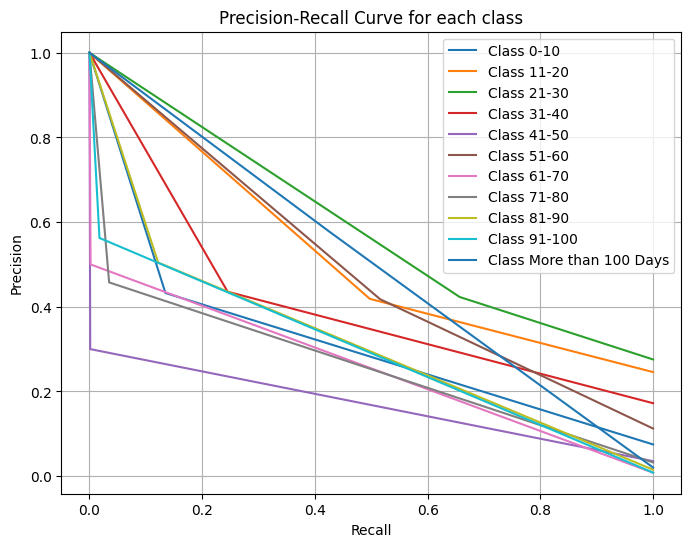

In [80]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, classification_report
import numpy as np

# Prediction for test data
y_pred = final_model.predict(X_test)

# Receiving a classification report
report = classification_report(y_test, y_pred, output_dict=True)

# Choice of classes
class_names = report.keys()

# Construct a precision-recall curve for each class
plt.figure(figsize=(8, 6))
for class_name in class_names:
    if class_name not in ['accuracy', 'macro avg', 'weighted avg']:
        precision, recall, _ = precision_recall_curve(
            (y_test == class_name).astype(int), 
            (y_pred == class_name).astype(int)
        )
        plt.plot(recall, precision, label=f'Class {class_name}')
        
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for each class')
plt.legend()
plt.grid(True)
plt.show()


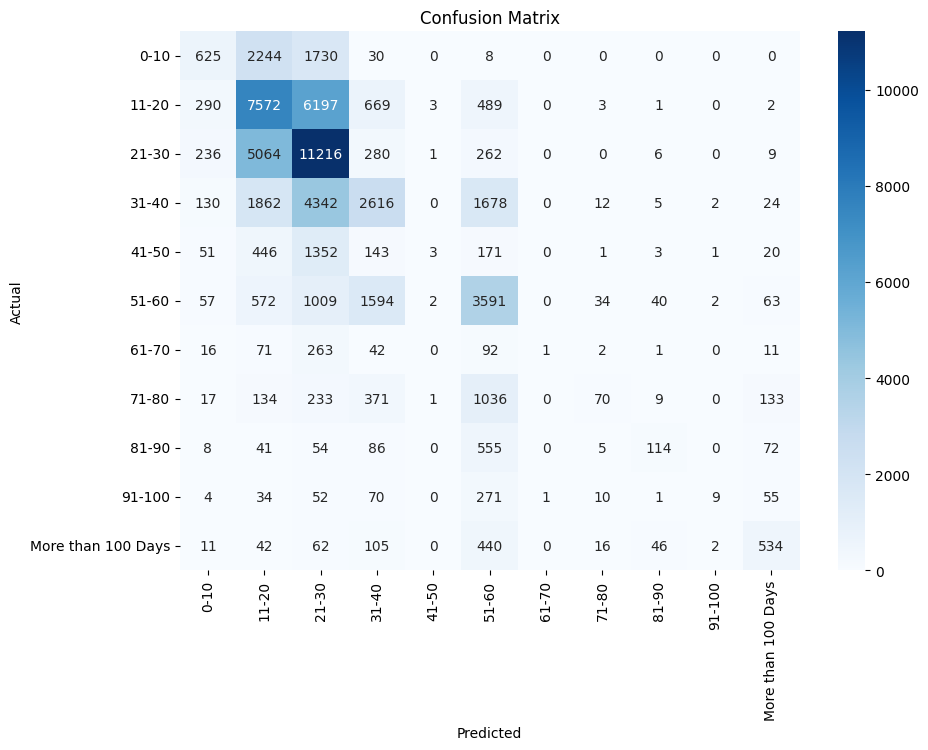

In [81]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculation of the matrix of confused results
cm = confusion_matrix(y_test, y_pred)

# Visualization of the matrix of confused results
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


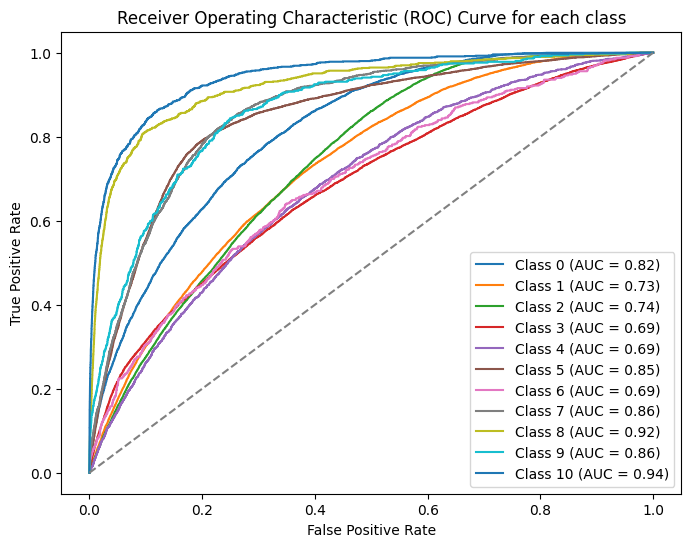

In [46]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarization of classes
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
y_pred_prob = final_model.predict_proba(X_test)

# Construction of ROC for each class
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_test))):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for each class')
plt.legend(loc='lower right')
plt.show()


In [82]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
import optuna
import joblib

# Checking the presence of the target variable in the dataset
if 'Stay' not in data.columns:
    raise ValueError("Column 'Stay' not found in the dataset.")

# Separation of data into features (X) and target variable (y)
X = data.drop(columns=['Stay']) 
y = data['Stay']

# Division into training and test samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating a preprocessor for categorical variables
categorical_features = X.select_dtypes(include=['object']).columns
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ], 
    remainder='passthrough'
)

# Optimizing hyperparameters with Optuna
def objective(trial):
    # Hyperparameters RandomForest
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            random_state=42
        ))
    ])
    
    # Training the model
    model.fit(X_train, y_train)
    
    # Forecasting
    y_pred = model.predict(X_test)
    
    # F1-Score metric
    f1 = f1_score(y_test, y_pred, average='weighted')
    return f1

# Optimization with Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print('Best hyperparameters: ', study.best_params)

# Building a model with the best parameters
best_params = study.best_params
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        random_state=42
    ))
])

# Model training
model.fit(X_train, y_train)

# Forecasting on the test sample
y_pred = model.predict(X_test)

# Evaluation of the model
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')
print(f'F1-Score: {f1}')
print('Classification Report:')
print(classification_report(y_test, y_pred))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))

joblib.dump(model, 'random_forest_model.joblib')
print(f'The model is saved to a file "random_forest_model.joblib".')


[I 2025-01-30 23:57:36,141] A new study created in memory with name: no-name-b3e9968b-fb8a-464d-91d8-914bf7e7446d
[I 2025-01-30 23:58:12,196] Trial 0 finished with value: 0.32913948347597277 and parameters: {'n_estimators': 183, 'max_depth': 6, 'min_samples_split': 10}. Best is trial 0 with value: 0.32913948347597277.
[I 2025-01-30 23:58:31,563] Trial 1 finished with value: 0.31648391841995394 and parameters: {'n_estimators': 105, 'max_depth': 5, 'min_samples_split': 3}. Best is trial 0 with value: 0.32913948347597277.
[I 2025-01-30 23:58:50,792] Trial 2 finished with value: 0.3273881709971626 and parameters: {'n_estimators': 101, 'max_depth': 6, 'min_samples_split': 8}. Best is trial 0 with value: 0.32913948347597277.
[I 2025-01-30 23:59:06,754] Trial 3 finished with value: 0.3593446192750335 and parameters: {'n_estimators': 64, 'max_depth': 9, 'min_samples_split': 7}. Best is trial 3 with value: 0.3593446192750335.
[I 2025-01-30 23:59:24,360] Trial 4 finished with value: 0.2832445341

Best hyperparameters:  {'n_estimators': 181, 'max_depth': 19, 'min_samples_split': 2}
Accuracy: 0.42432947100022594
F1-Score: 0.3902143161833128
Classification Report:
                    precision    recall  f1-score   support

              0-10       0.43      0.13      0.20      4637
             11-20       0.42      0.50      0.46     15226
             21-30       0.42      0.65      0.51     17074
             31-40       0.43      0.25      0.31     10671
             41-50       0.54      0.00      0.01      2191
             51-60       0.42      0.51      0.46      6964
             61-70       0.33      0.00      0.00       499
             71-80       0.46      0.04      0.08      2004
             81-90       0.50      0.12      0.20       935
            91-100       0.65      0.03      0.05       507
More than 100 Days       0.59      0.43      0.50      1258

          accuracy                           0.42     61966
         macro avg       0.47      0.24      0.25 